## Load libraries

In [2]:
from __future__ import division
from scipy.stats import pearsonr as corr
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import hypertools as hyp
import numpy as np
from scipy.signal import resample
from scipy.spatial.distance import correlation
from scipy.spatial.distance import cdist
from brainiak.eventseg import event
import matplotlib.patches as patches
import hypertools as hyp
from scipy.stats import ttest_ind as ttest

sns.reset_defaults()
sns.set_context('poster')
%matplotlib inline
plt.rc('figure', figsize=(12, 8))

## Load the data

In [4]:
movie_model = np.load('../data/movie_model_t100_m50_r10.npy', encoding='latin1')
recall_models = np.load('../data/recall_models_t100_m50_r10.npy', encoding='latin1')

## Plot movie model

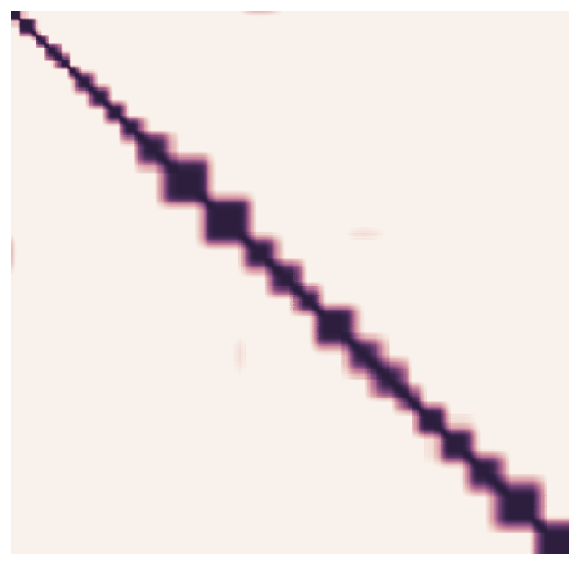

In [5]:
plt.figure(figsize=(10,10))
sns.heatmap(np.corrcoef(movie_model), xticklabels=False, vmin=0, vmax=1, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
# plt.savefig('../figures/movie_model.png')

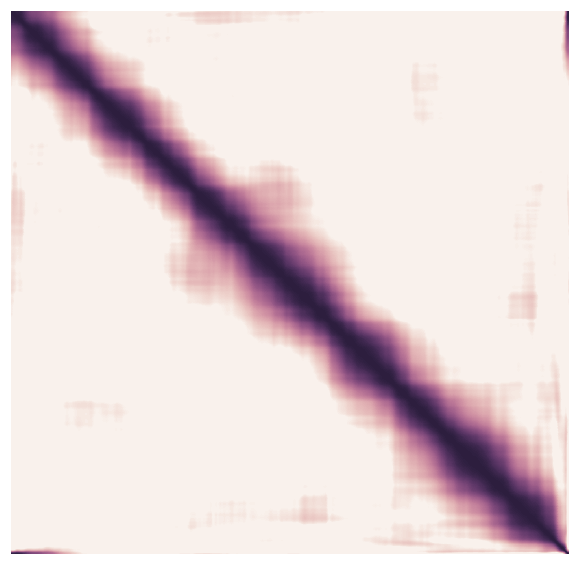

In [6]:
data = np.corrcoef(np.mean(list(map(lambda x: np.corrcoef(resample(x, 1976)), recall_models)), 0))
plt.figure(figsize=(10,10))
sns.heatmap(data, xticklabels=False, yticklabels=False, vmin=0, vmax=1, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
# plt.savefig('../figures/avg_recall_model.png')

## Compute within / across correlation for movie model as a function of k

In [5]:
m=[]
corrmat = np.corrcoef(movie_model)
for i, events in enumerate(range(1, 51)):
    ev = event.EventSegment(events)
    ev.fit(movie_model)
    t = np.round(ev.segments_[0]).astype(int)
    mask = np.sum(list(map(lambda x: np.outer(x, x), t.T)), 0).astype(bool)
    within = corrmat[mask].mean()
    across = corrmat[~mask].mean()
    m.append((within, across, within/across))

/usr/local/Cellar/python3/3.6.1/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice.
  if __name__ == '__main__':


## Plot the within and across correlation values as a function of k

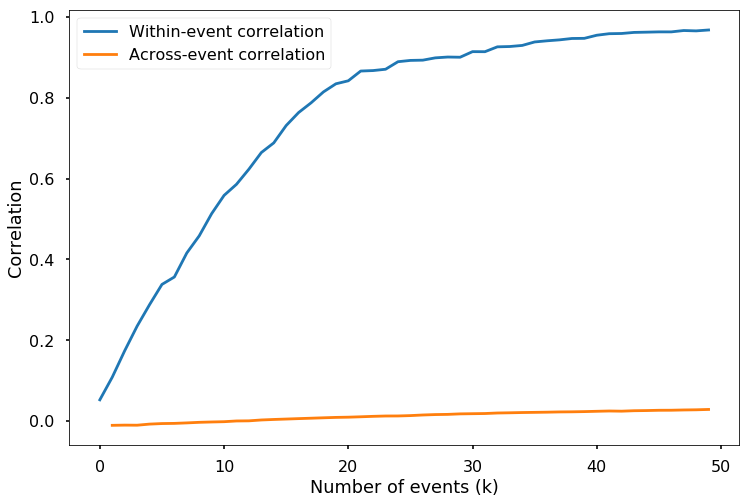

In [6]:
plt.plot(list(map(lambda x: x[0], m)), label='Within-event correlation')
plt.plot(list(map(lambda x: x[1], m)), label='Across-event correlation')
plt.legend()
plt.ylabel('Correlation')
plt.xlabel('Number of events (k)')

## Plot the ratio of within/across correlation values as a function of k

34

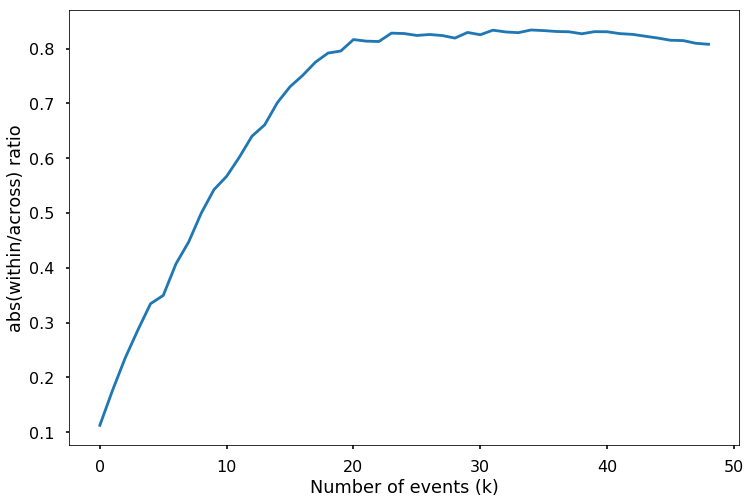

In [7]:
t=list(map(lambda x: x[0]/(x[1]-min(m[1])), m))[1:]
t/=np.max(t)
for i, v in enumerate(t):
    t[i]-=i/250
plt.plot(t, label='Within-event correlation')
plt.ylabel('abs(within/across) ratio')
plt.xlabel('Number of events (k)')
np.argmax(t)

## Fit the model with the argmax

In [8]:
# nevents = np.argmax(t)
nevents = 34
e = event.EventSegment(nevents)
e.fit(movie_model)
model_seg_inds = [np.round(e).astype(bool) for e in e.segments_[0].T]
model_segments = np.atleast_2d(np.array(list(map(lambda x: np.mean(movie_model[x, :], 0), model_seg_inds))))
model_segments.shape

(34, 100)

## Plot the result

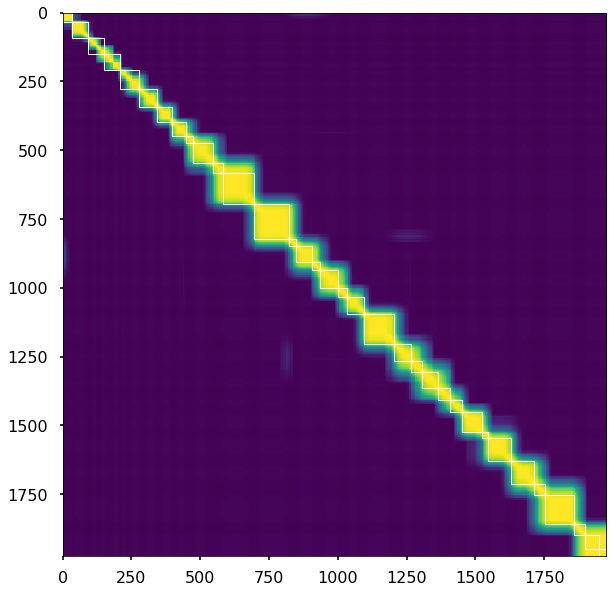

In [9]:
nTR=1976
bounds = np.where(np.diff(np.argmax(e.segments_[0], axis=1)))[0]
plt.figure(figsize=(10,10))
plt.imshow(np.corrcoef(movie_model))
ax = plt.gca()
bounds_aug = np.concatenate(([0],bounds,[nTR]))
for i in range(len(bounds_aug)-1):
    rect = patches.Rectangle((bounds_aug[i],bounds_aug[i]),bounds_aug[i+1]-bounds_aug[i],bounds_aug[i+1]-bounds_aug[i],linewidth=1,edgecolor='w',facecolor='none')
    ax.add_patch(rect)

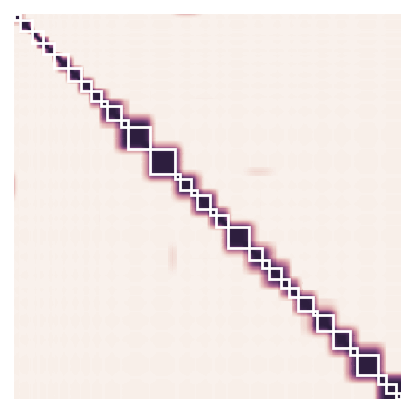

In [980]:
# nevents = 34
# e = event.EventSegment(nevents)
# e.fit(movie_model)
# model_seg_inds = [np.round(e).astype(bool) for e in e.segments_[0].T]
# model_segments = np.atleast_2d(np.array(list(map(lambda x: np.mean(movie_model[x, :], 0), model_seg_inds))))

nTR=1976
bounds = np.where(np.diff(np.argmax(e.segments_[0], axis=1)))[0]
plt.figure(figsize=(5,5))
ax = sns.heatmap(np.corrcoef(movie_model), xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
bounds_aug = np.concatenate(([0],bounds,[nTR]))
for i in range(len(bounds_aug)-1):
    rect = patches.Rectangle((bounds_aug[i],bounds_aug[i]),bounds_aug[i+1]-bounds_aug[i],bounds_aug[i+1]-bounds_aug[i],linewidth=2,edgecolor='w',facecolor='none')
    ax.add_patch(rect)

## Compute the same metrics, now on the recall matrices adding a penalty term that scales linearly with k 

Best k for subject 1 is 8


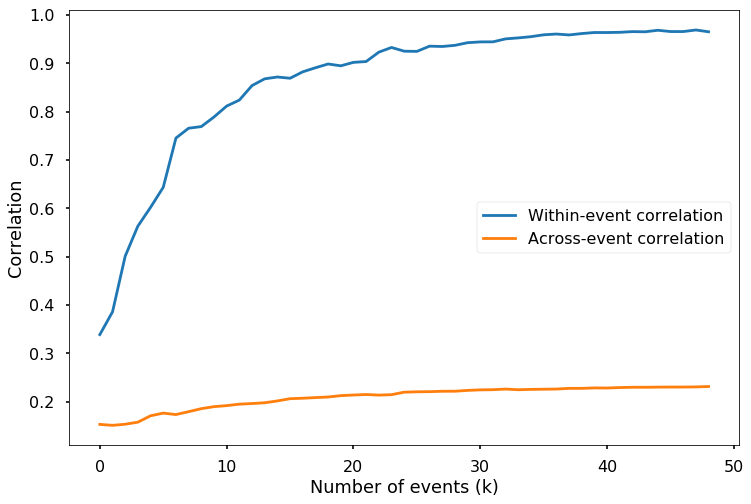

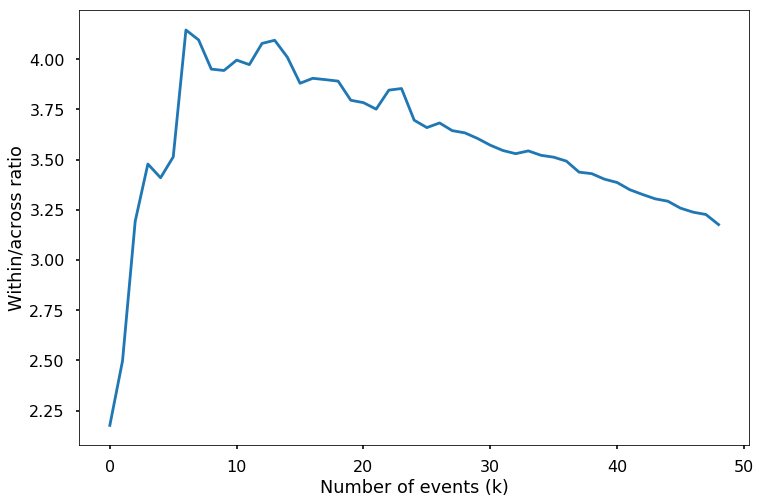

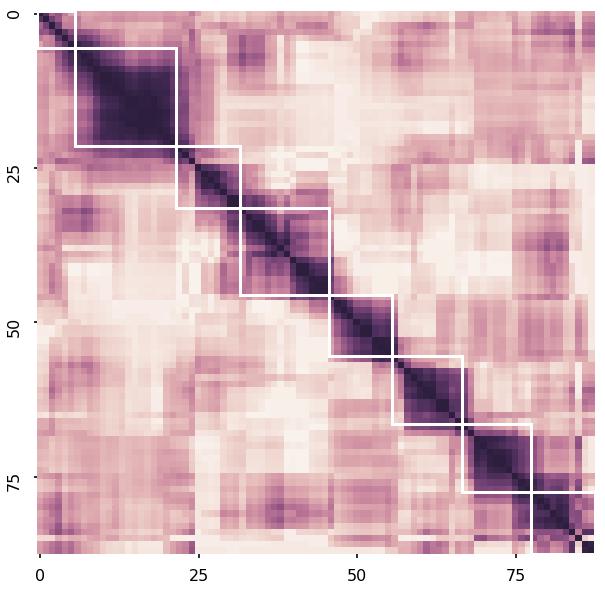

Best k for subject 2 is 14


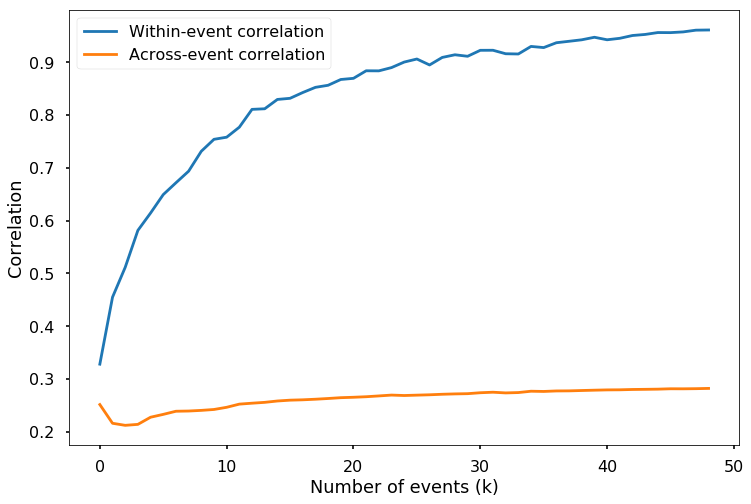

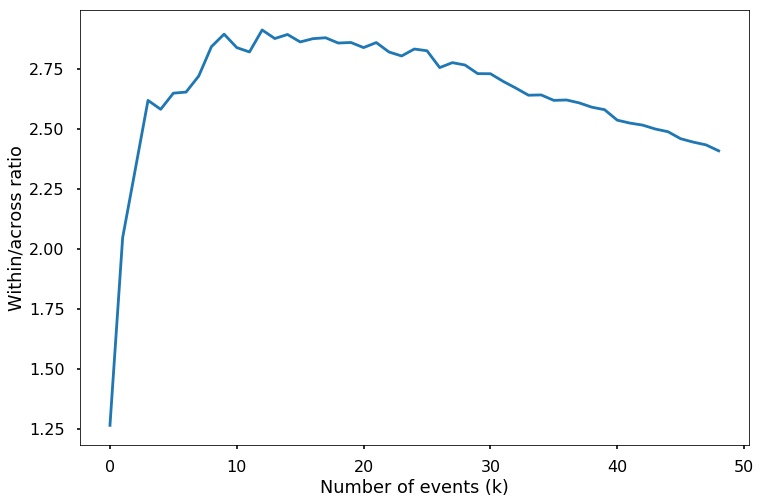

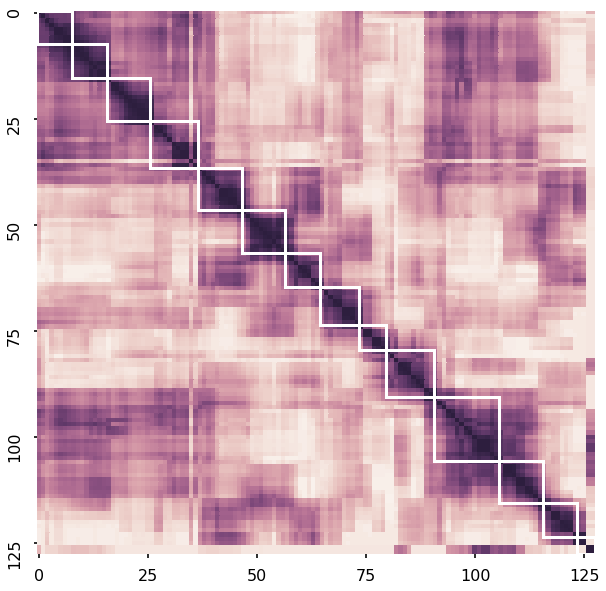

Best k for subject 3 is 11


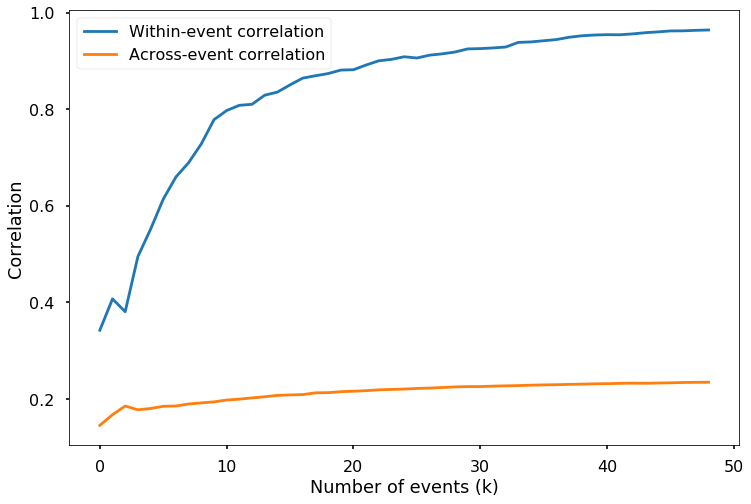

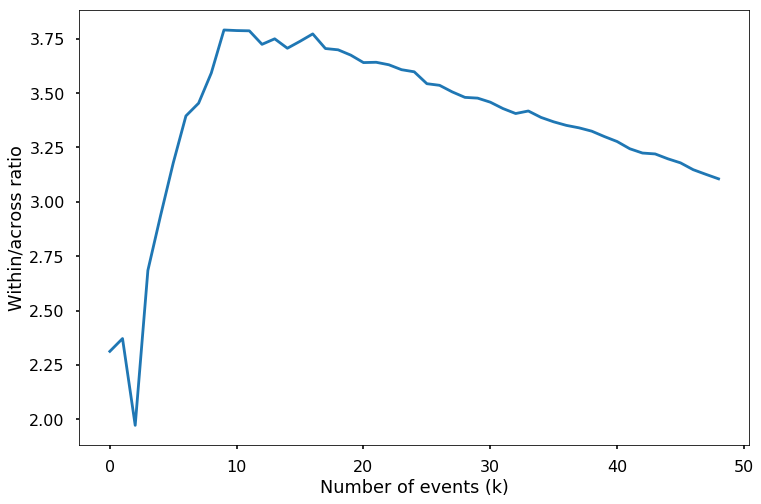

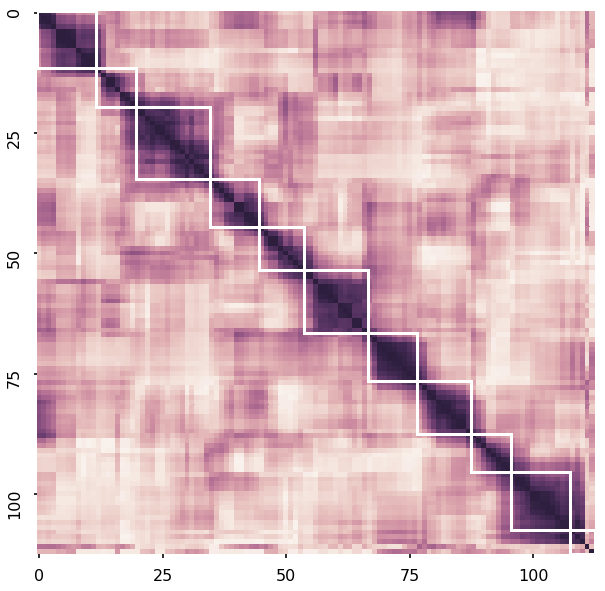

Best k for subject 4 is 9


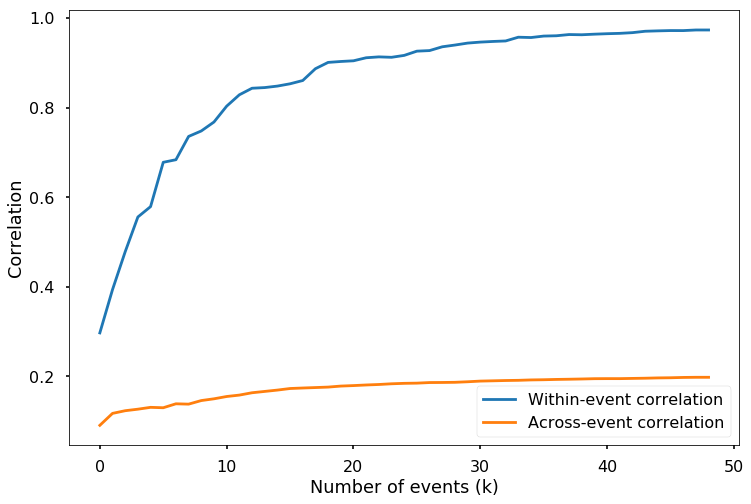

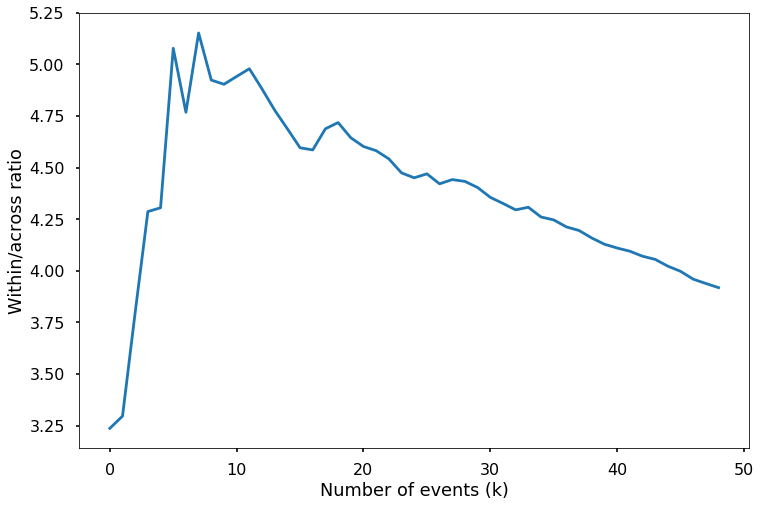

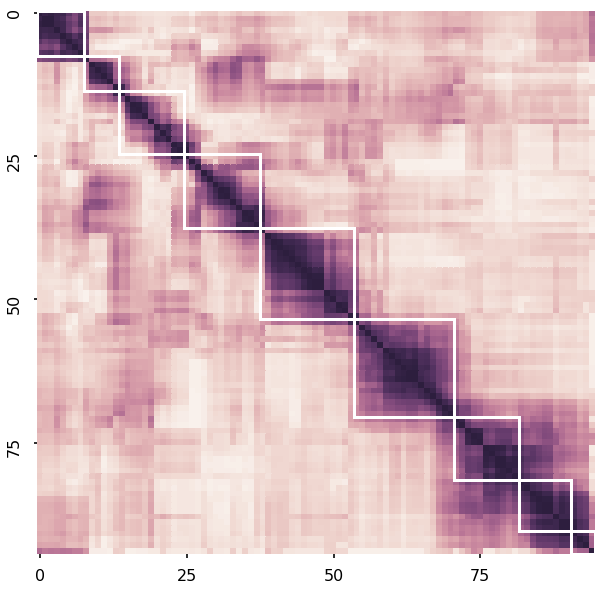

Best k for subject 5 is 14


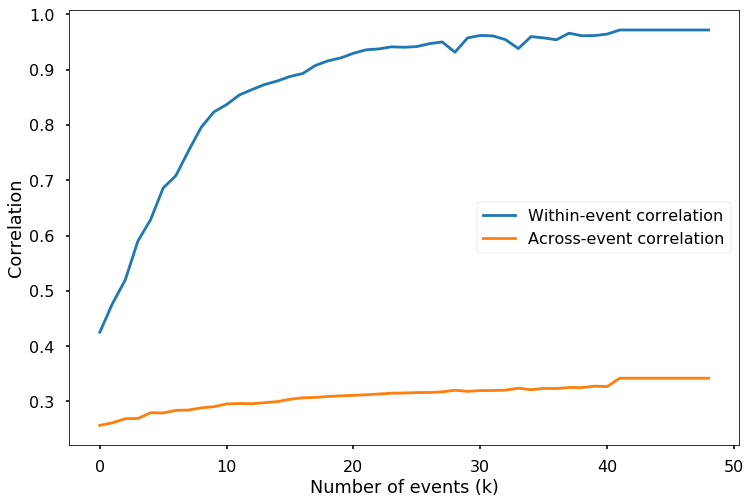

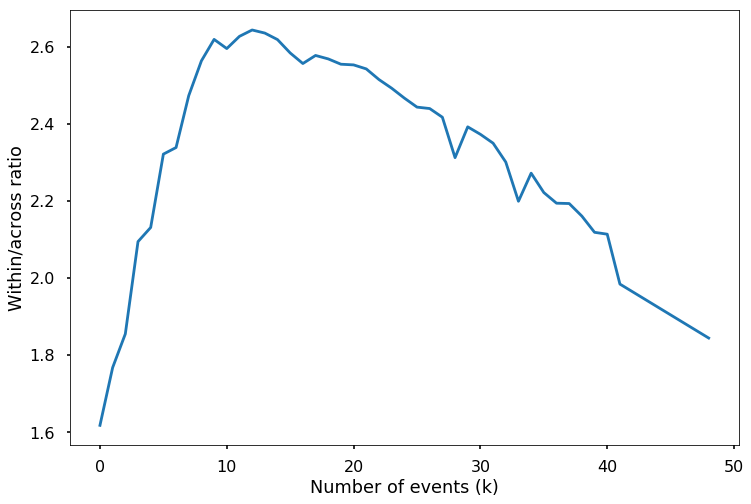

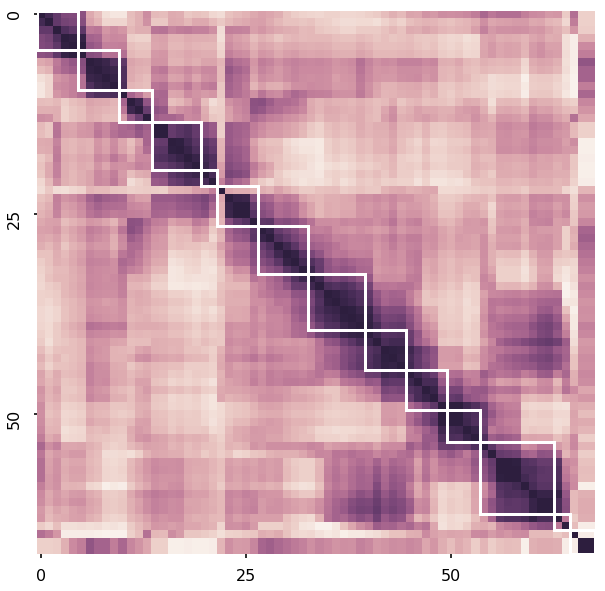

Best k for subject 6 is 10


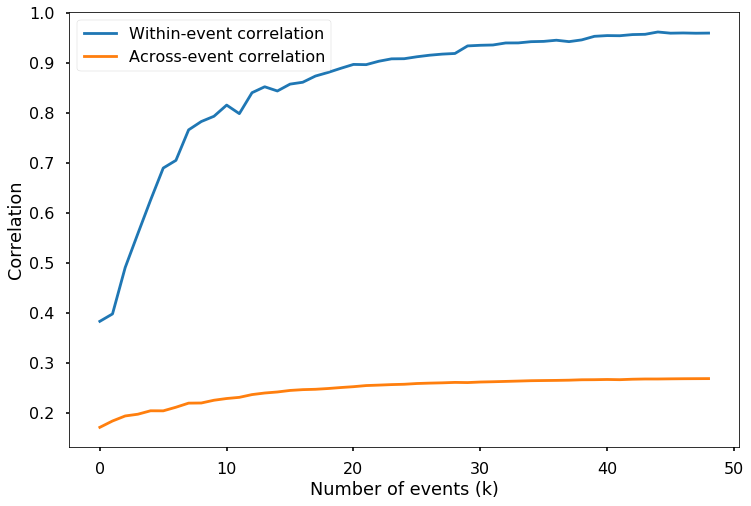

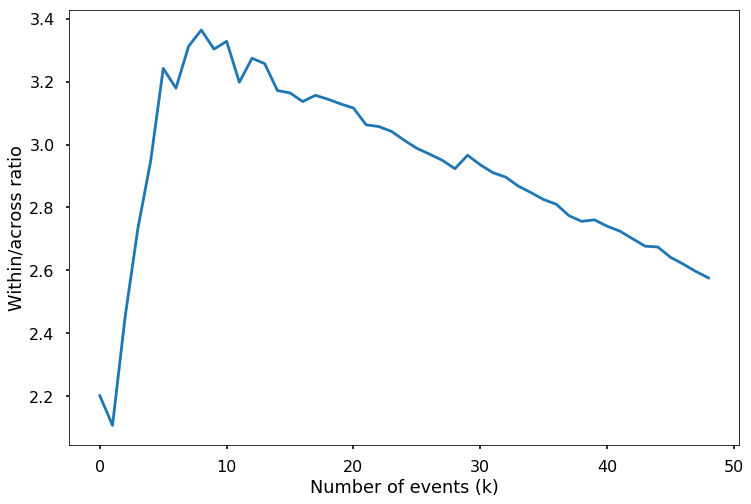

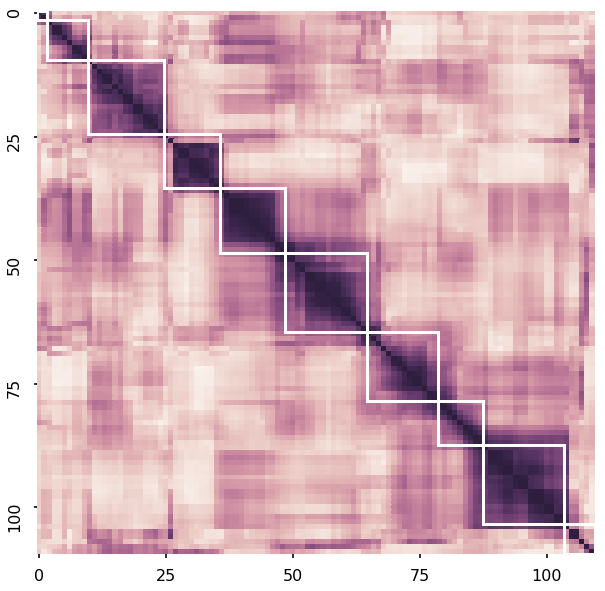

Best k for subject 7 is 17


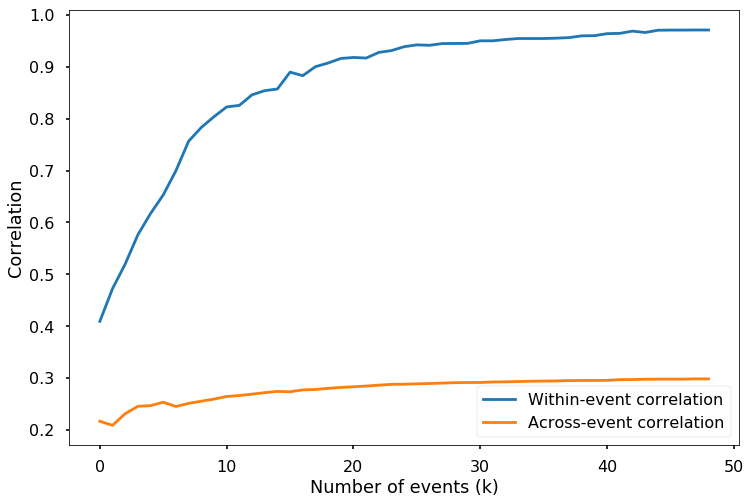

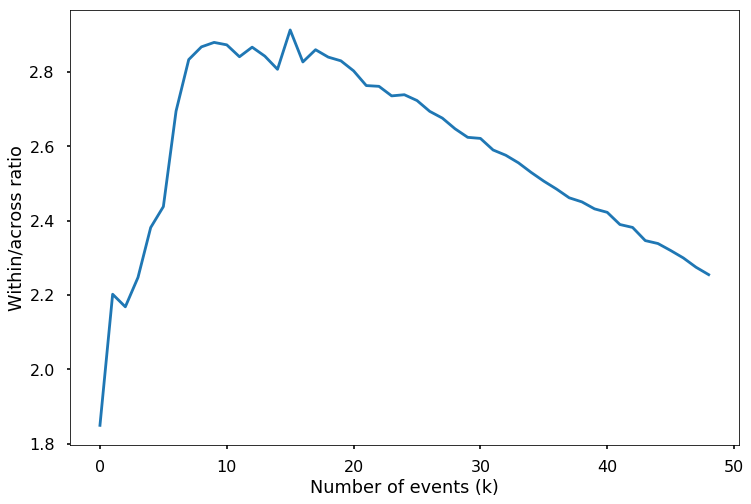

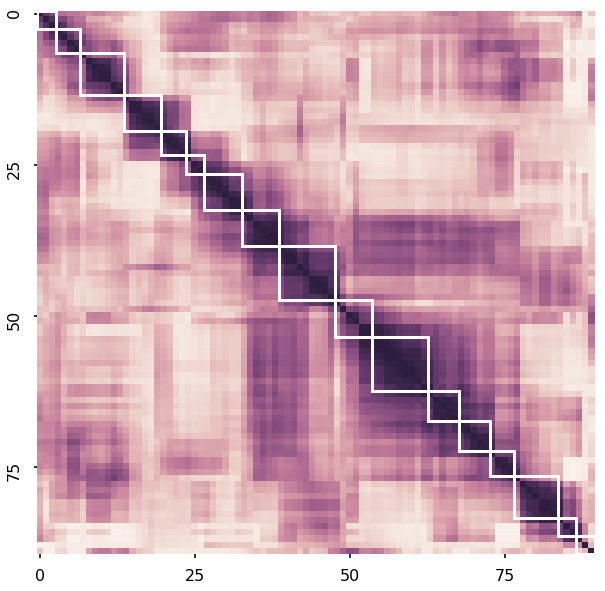

Best k for subject 8 is 17


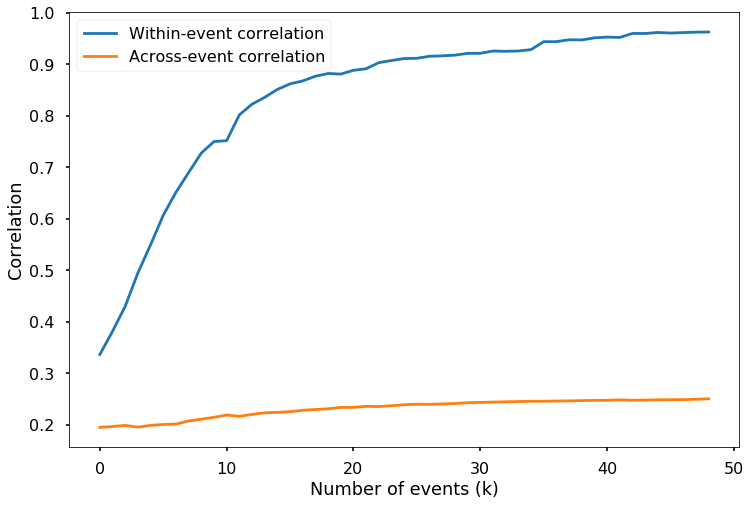

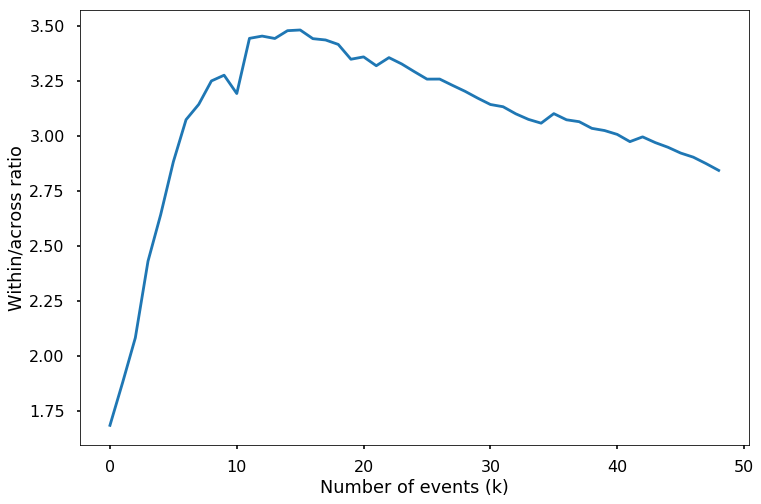

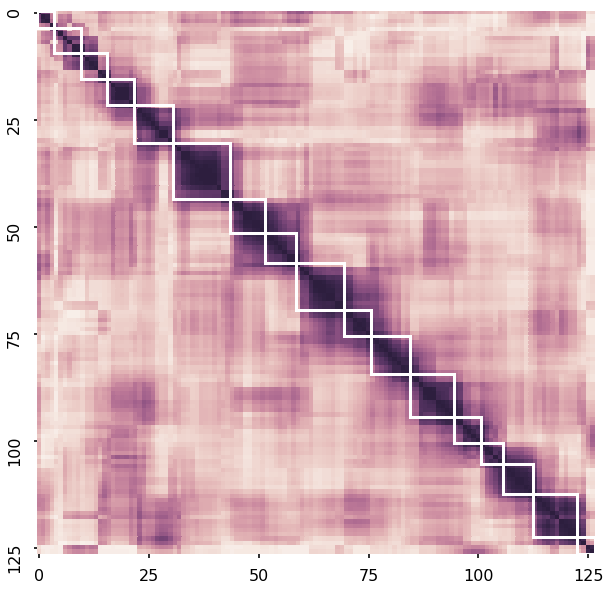

Best k for subject 9 is 10


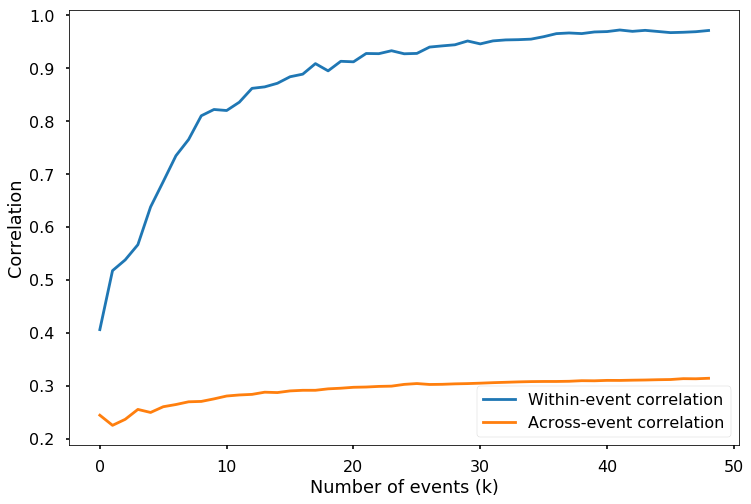

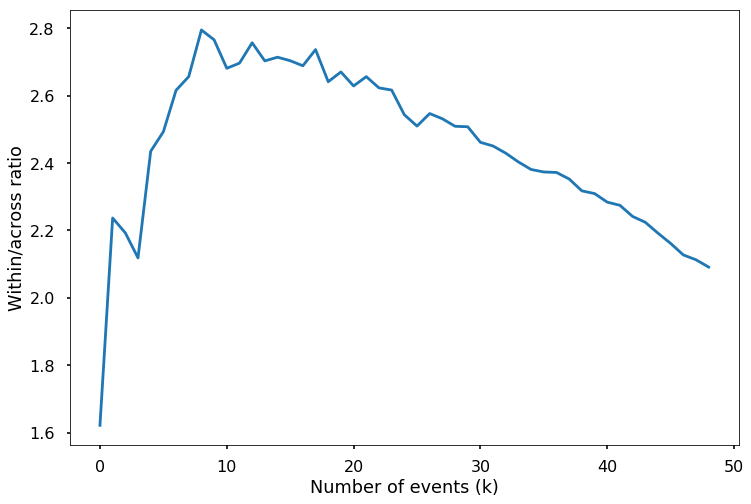

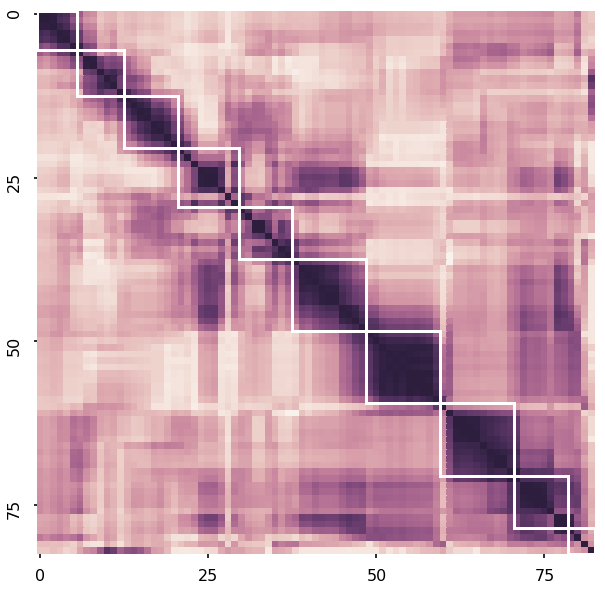

Best k for subject 10 is 20


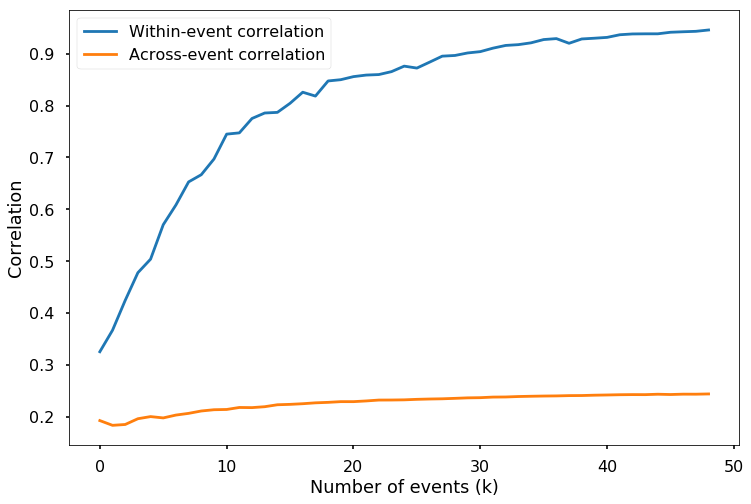

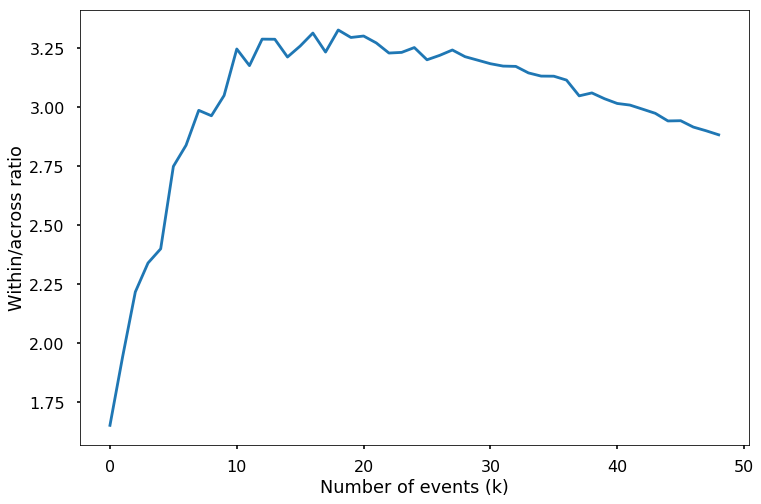

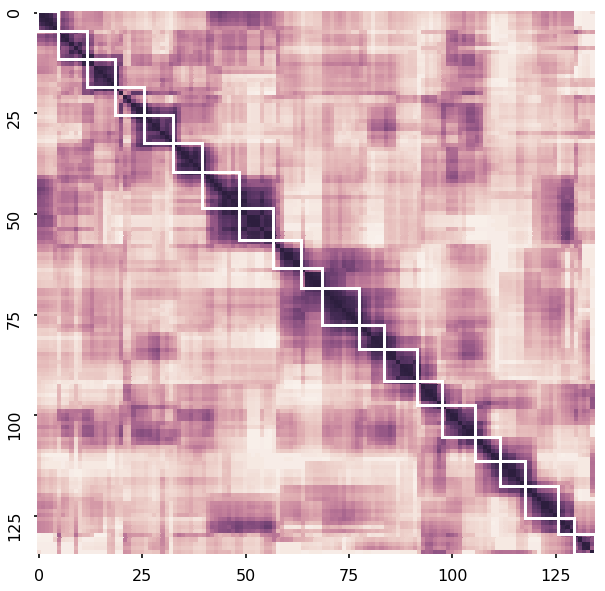

Best k for subject 11 is 19


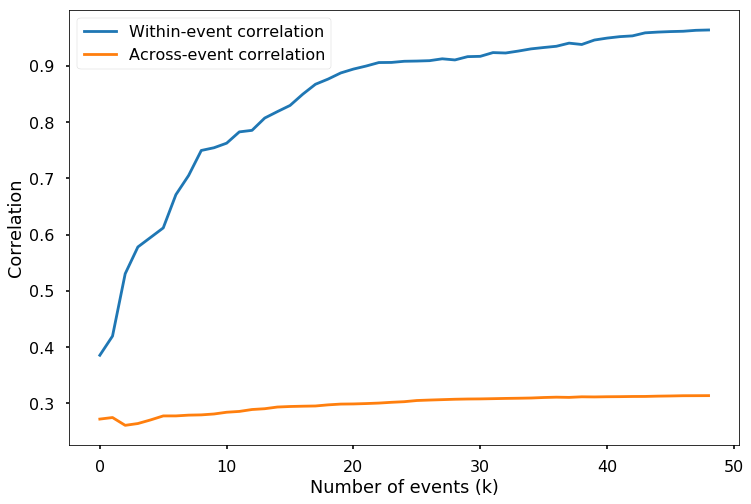

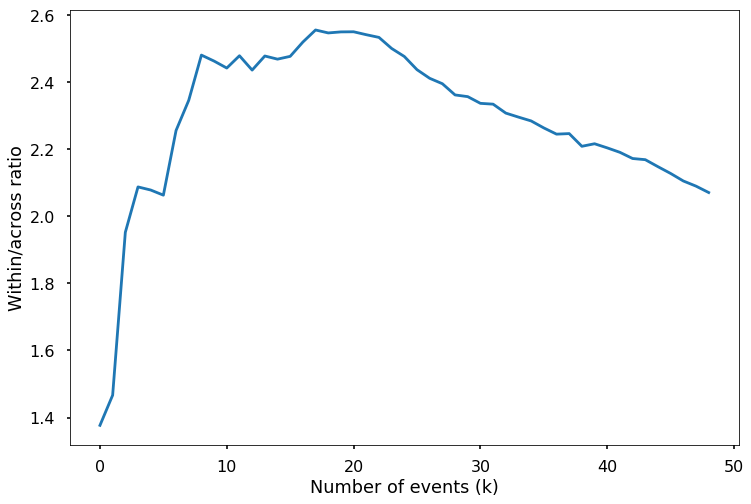

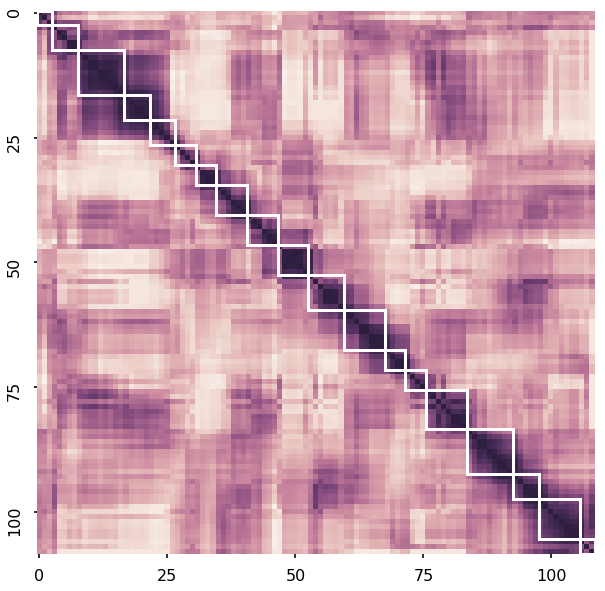

Best k for subject 12 is 25


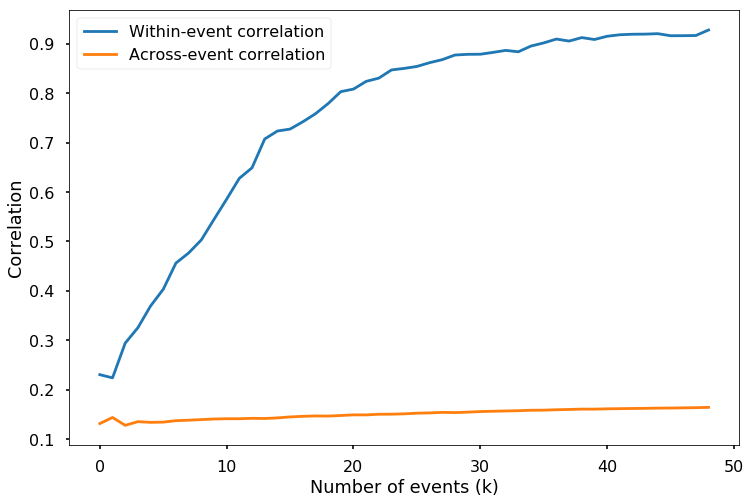

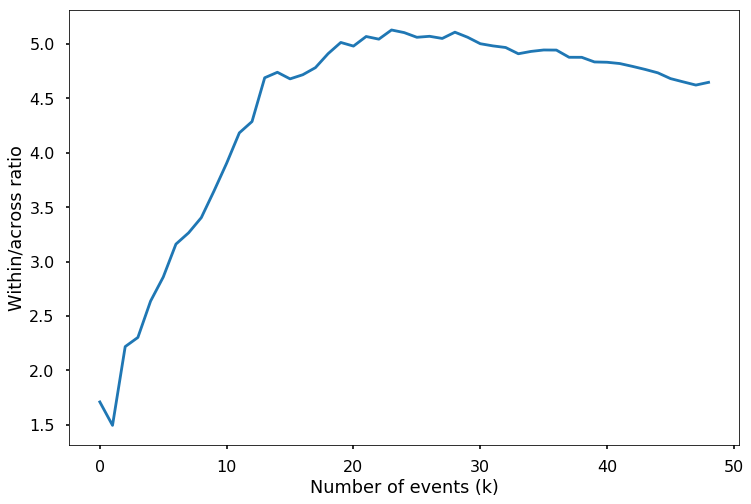

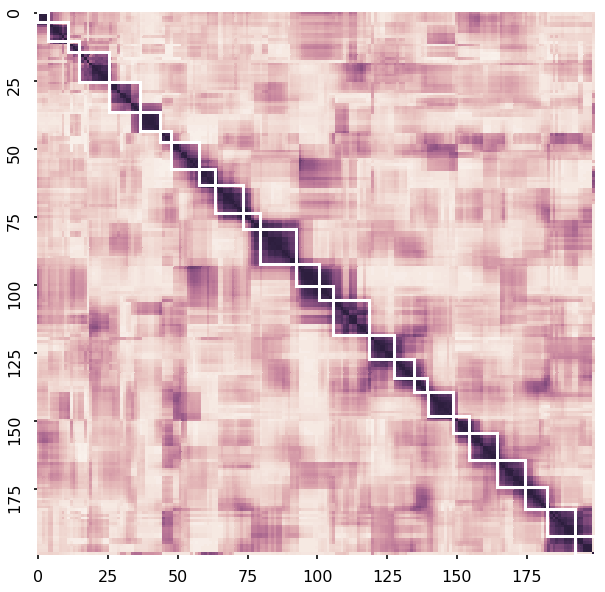

Best k for subject 13 is 27


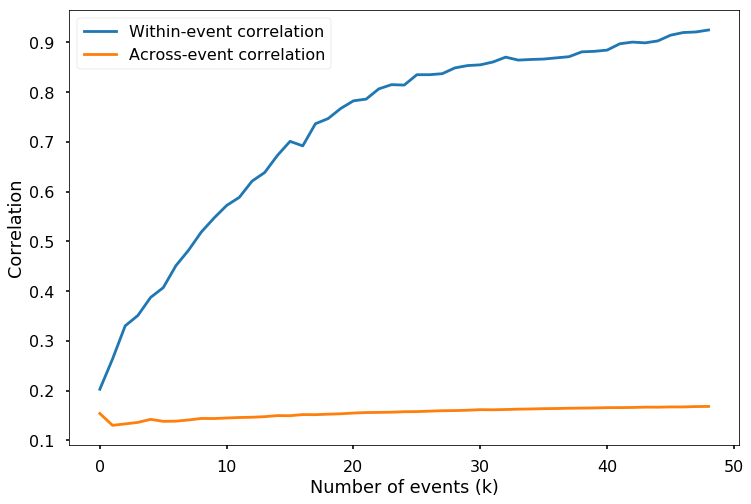

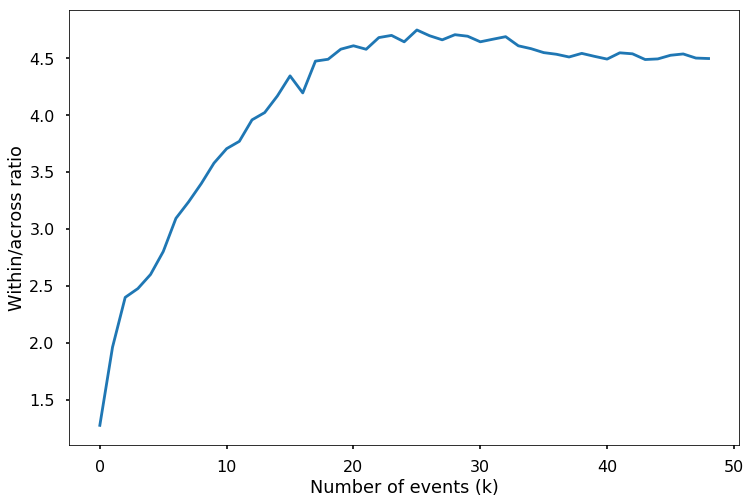

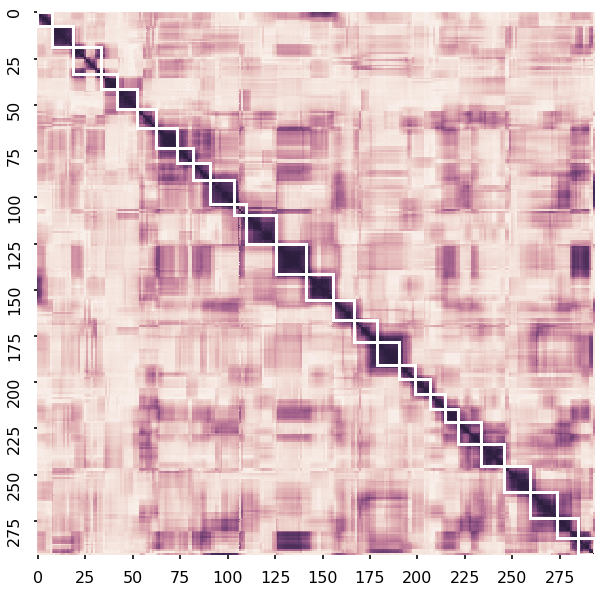

Best k for subject 14 is 14


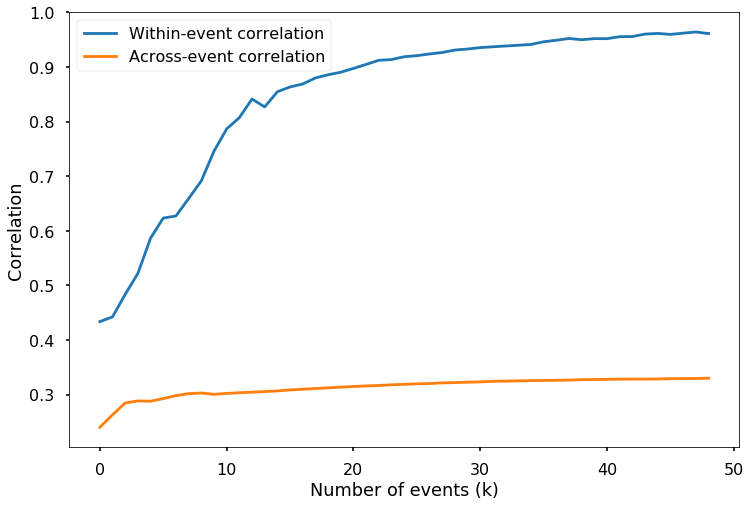

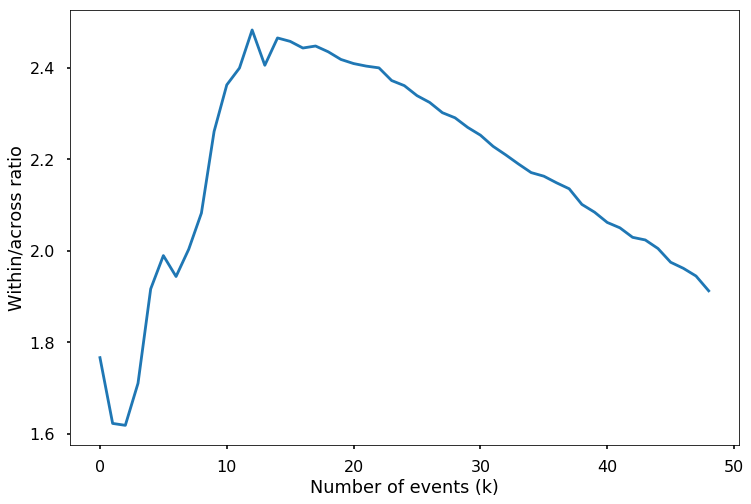

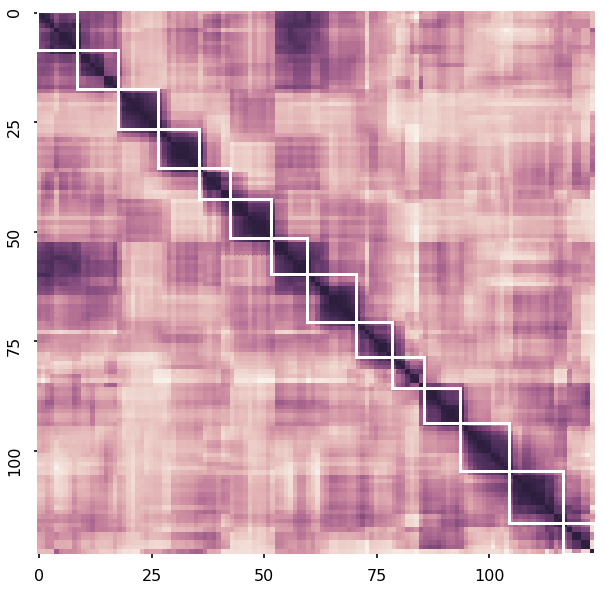

Best k for subject 15 is 10


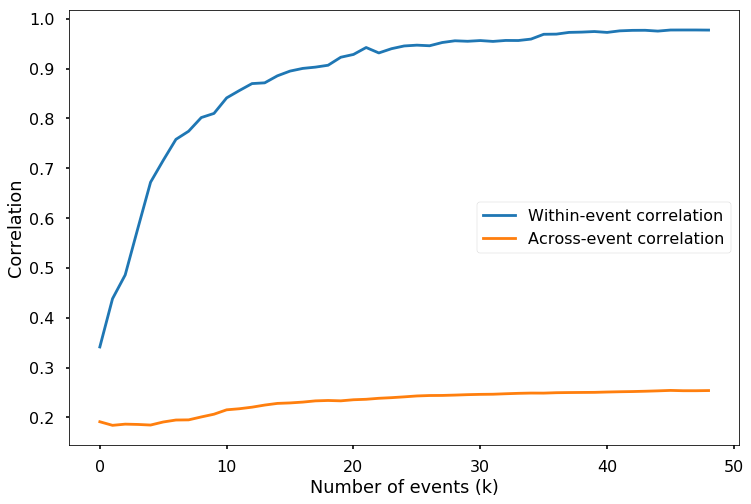

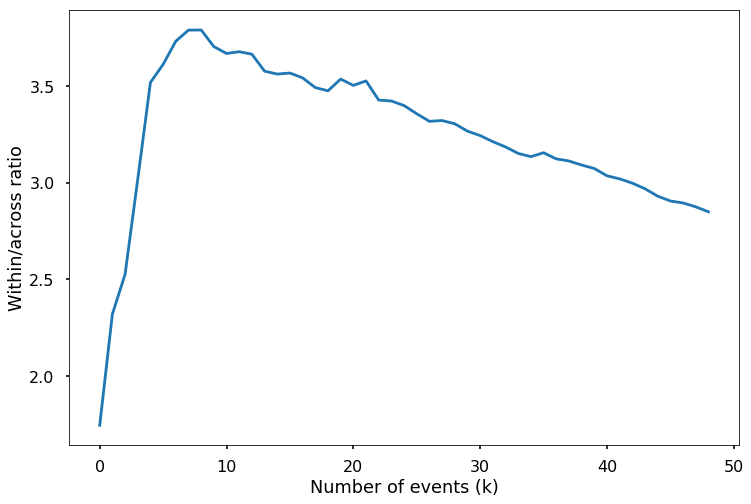

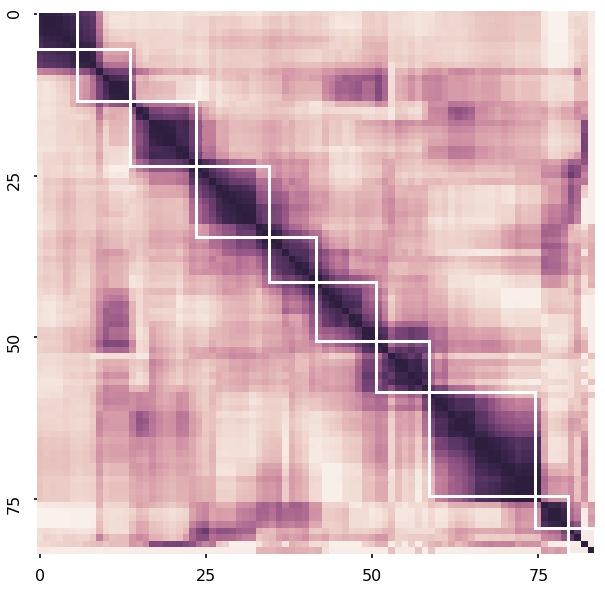

Best k for subject 16 is 14


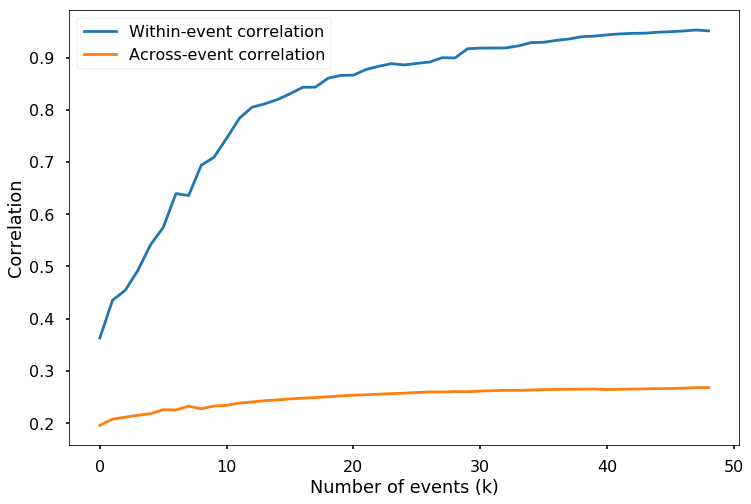

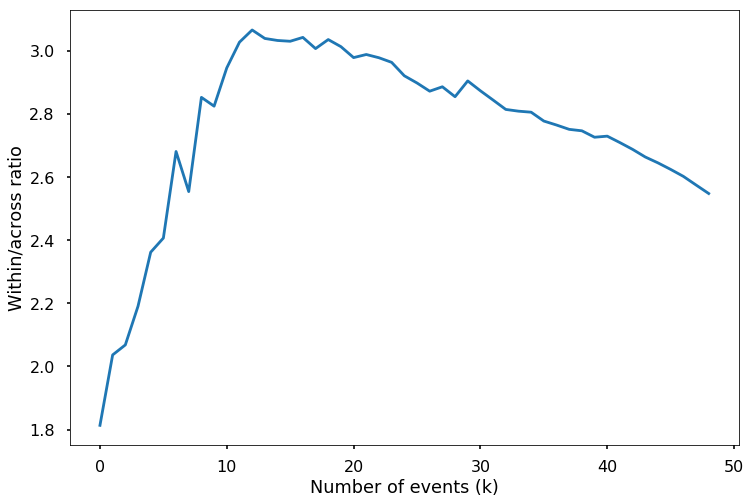

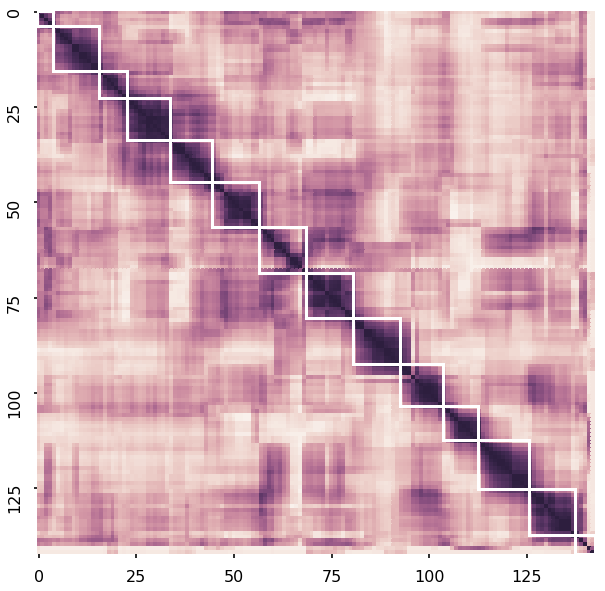

Best k for subject 17 is 23


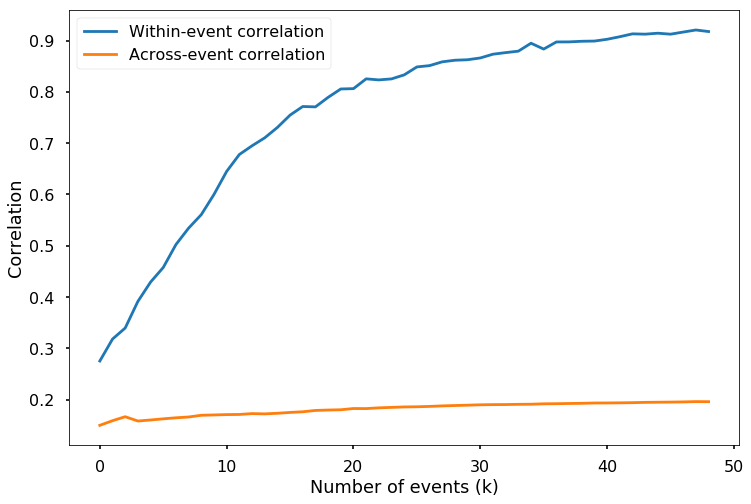

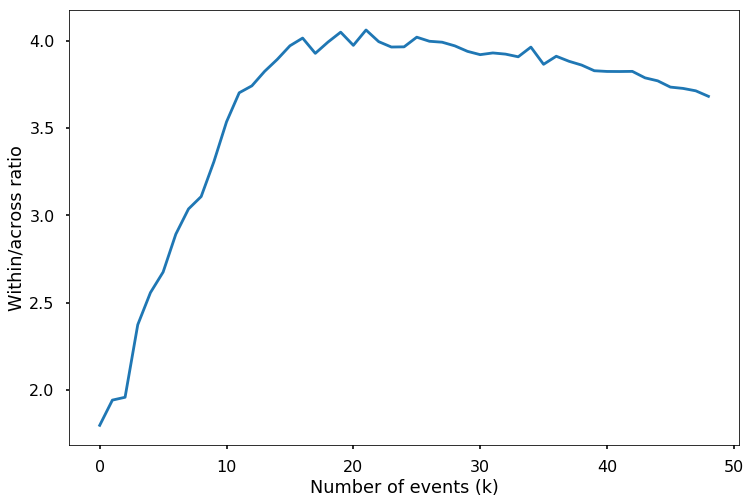

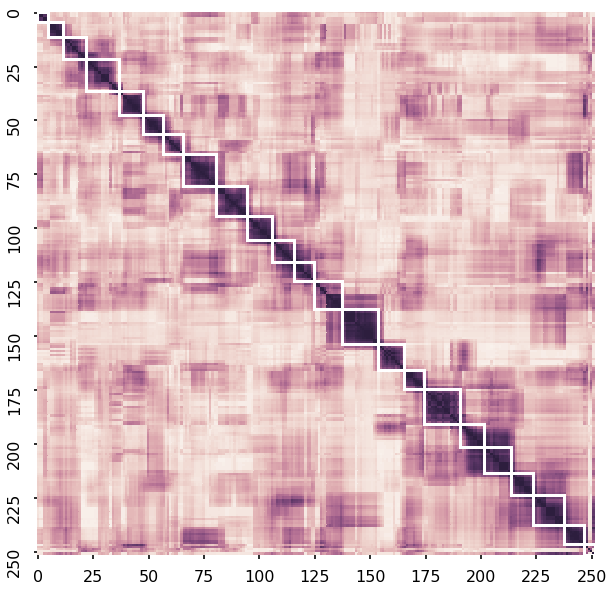

In [10]:
maxks_penalty = []

# loop over models
for i, model in enumerate(recall_models):
    
    # compute the correlation matrix
    corrmat = np.corrcoef(model)
    
    # initialize m
    m=[]
    
    kvals = list(range(2, 51))
    
    # loop over the number of events
    for k in kvals:
        
        # fit the model
        ev = event.EventSegment(k)
        ev.fit(model)
        
        # compute within / across by k
        t = np.round(ev.segments_[0]).astype(int)
        mask = np.sum(list(map(lambda x: np.outer(x, x), t.T)), 0).astype(bool)
        within = corrmat[mask].mean()
        across = corrmat[~mask].mean()
        m.append((within, across, ((within/across)-(k/50))))
        
    # get the k with the greatest within / across ratio
    maxk = kvals[np.argmax(list(map(lambda x: x[2], m)))]
    maxks_penalty.append(maxk)
    print('Best k for subject %s is %s' % (str(i+1), str(maxk)))
    
    # plot the curves
    plt.plot(list(map(lambda x: x[0], m)), label='Within-event correlation')
    plt.plot(list(map(lambda x: x[1], m)), label='Across-event correlation')
    plt.legend()
    plt.ylabel('Correlation')
    plt.xlabel('Number of events (k)')
    plt.savefig('../figures/sub%s_eventseg_curve.pdf' % str(i))
    plt.show()
    
    # plot the ratios
    plt.plot(list(map(lambda x: x[2], m)), label='Within-event correlation')
    plt.ylabel('Within/across ratio')
    plt.xlabel('Number of events (k)')
    plt.savefig('../figures/sub%s_eventseg_ratio_curve.pdf' % str(i))
    plt.show()
    
    # plot the best k
    ev = event.EventSegment(maxk)
    ev.fit(model)
    nTR=ev.segments_[0].shape[0]
    bounds = np.where(np.diff(np.argmax(ev.segments_[0], axis=1)))[0]
    plt.figure(figsize=(10,10))
    sns.heatmap(corrmat, xticklabels=25, yticklabels=25, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
    ax = plt.gca()
    bounds_aug = np.concatenate(([0],bounds,[nTR]))
    for j in range(len(bounds_aug)-1):
        rect = patches.Rectangle((bounds_aug[j],bounds_aug[j]),bounds_aug[j+1]-bounds_aug[j],bounds_aug[j+1]-bounds_aug[j],linewidth=3,edgecolor='w',facecolor='none')
        ax.add_patch(rect)
    plt.savefig('../figures/sub%s_eventseg_mat.pdf' % str(i))
    plt.savefig('../figures/sub%s_eventseg_mat.png' % str(i))
    plt.show()

[8, 14, 11, 9, 14, 10, 17, 17, 10, 20, 19, 25, 27, 14, 10, 14, 23]


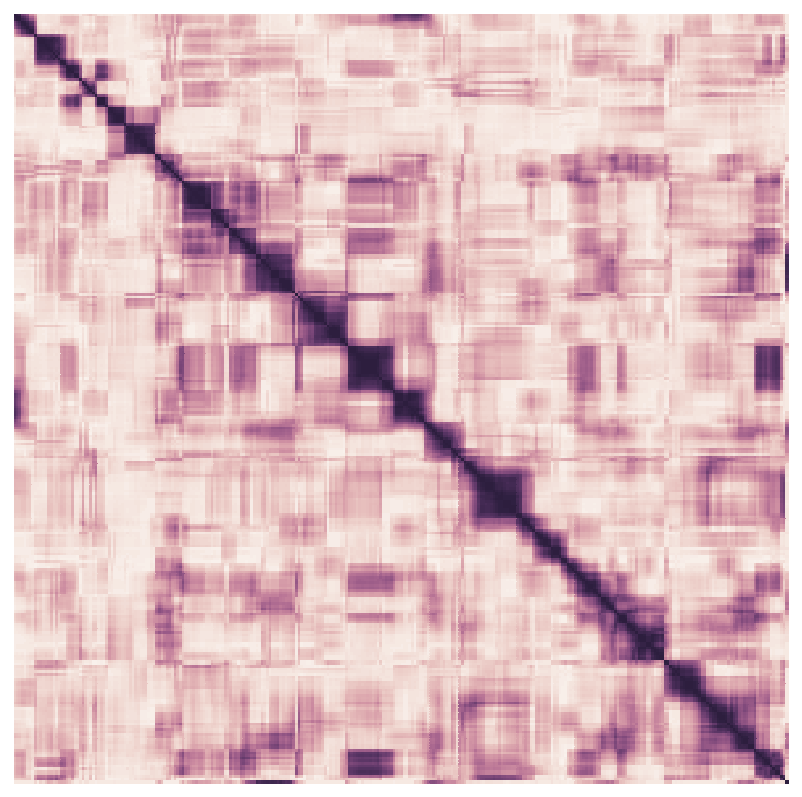

In [961]:
corrmat = np.corrcoef(recall_models[12])
plt.figure(figsize=(10,10))
sns.heatmap(corrmat, xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
# ax = plt.gca()
# bounds_aug = np.concatenate(([0],bounds,[nTR]))
# for j in range(len(bounds_aug)-1):
#     rect = patches.Rectangle((bounds_aug[j],bounds_aug[j]),bounds_aug[j+1]-bounds_aug[j],bounds_aug[j+1]-bounds_aug[j],linewidth=3,edgecolor='w',facecolor='none')
#     ax.add_patch(rect)
# plt.savefig('../figures/sub%s_eventseg_mat_noboxes.png' % str(i))
print(maxks_penalty)

In [12]:
np.std(maxks_penalty)

5.605237293916045

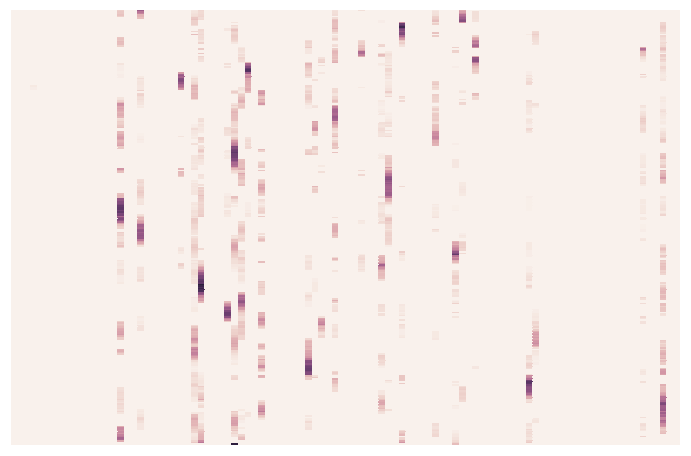

In [13]:
sns.heatmap(recall_models[12], xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
plt.savefig('../figures/subj12_recall_model.png')

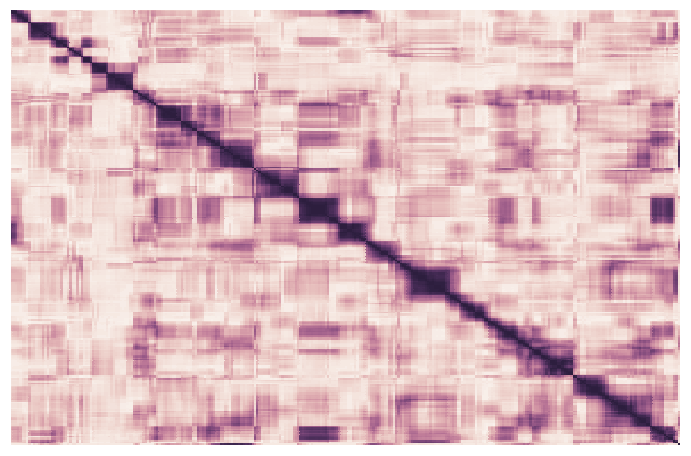

In [14]:
sns.heatmap(np.corrcoef(recall_models[12]), xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
plt.savefig('../figures/subj12_recall_corrmat.png')

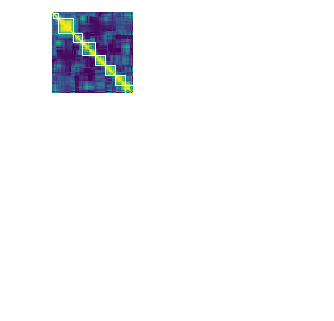

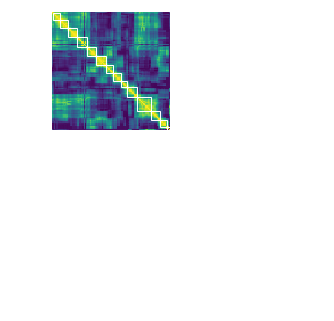

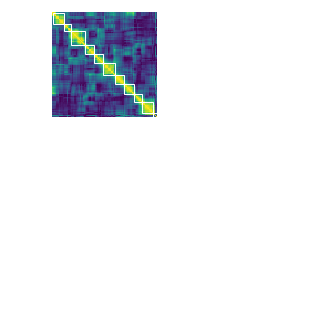

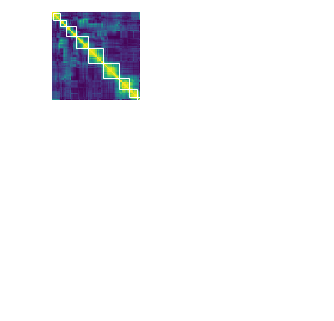

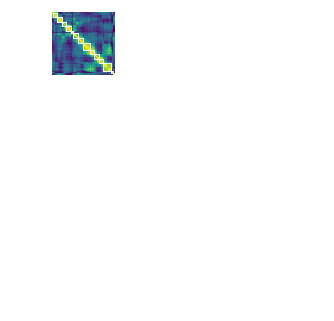

...

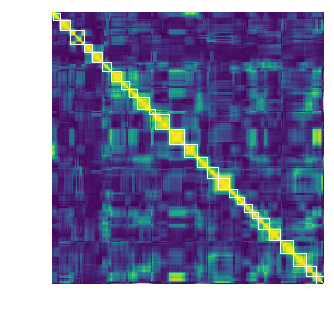

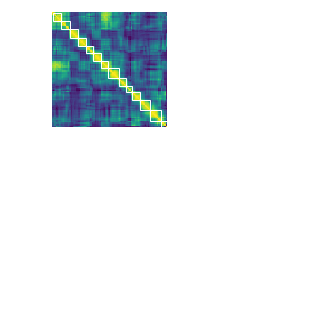

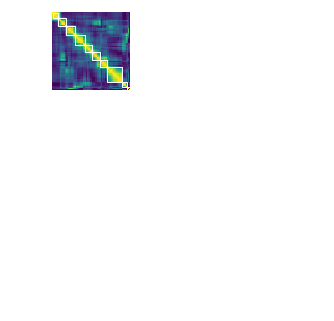

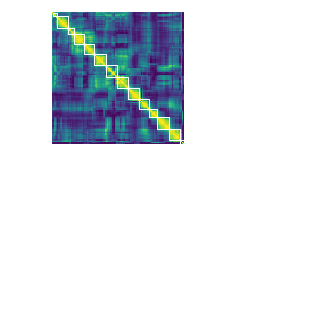

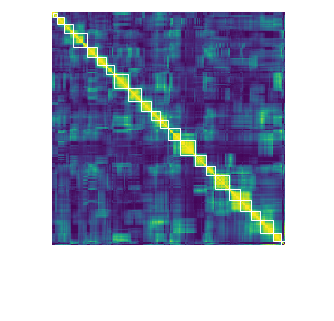

In [15]:
maxlen = max([r.shape[0] for r in recall_models])

# loop over models
for i, (model, k) in enumerate(zip(recall_models, maxks_penalty)):
    
    corrmat = np.zeros((maxlen, maxlen))*np.nan
    # compute the correlation matrix
    corrmat[:model.shape[0],:model.shape[0]]=np.corrcoef(model)
    
    # fit the model
    ev = event.EventSegment(k)
    ev.fit(model)
    
    nTR=ev.segments_[0].shape[0]
    bounds = np.where(np.diff(np.argmax(ev.segments_[0], axis=1)))[0]
    plt.figure(figsize=(5,5))
    plt.imshow(corrmat)
    ax = plt.gca()
    bounds_aug = np.concatenate(([0],bounds,[nTR]))
    for i in range(len(bounds_aug)-1):
        rect = patches.Rectangle((bounds_aug[i],bounds_aug[i]),bounds_aug[i+1]-bounds_aug[i],bounds_aug[i+1]-bounds_aug[i],linewidth=1,edgecolor='w',facecolor='none')
        ax.add_patch(rect)
    ax.axis('off')
    plt.show()

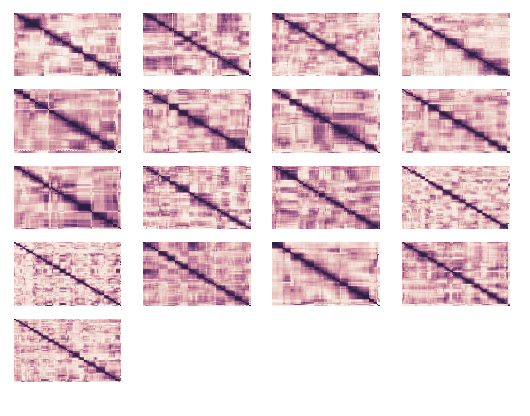

In [975]:
maxlen = max([r.shape[0] for r in recall_models])
fig, axarr = plt.subplots(5,4)
axarr = axarr.flatten()

# loop over models
for i, (model, k, a) in enumerate(zip(recall_models, maxks_penalty, axarr)):
    
#     corrmat = np.zeros((maxlen, maxlen))*np.nan
#     # compute the correlation matrix
#     corrmat[:model.shape[0],:model.shape[0]]=np.corrcoef(model)
    corrmat = np.corrcoef(model)
    
    # fit the model
    ev = event.EventSegment(k)
    ev.fit(model)
    
    sns.heatmap(corrmat, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False, ax=a)
    
#     nTR=ev.segments_[0].shape[0]
#     bounds = np.where(np.diff(np.argmax(ev.segments_[0], axis=1)))[0]
#     plt.figure(figsize=(5,5))
#     plt.imshow(corrmat)
#     ax = plt.gca()
#     bounds_aug = np.concatenate(([0],bounds,[nTR]))
#     for i in range(len(bounds_aug)-1):
#         rect = patches.Rectangle((bounds_aug[i],bounds_aug[i]),bounds_aug[i+1]-bounds_aug[i],bounds_aug[i+1]-bounds_aug[i],linewidth=1,edgecolor='w',facecolor='none')
#         ax.add_patch(rect)
    a.axis('off')
axarr[17].axis('off')
axarr[18].axis('off')
axarr[19].axis('off')
plt.savefig('../figures/all_corrmats.png')
plt.show()

## Number of estimated k values is related to the number of remembered events

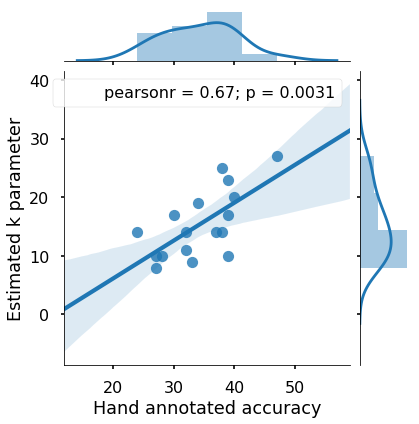

In [16]:
hand_rec = [27, 24, 32, 33, 32, 39, 30, 39, 28, 40, 34, 38, 47, 38, 27, 37, 39]
data = pd.DataFrame(np.array([hand_rec, maxks_penalty]).T, columns=['Hand annotated accuracy', 'Estimated k parameter'])
sns.jointplot(data=data, x='Hand annotated accuracy', y='Estimated k parameter', kind='reg')

## Plot movie-recall correlation matrices

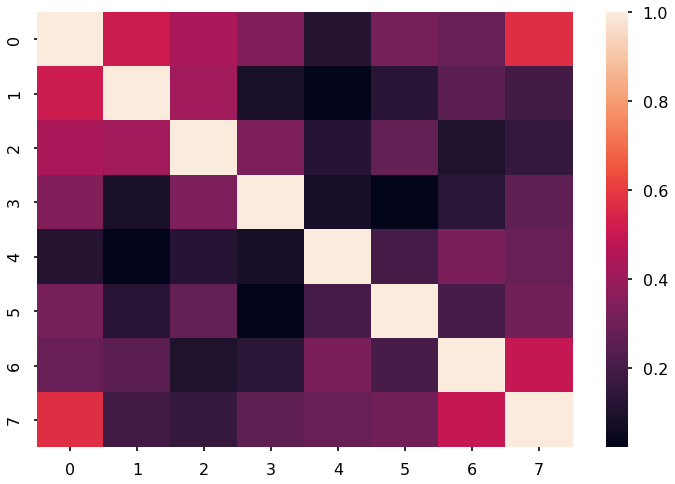

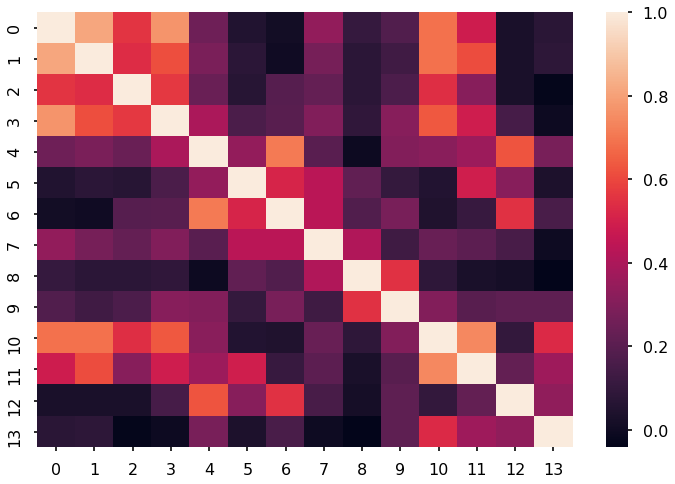

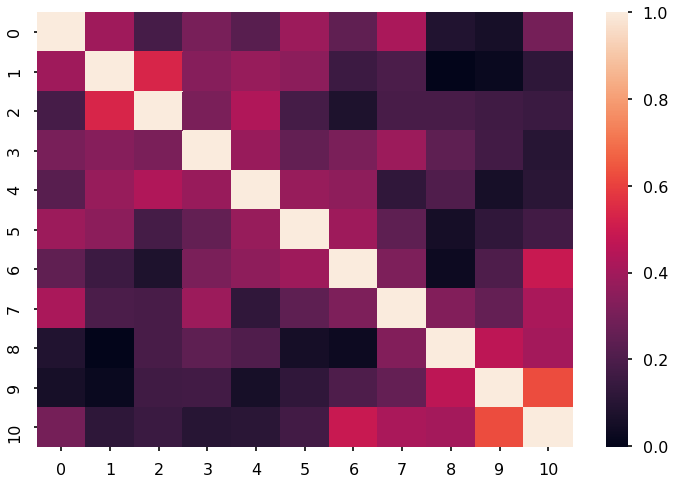

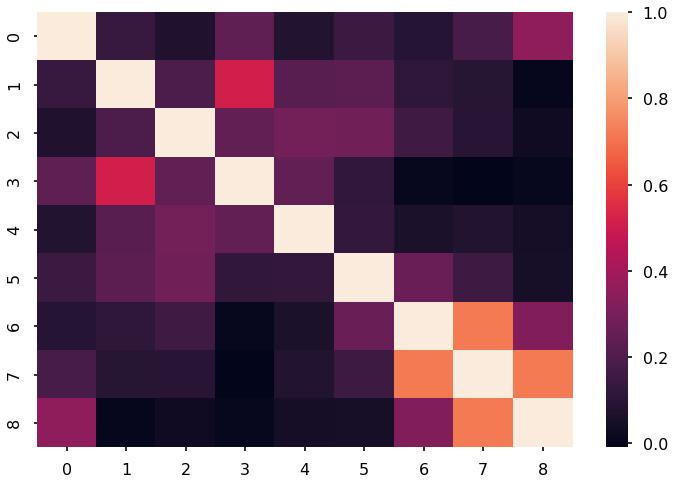

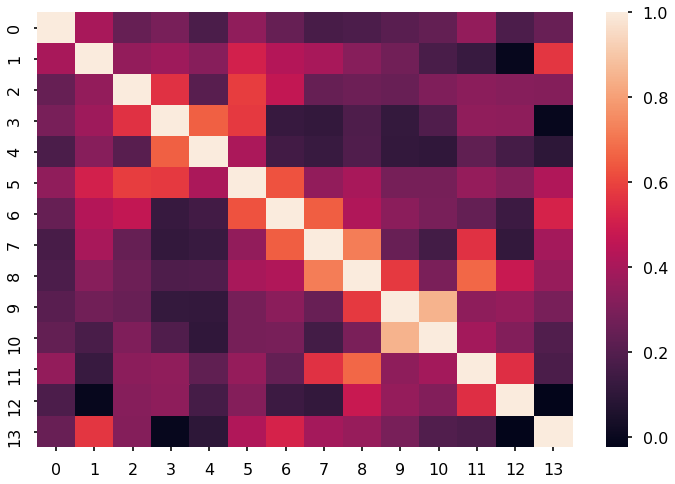

...

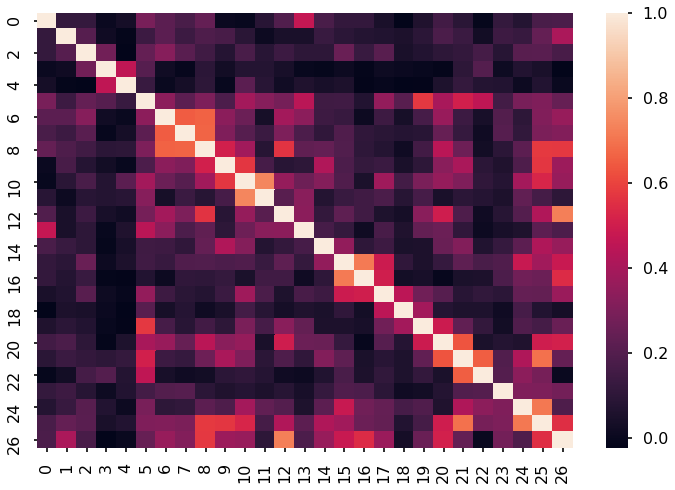

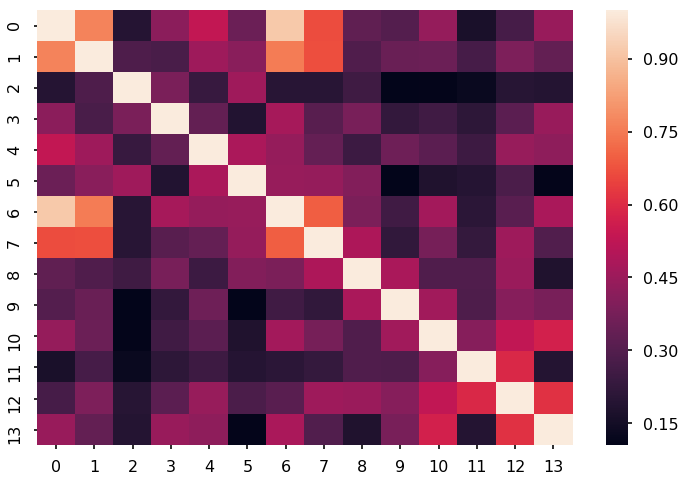

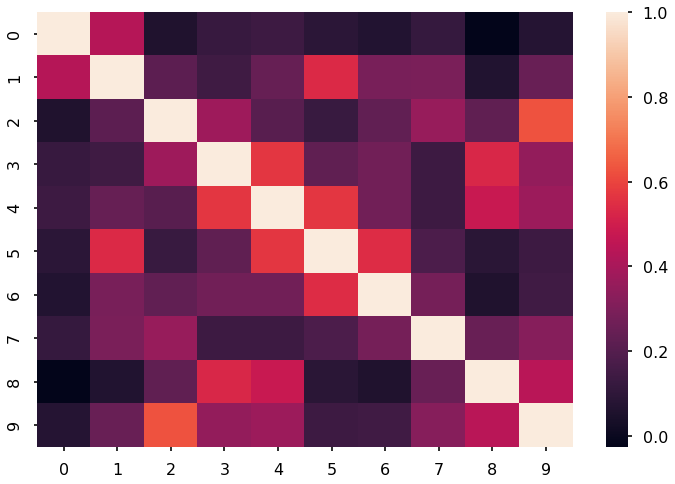

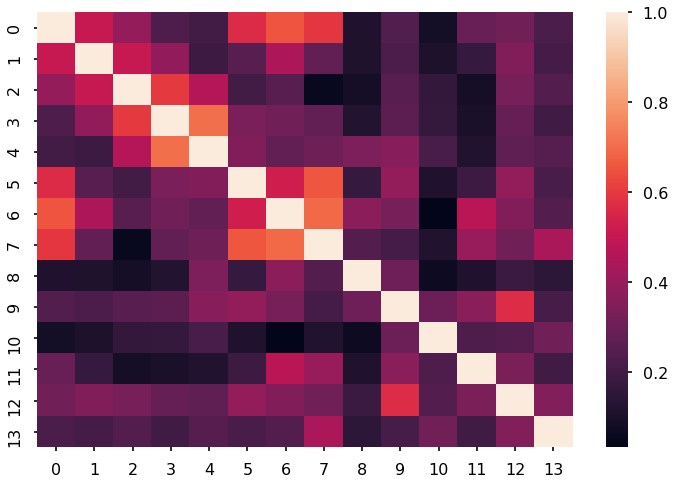

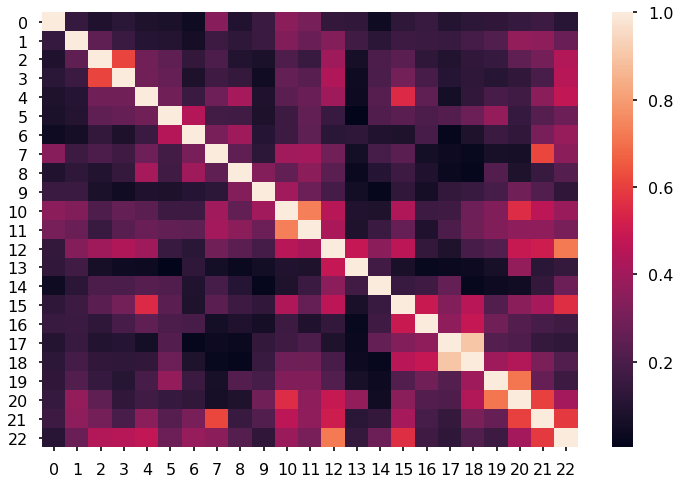

In [17]:
corrmats = []
segments = []
for sub in range(17):
    model = recall_models[sub]
    k = maxks_penalty[sub]
    ev = event.EventSegment(k)
    ev.fit(model)
    seg_inds = [np.round(e).astype(bool) for e in ev.segments_[0].T]
    segment = np.atleast_2d(np.array(list(map(lambda x: np.mean(model[x, :], 0), seg_inds))))
    segments.append(segment)
    corrmat = np.corrcoef(segment)
    corrmats.append(corrmat)
    sns.heatmap(corrmat)
    plt.savefig('../figures/sub%s_eventseg_corrmat.pdf' % str(sub))
    plt.show()

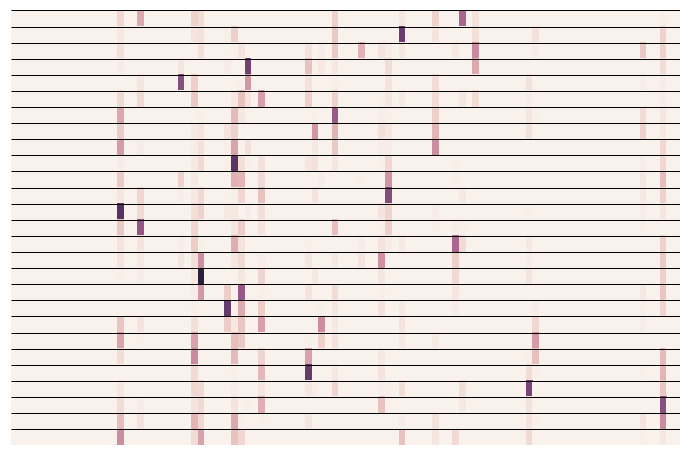

In [18]:
ax = sns.heatmap(segments[12], xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
ax.hlines(list(range(34)), *ax.get_xlim(), linewidth=1)
plt.savefig('../figures/subj12_eventseg_recall_model.png')

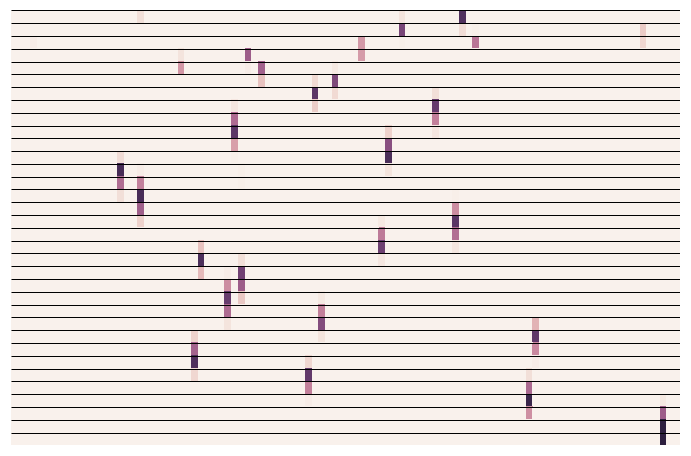

In [19]:
ax = sns.heatmap(model_segments, xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
ax.hlines(list(range(34)), *ax.get_xlim(), linewidth=1)
plt.savefig('../figures/movie_model_eventseg.png')

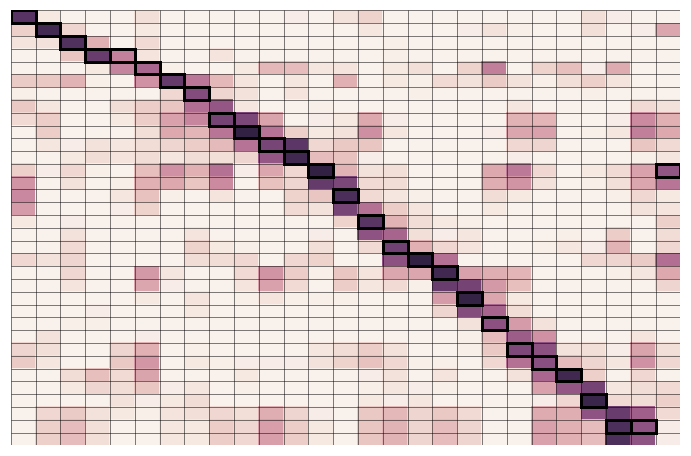

In [20]:
ax = sns.heatmap(1 - cdist(model_segments, segments[12], 'correlation'), vmin=0, vmax=1, xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
ax.hlines(list(range(34)), *ax.get_xlim(), linewidth=.5)
ax.vlines(list(range(34)), *ax.get_ylim(), linewidth=.5)
bounds = np.argmax(1 - cdist(model_segments, segments[12], 'correlation'), axis=0)
ax = plt.gca()
for i in range(len(bounds)):
    rect = patches.Rectangle((i,bounds[i]), 1, 1, linewidth=3,edgecolor='k',facecolor='none')
    ax.add_patch(rect)
plt.savefig('../figures/sub12_movie_recall_eventseg_corrmat.png')

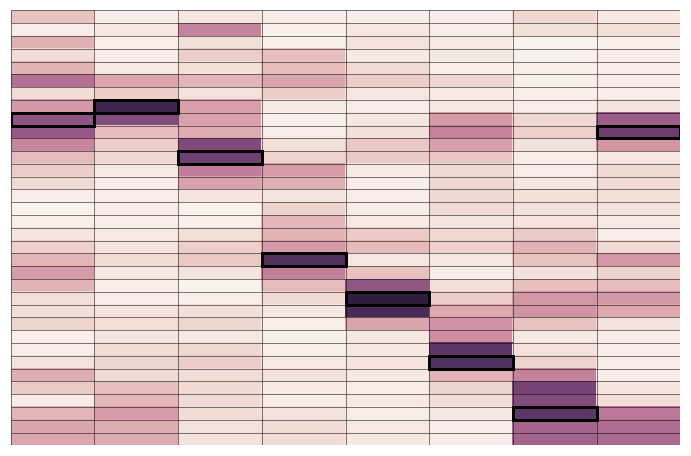

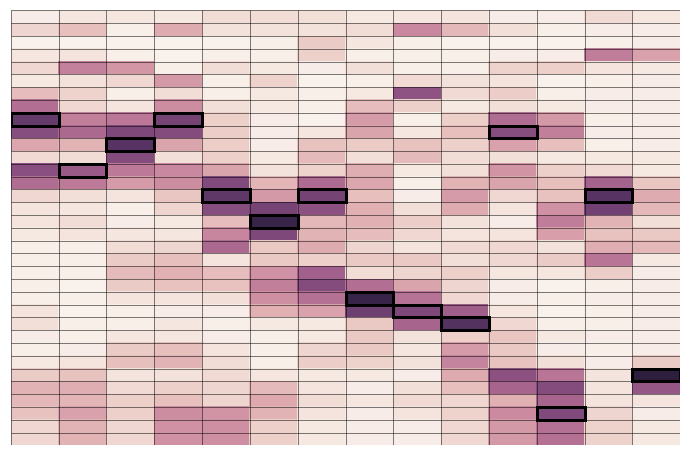

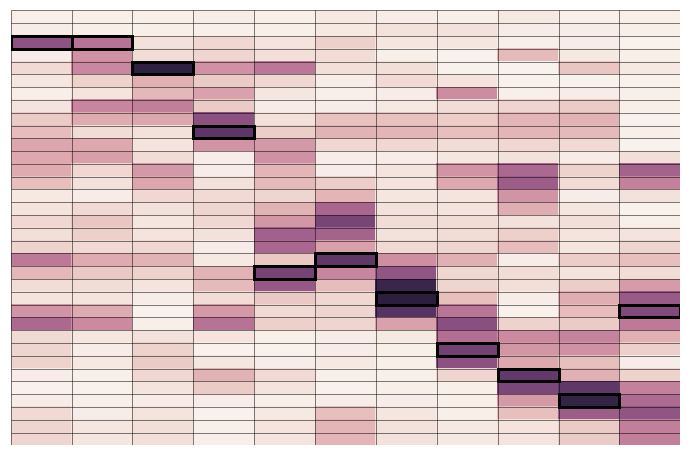

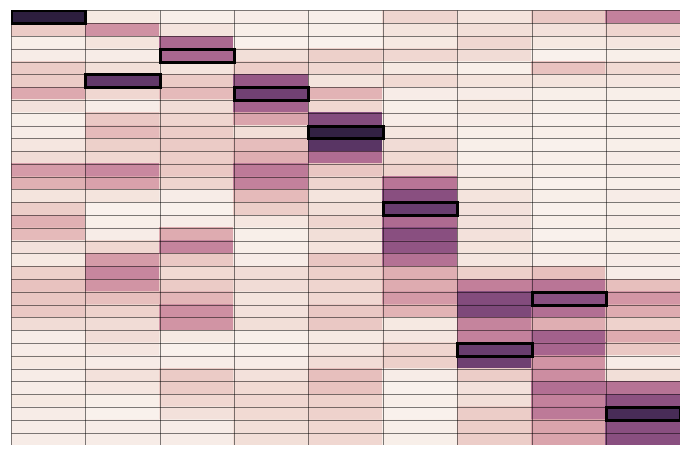

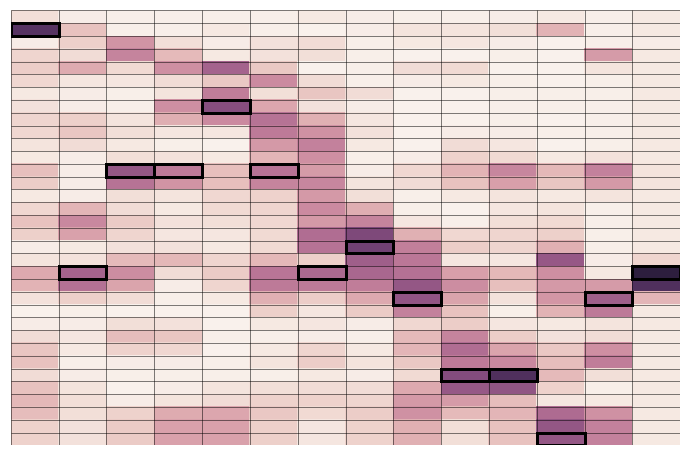

...

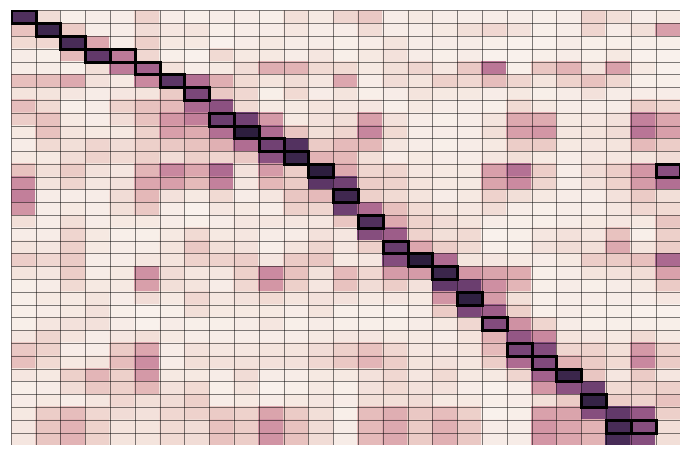

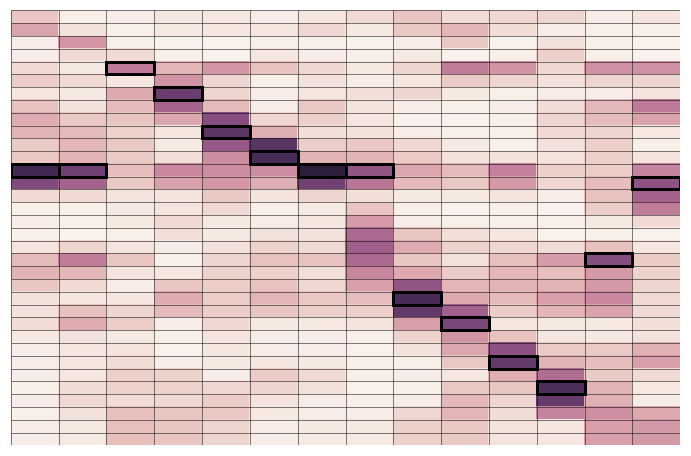

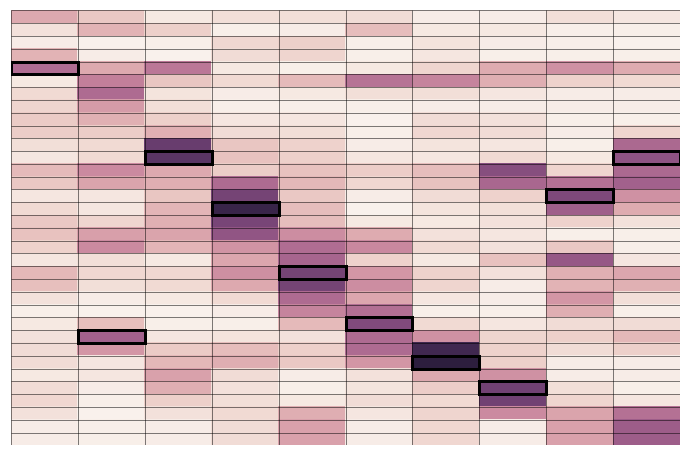

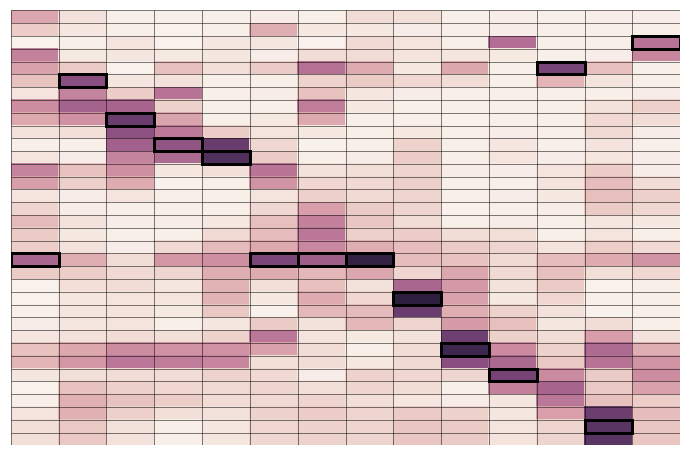

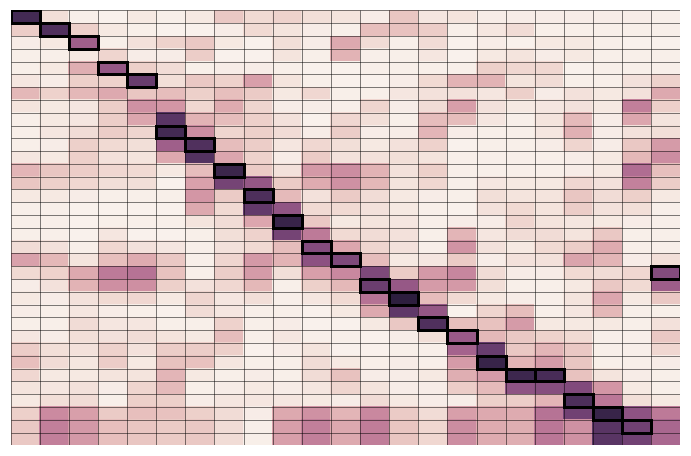

In [21]:
for segment in segments:
    ax = sns.heatmap(1 - cdist(model_segments, segment, 'correlation'), xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
    ax.hlines(list(range(34)), *ax.get_xlim(), linewidth=.5)
    ax.vlines(list(range(34)), *ax.get_ylim(), linewidth=.5)
    bounds = np.argmax(1 - cdist(model_segments, segment, 'correlation'), axis=0)
    ax = plt.gca()
    for i in range(len(bounds)):
        rect = patches.Rectangle((i,bounds[i]), 1, 1, linewidth=3,edgecolor='k',facecolor='none')
        ax.add_patch(rect)
    plt.show()
# plt.savefig('../figures/sub12_movie_recall_eventseg_corrmat.png')

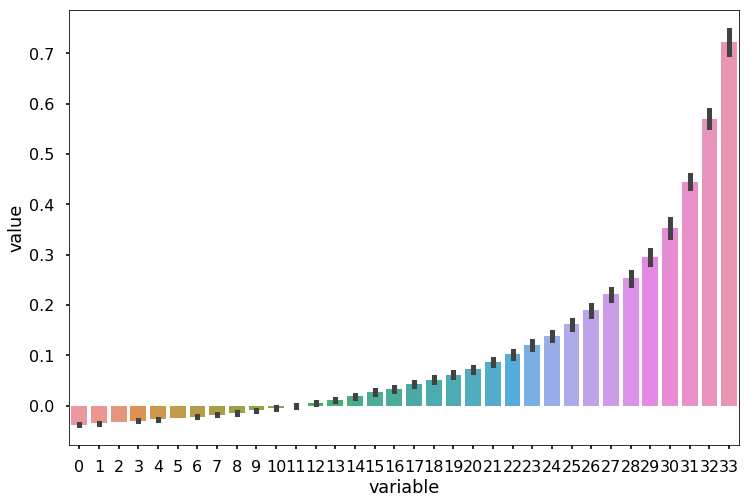

In [22]:
t=[]
for segment in segments:
    t.append(np.mean(np.sort(1 - cdist(model_segments, segment, 'correlation'), 0), 1))
sns.barplot(data=pd.DataFrame(t).melt(), x='variable', y='value')

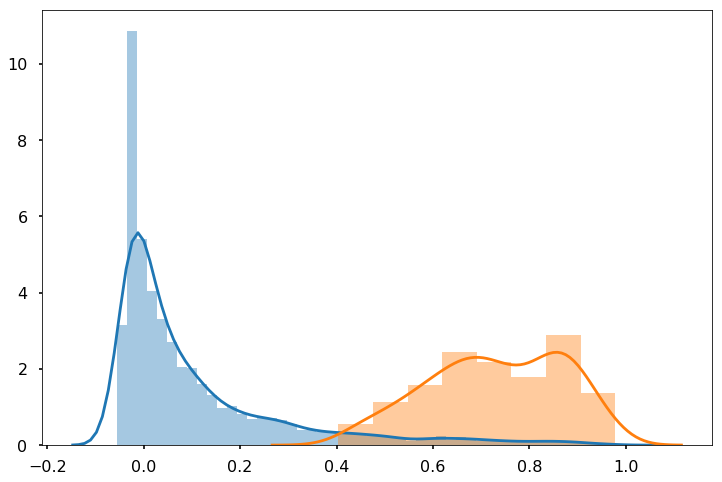

In [23]:
t=[]
argmax=[]
for segment in segments:
    matchmat = 1 - cdist(model_segments, segment, 'correlation')
    inds = [(a, i) for a, i in zip(np.argmax(matchmat, 0), range(23))]
    argmax.extend([matchmat[ind] for ind in inds])
    t.extend(matchmat.ravel())
sns.distplot(t)
sns.distplot(argmax)

## Compute memory accuracy matrix

In [24]:
memacc = np.zeros((17, nevents))
for idx, (corrmat, segment) in enumerate(zip(corrmats, segments)):
    mapping = 1 - cdist(model_segments, segment, correlation) 
    max_mapping = np.argmax(mapping, 0)
    memacc[idx, np.argmax(mapping, 0)]=1

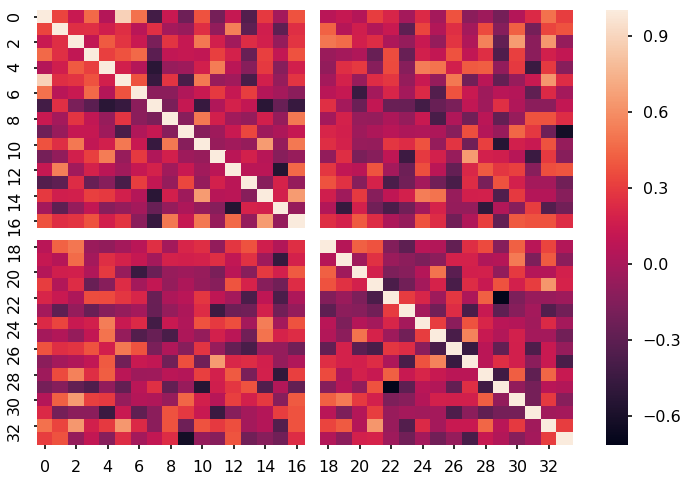

In [25]:
sns.heatmap(np.corrcoef(memacc.T))

In [26]:
x = np.vstack(list(hyp.reduce(np.corrcoef(model_segments), ndims=3)))
x -= np.min(x)
x /= np.max(x)
x = sns.color_palette(x)
x = np.hstack((x, np.ones((34, 1))))

## Compute average recall topic vectors for those who remembered the scene

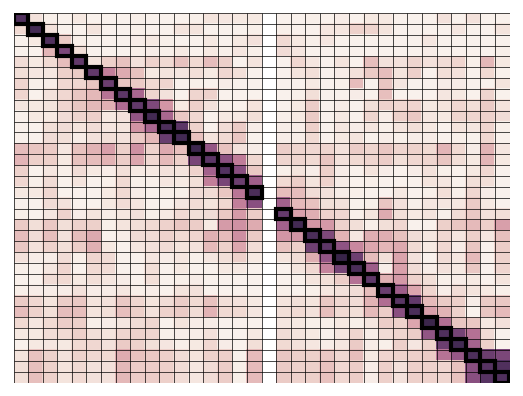

In [27]:
sns.reset_defaults()
avg_events = np.zeros((nevents, 100))
nsubs = []
for event in range(nevents):
    subs = np.where(memacc[:,event]>0)[0]
    tmp = 0
    if len(subs)>0:
        for sub in subs:
            tmp+=np.mean(segments[sub][np.where(np.argmax(1-cdist(model_segments, segments[sub], 'correlation'), 0)==event)[0],:], 0)
        tmp/=len(subs)
        nsubs.append(len(subs))
        avg_events[event,:]=tmp
    else:
        nsubs.append(0)
        
ax = sns.heatmap(1 - cdist(model_segments, avg_events, 'correlation'), vmin=0, vmax=1, xticklabels=False, yticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
ax.hlines(list(range(34)), *ax.get_xlim(), linewidth=.5)
ax.vlines(list(range(34)), *ax.get_ylim(), linewidth=.5)
bounds = np.argmax(1 - cdist(model_segments, avg_events, 'correlation'), axis=0)

ax = plt.gca()
for i in range(len(bounds)):
    if i>0 and bounds[i]==0:
        pass
    else:
        rect = patches.Rectangle((i,bounds[i]), 1, 1, linewidth=3,edgecolor='k',facecolor='none')
        ax.add_patch(rect)
plt.savefig('../figures/allsubs_movie_recall_eventseg_corrmat.png')

## Get statistic for video - average recall relationship

In [69]:
rms = lambda a, b: np.sqrt(((a-b)**2).mean())
real = rms(model_segments, avg_events)

nperms = 100000
perms=[]
for perm in range(nperms):
    shift = np.random.randint(1, avg_events.shape[0]-1, 1)
    shifted = np.roll(avg_events, shift=shift, axis=0)
    perms.append(rms(model_segments, shifted))
sorted_perms = np.sort(perms)
np.sum(sorted_perms<real)

0

## Get statistic for video - subject recall relationship

In [169]:
np.sort(np.argmax(1 - cdist(model_segments, s, 'correlation'), 0))

array([ 0,  1,  2,  4,  5,  9, 10, 12, 14, 16, 18, 19, 20, 21, 22, 24, 25,
       27, 28, 28, 30, 31, 32])

In [175]:
rmsd = lambda a, b: np.sqrt(((a-b)**2).mean())
nperms = 10000
ps = []
zs = []
reals = []
for s in segments:
    sub_model = model_segments[np.sort(np.argmax(1 - cdist(model_segments, s, 'correlation'), 0)), :]
    real = rmsd(sub_model, s)
    perms=[]
    for perm in range(nperms):
        shift = np.random.randint(1, s.shape[0]-1, 1)
        shifted = np.roll(s, shift=shift, axis=0)
        perms.append(rmsd(sub_model, shifted))
    ps.append(np.sum(real>np.sort(perms)))
    zs.append((real - np.mean(perms))/np.std(perms))
    reals.append(real)
np.array(ps)/10000

array([0.1725, 0.2455, 0.    , 0.    , 0.1719, 0.1265, 0.2718, 0.    ,
       0.    , 0.    , 0.    , 0.    , 0.0389, 0.2483, 0.2473, 0.1702,
       0.    ])

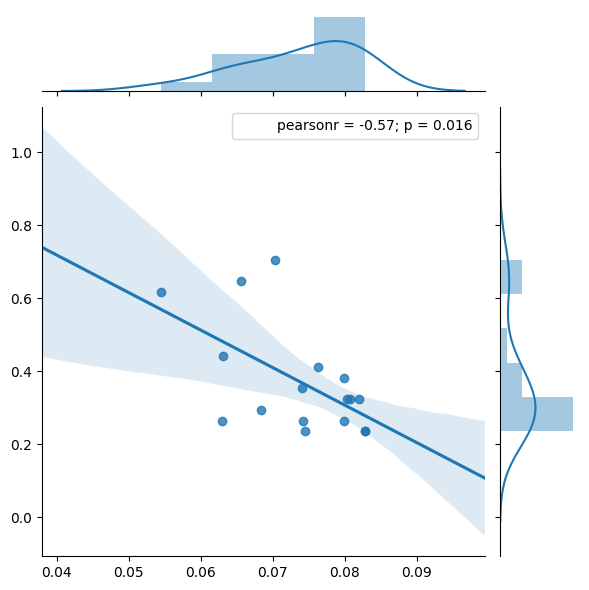

In [182]:
sns.jointplot(np.array(reals), np.array(memorability_subj), kind='reg')

###### Plot the individual recall matrices as trajectories colored by scene

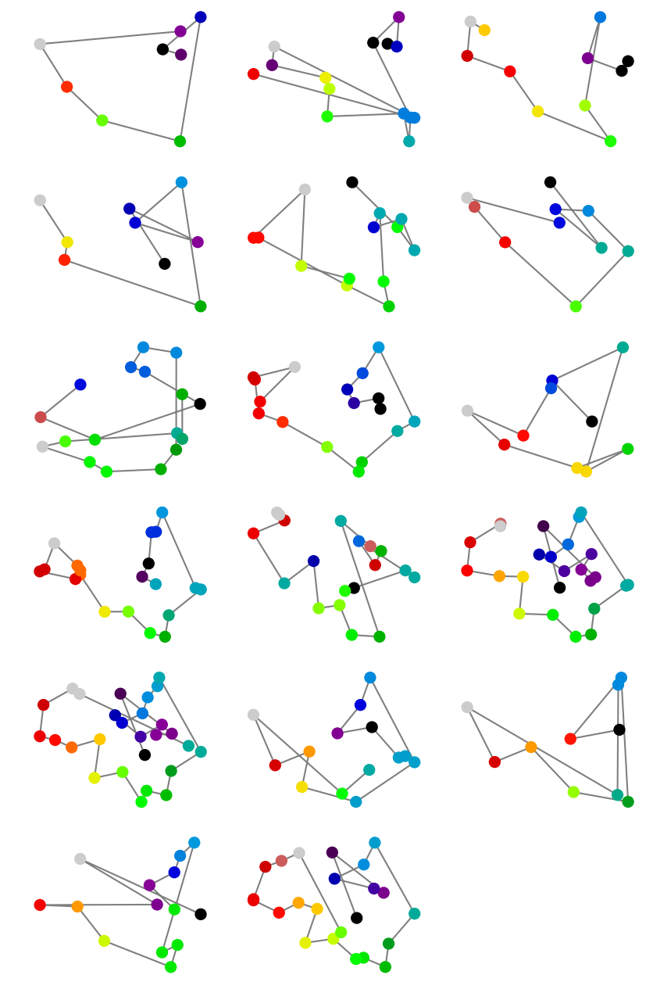

In [148]:
from sklearn import cluster, covariance, manifold
from matplotlib.collections import LineCollection
import hypertools as hyp
sns.reset_defaults()
plt.rc('figure', figsize=(10, 16))
f, axarr = plt.subplots(6, 3)
axarr = axarr.flatten()
plt.axis('off')

mappings = []
max_mappings = []
embeddings = hyp.reduce(segments+[avg_events]+[model_segments], ndims=2, reduce='UMAP')

for idx, (corrmat, embedding, segment) in enumerate(zip(corrmats, embeddings, segments)):
    
    embedding = embedding.T
    mapping = 1-cdist(model_segments, segment, 'correlation') 
    mappings.append(mapping)
    max_mapping = np.argmax(mapping, 0)
    max_mappings.append(list(max_mapping)) 
    
    # Plot the nodes using the coordinates of our embedding
    axarr[idx].scatter(embedding[0], embedding[1], s=100, cmap=plt.cm.spectral, c=list(max_mapping), zorder=2)
    axarr[idx].plot(embedding[0], embedding[1], 'k', zorder=1, alpha=.5)
    axarr[idx].axis('off')
plt.savefig('../figures/sub_embeddings.pdf')
plt.show()
np.save('../data/behavior_event_data', [model_segments, segments])

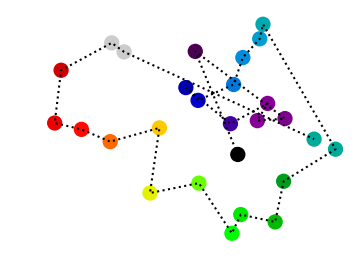

In [149]:
plt.rc('figure', figsize=(4,3))
sub=12
embedding = embeddings[12].T
mapping = 1-cdist(model_segments, segments[12], 'correlation') 
max_mapping = np.argmax(mapping, 0)

# Plot the nodes using the coordinates of our embedding
plt.scatter(embedding[0], embedding[1], s=100, cmap=plt.cm.spectral, c=list(max_mapping))
plt.plot(embedding[0], embedding[1], 'k:')
plt.axis('off')
plt.savefig('../figures/sub12_embedding.pdf')

## Plot the movie events and average recall events

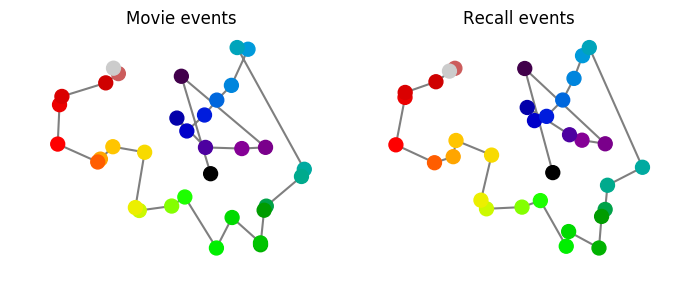

In [150]:
plt.rc('figure', figsize=(8,3))
f, axarr = plt.subplots(1, 2)
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].plot(embeddings[-1][:,0], embeddings[-1][:,1], 'k', zorder=1, alpha=.5)
axarr[0].scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=100, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=2)
axarr[0].set_title('Movie events')
axarr[1].plot(embeddings[-2][avg_events.sum(1)>0,0], embeddings[-2][avg_events.sum(1)>0,1], 'k', zorder=1, alpha=.5)
axarr[1].scatter(embeddings[-2][avg_events.sum(1)>0,0], embeddings[-2][avg_events.sum(1)>0,1], s=100, cmap=plt.cm.spectral, c=np.array(list(range(nevents)))[avg_events.sum(1)>0], zorder=2)
axarr[1].set_title('Recall events')
plt.savefig('../figures/group_embedding.pdf')
plt.show()

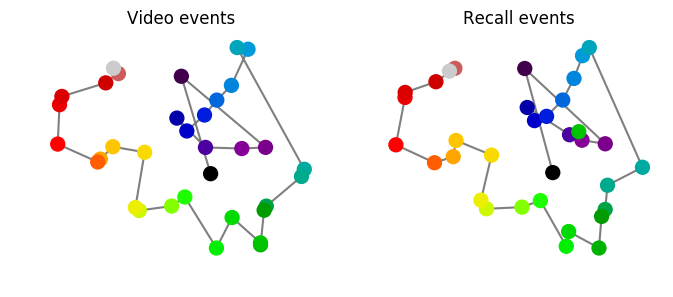

In [151]:
plt.rc('figure', figsize=(8,3))
f, axarr = plt.subplots(1, 2)
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].plot(embeddings[-1][:,0], embeddings[-1][:,1], 'k', zorder=1, alpha=.5)
axarr[0].scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=100, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=2)
axarr[0].set_title('Video events')
sns.reset_defaults()
d = dict()
for esub, msub in zip(embeddings[:-2], max_mappings):
    for e, m in zip(esub, msub):
        if m not in d:
            d[m]=[]
        d[m].append(list(e))
# for i, key in enumerate(d):
#     sns.kdeplot(d[key], n_levels=1, alpha=.5, shade=True, shade_lowest=False, cmap='Greys_r', ax=axarr[1])
axarr[1].plot(embeddings[-2][avg_events.sum(1)>0,0], embeddings[-2][avg_events.sum(1)>0,1], 'k', zorder=1, alpha=.5)
axarr[1].scatter(embeddings[-2][:,0], embeddings[-2][:,1], cmap=plt.cm.spectral, c=list(range(nevents)), s=100, zorder=2)
axarr[1].set_title('Recall events')
plt.savefig('/Users/andyheusser/Desktop/avg_mem_traj.pdf')

In [32]:
# sns.jointplot(np.diag(cdist(avg_events, avg_events, 'correlation'), k=1), importance[1:], kind='reg')

NameError: name 'importance' is not defined

# Scene-level metrics

## Memorability
i.e. the proportion of people that remembered a given event

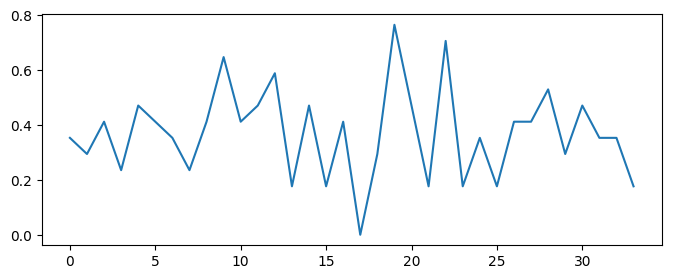

In [153]:
memory = memacc.mean(0)
plt.plot(memory)

## Precision
i.e. the correlation between the average recall event and the movie event

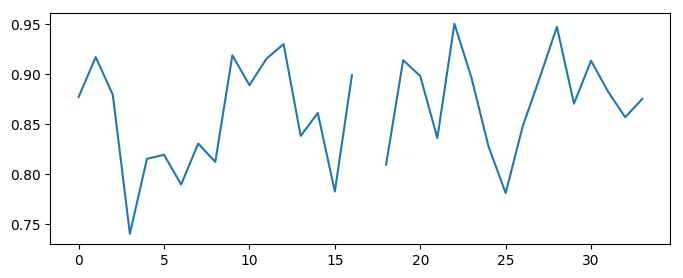

In [154]:
precision = np.diag(1-cdist(model_segments, avg_events, 'correlation'))
plt.plot(precision)

## Distinctiveness
i.e. how distinctive the recall of the event is from other events

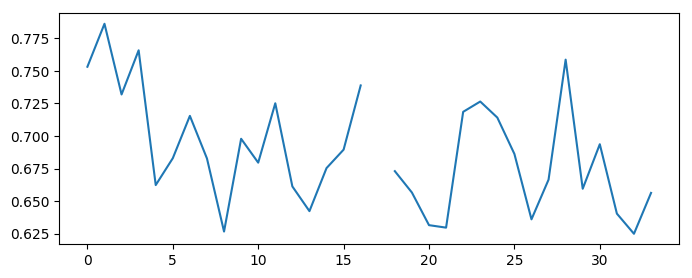

In [155]:
avg_corrmat = 1-np.nan_to_num(np.corrcoef(avg_events))
distinctiveness = avg_corrmat.mean(0)
distinctiveness[distinctiveness==1]=np.nan
plt.plot(distinctiveness)

## Calculate importance
i.e. memory performance for the rest of the movie conditional on memory for a particular event

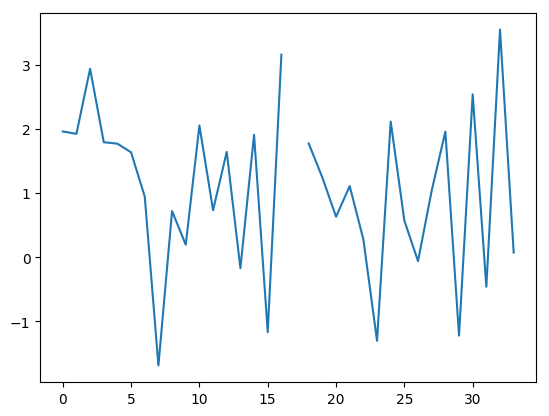

In [761]:
importance = []
for i in range(nevents):
    selector = [x for x in range(nevents) if x != i]
    r = memacc[memacc[:,i]==1][:,selector].mean(1)
    f = memacc[memacc[:,i]==0][:,selector].mean(1)
    t = ttest(r, f)[0]
#     t = r.mean()-f.mean()
    if np.isnan(t):
        t = np.nan
    importance.append(t)
importance = np.array(importance)

plt.plot(importance)

## Combine everything into a dataframe

In [259]:
df = pd.DataFrame(np.array([memory, precision, distinctiveness, importance]).T, columns=['memorability', 'precision', 'distinctiveness', 'importance'])
df = df[df['precision'].notna()]
df.head()

,memorability,precision,distinctiveness,importance
0,0.352941,0.877195,0.753191,0.134527
1,0.294118,0.917256,0.786179,0.139394
2,0.411765,0.879384,0.731919,0.171861
3,0.235294,0.739987,0.765817,0.142191
4,0.470588,0.815205,0.662350,0.118687


## Plot a pair grid of all of these variables

/usr/local/Cellar/python3/3.6.1/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


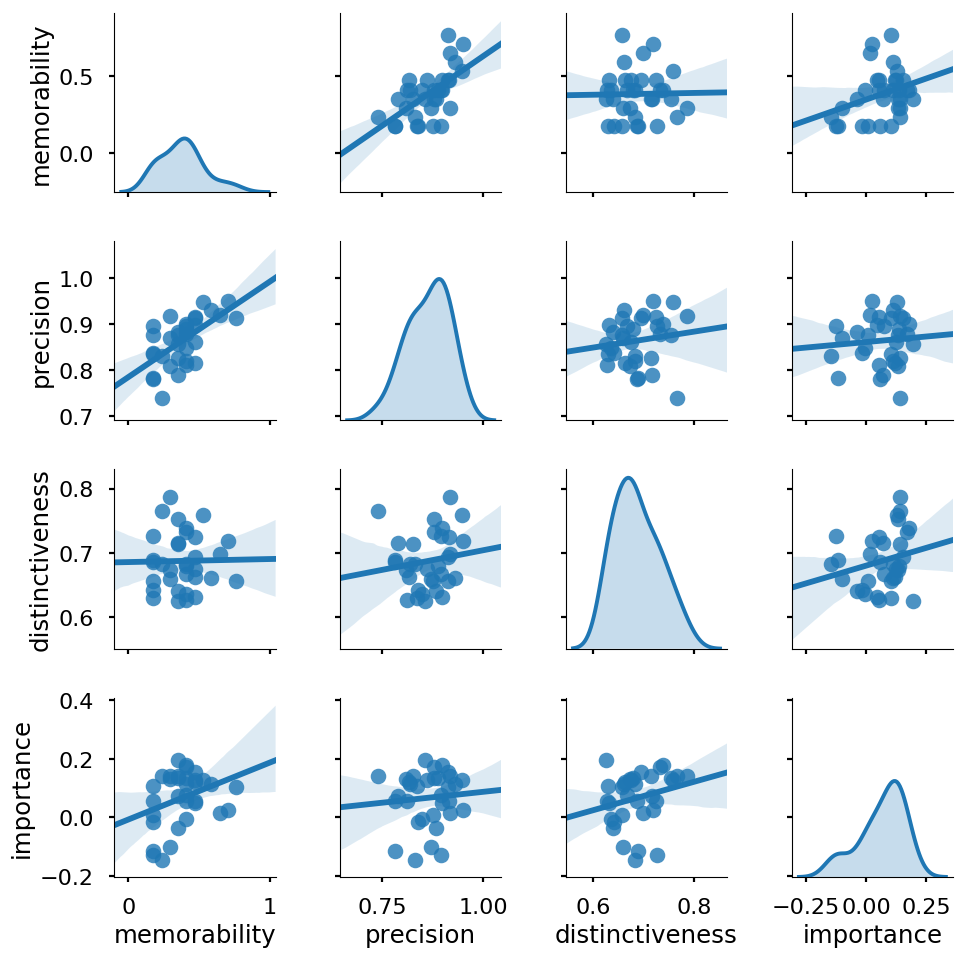

In [260]:
g = sns.PairGrid(df)
g = g.map_diag(sns.kdeplot, shade=True)
g = g.map_offdiag(sns.regplot)

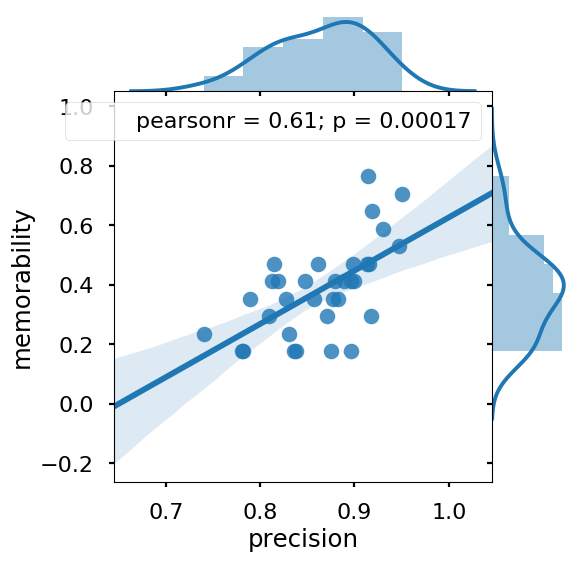

In [159]:
sns.set_context('poster')
sns.jointplot(data=df, y='memorability', x='precision', kind='reg', space=False)
plt.rcParams['pdf.fonttype'] = 42
plt.savefig('../figures/mem_prec_acrossevs.pdf')

## Computing these measures across subjects

/usr/local/Cellar/python3/3.6.1/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


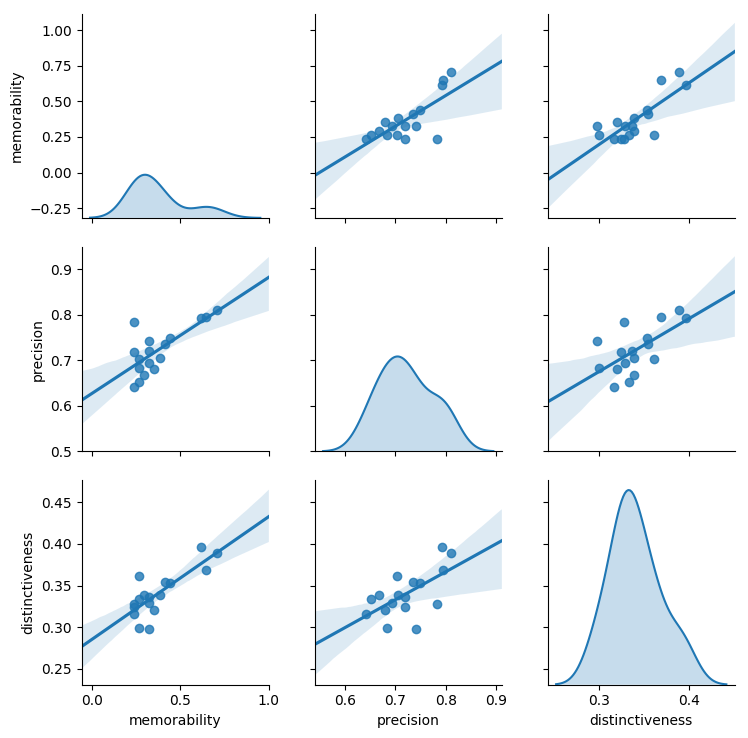

In [161]:
sns.reset_defaults()
memorability_subj = np.nanmean(memacc, 1)
precision_subj = np.array(list(map(lambda m: np.max(m,0).mean(), mappings)))
distinctiveness_subj = np.array([np.triu(1-np.corrcoef(s), k=1).mean() for s in segments])
df2 = pd.DataFrame(np.array([memorability_subj, precision_subj, distinctiveness_subj]).T, columns=['memorability', 'precision', 'distinctiveness'])
g = sns.PairGrid(df2)
g = g.map_diag(sns.kdeplot, shade=True)
g = g.map_offdiag(sns.regplot)

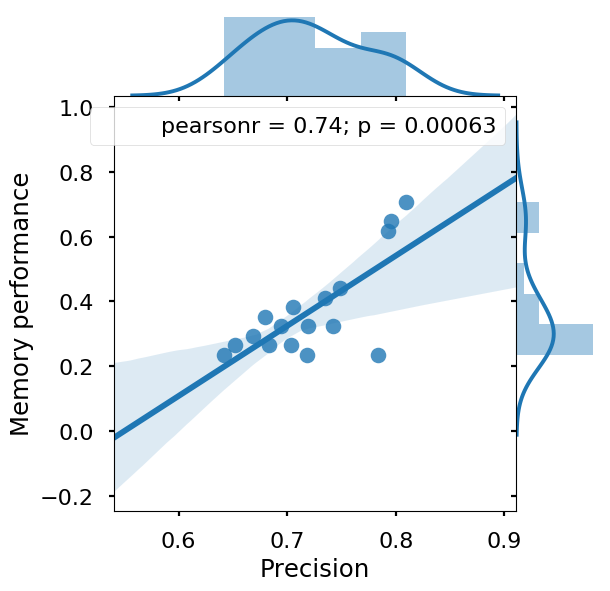

In [214]:
sns.set_context('poster')
sns.jointplot(df2['precision'].values, memorability_subj, kind='reg', space=False)
plt.ylabel('Memory performance')
plt.xlabel('Precision')
plt.rcParams['pdf.fonttype'] = 42
plt.savefig('../figures/mem_prec_acrosssubs.pdf')

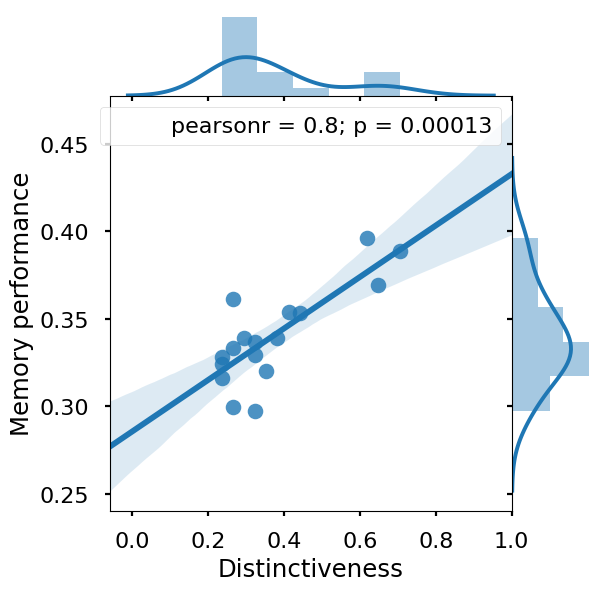

In [212]:
sns.jointplot(memorability_subj, distinctiveness_subj, kind='reg', space=False)
plt.ylabel('Memory performance')
plt.xlabel('Distinctiveness')
plt.rcParams['pdf.fonttype'] = 42
plt.savefig('../figures/mem_dist_acrosssubs.pdf')

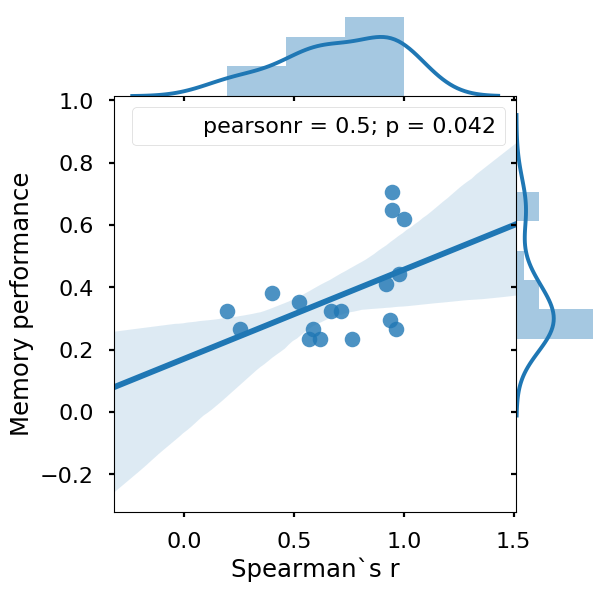

In [213]:
from scipy.stats import spearmanr

sorted_max_mappings = list(map(lambda x: np.sort(x), max_mappings))
spearmans = [spearmanr(i, j).correlation for i, j in zip(sorted_max_mappings, max_mappings)]
sns.jointplot(np.array(spearmans), memorability_subj, kind='reg', space=False)
plt.ylabel('Memory performance')
plt.xlabel('Spearman`s r')
plt.rcParams['pdf.fonttype'] = 42
plt.savefig('../figures/mem_spearman_acrosssubs.pdf')

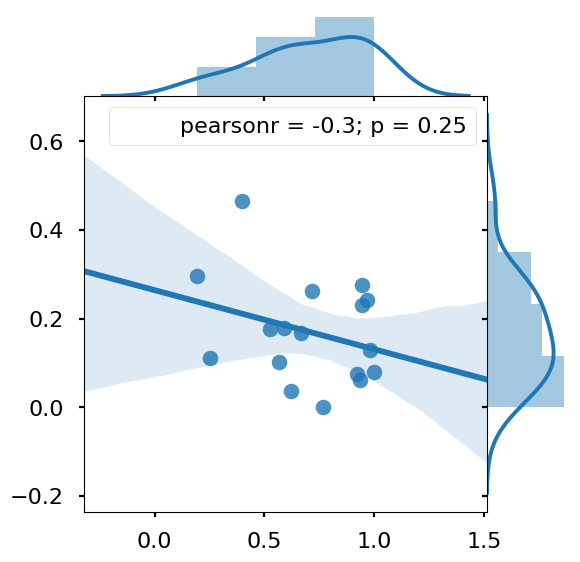

In [216]:
out_of_order = np.array([1, 4, 2, 8, 0, 4, 14, 5, 5, 3, 6, 3, 13, 10, 3, 11, 9])
sns.jointplot(np.array(spearmans), out_of_order/hand_rec, kind='reg', space=False)

In [222]:
ooo

array([2, 5, 2, 2, 5, 2, 4, 1, 3, 3, 5, 0, 1, 3, 3, 3, 1])

In [223]:
# def count_ooo(x):
#     ooo=0
#     for i in range(len(x)-1):
#         if x[i]>x[i+1]:
#             ooo+=1
#     return ooo
# ooo = np.array(list(map(count_ooo, max_mappings)))
# sns.jointplot(ooo, out_of_order)

max_mappings[1]

[8, 12, 10, 8, 14, 16, 14, 22, 23, 24, 9, 31, 14, 28]

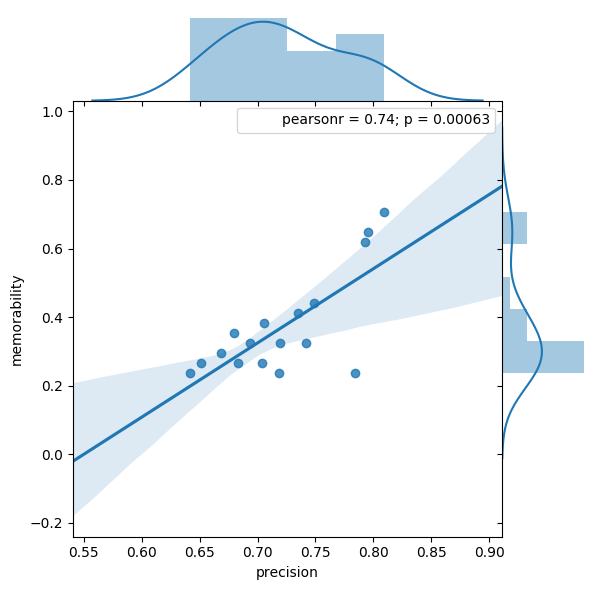

In [164]:
sns.jointplot(data=df2, y='memorability', x='precision', kind='reg', space=False)
plt.rcParams['pdf.fonttype'] = 42
plt.savefig('../figures/mem_prec_acrosssubs.pdf')

# Subject-level behavioral analyses

In [282]:
pres = [[[{'item' : i, 'topics' : m} for i, m in enumerate(model_segments)]] for sub in range(17)]
rec = []
for r in segments:
    items = list(np.argmax(1-cdist(model_segments, r, 'correlation'), 0).astype(int))
    rec.append([[{'item' : item, 'topics' : t} for item, t in zip(items, r)]])
egg = quail.Egg(pres=pres, rec=rec)
egg.info()

Number of subjects: 17
Number of lists per subject: 1
Number of words per list: 34
Date created: Tue May 22 15:38:02 2018
Meta data: {}


## Accuracy

/Users/andyheusser/Documents/github/quail/quail/analysis/recmat.py:54: RuntimeWarning: Mean of empty slice
  distance) for feature in features], 0)


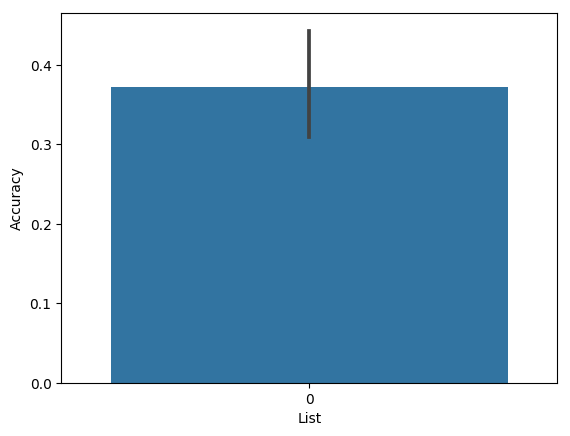

In [283]:
acc = egg.analyze('accuracy', match='best', features=['topics'], distance='correlation')
acc.plot()

## Serial position curve

In [ ]:
sns.reset_defaults()
# plt.plot(np.corrcoef(model_segments).mean(0), label = 'movie', c='red')
# spc = egg.analyze('spc', match='smooth', features=['topics'], distance='correlation')
# spc.plot()

spc = egg.analyze('spc', match='best', features=['topics'], distance='correlation')
spc.plot()


# from sklearn import linear_model
# regr = linear_model.LinearRegression()
# regr.fit(np.corrcoef(model_segments).mean(0).reshape(-1, 1), spc.data.mean(0).reshape(-1,1))
# spc.data = spc.data.T.apply(lambda x: x.values-regr.predict(spc.data.mean(0).reshape(-1, 1)).ravel()).T
# spc.plot()

# from sklearn import linear_model
# regr = linear_model.LinearRegression()
# regr.fit(np.corrcoef(model_segments).mean(0).reshape(-1, 1), spc.data.mean(0).reshape(-1,1))
# spc.data = spc.data.T.apply(lambda x: x.values-regr.predict(spc.data.mean(0).reshape(-1, 1)).ravel()).T
# spc.plot()


# cholesky whitening
# mahalanobis whitening
# kessey whitening zero phase component analysis

## Probability of first recall

In [ ]:
pfr = egg.analyze('pfr', match='best', features=['topics'], distance='correlation')
pfr.plot()

## Lag-crp

In [ ]:
lagcrp = egg.analyze('lagcrp', match='best', features=['topics'], distance='correlation')
lagcrp.plot(xlim=[-34, 34])

## Semantic/temporal clustering

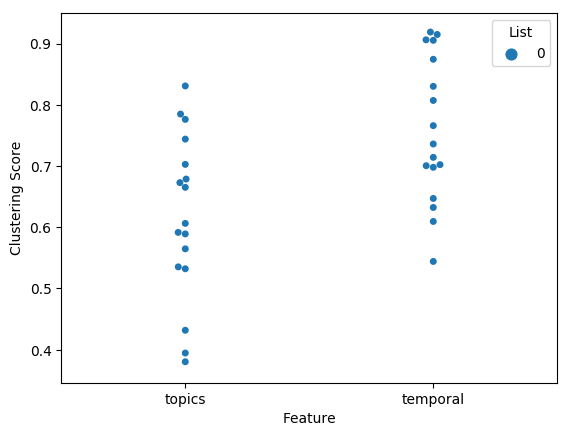

In [285]:
clustering = egg.analyze('fingerprint')
clustering.plot(plot_style='swarm')

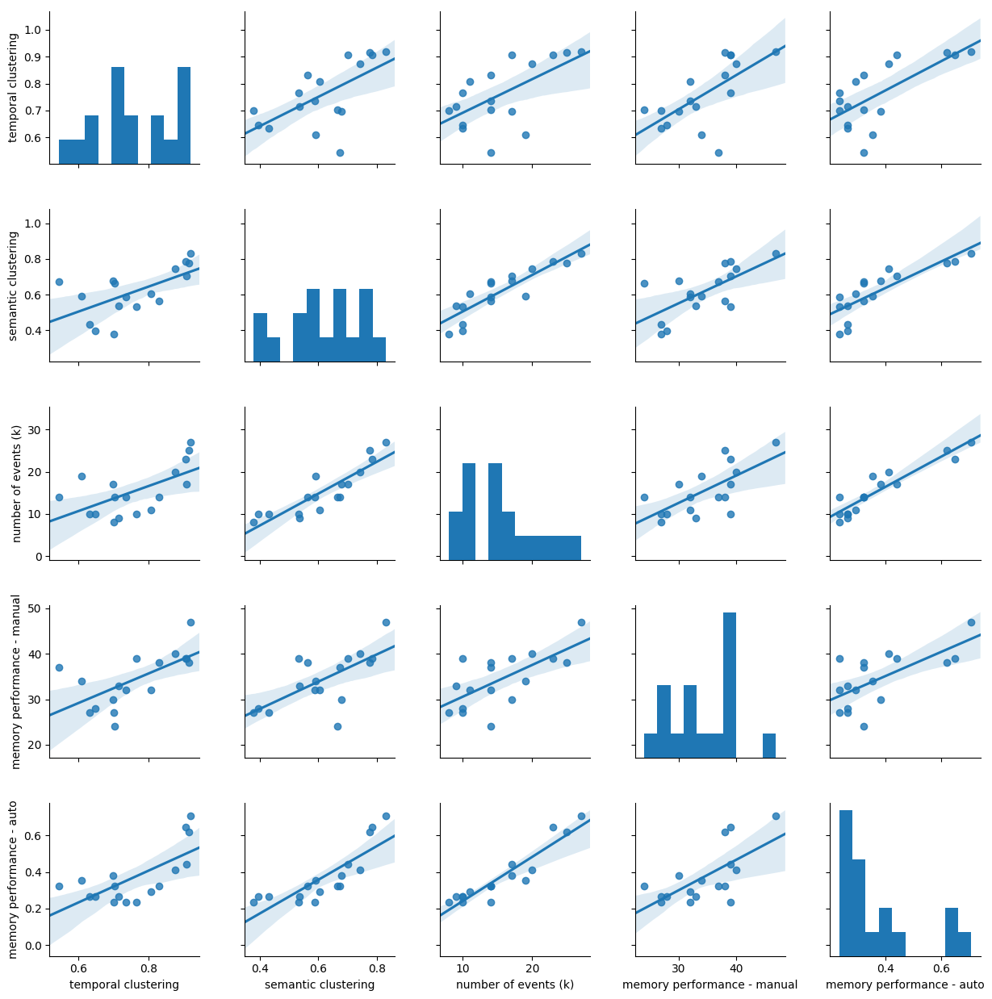

In [286]:
sns.reset_defaults()

ks = np.array([8, 14, 11, 9, 14, 10, 17, 17, 10, 20, 19, 25, 27, 14, 10, 14, 23])
hand_rec = np.array([27, 24, 32, 33, 32, 39, 30, 39, 28, 40, 34, 38, 47, 38, 27, 37, 39])
auto_rec = list(map(lambda x: x[0], acc.data.values))
# auto_rec = spc.data.mean(1)

df = pd.DataFrame(np.array([clustering.data.temporal.values, clustering.data.topics.values, ks, hand_rec, auto_rec]).T, columns=['temporal clustering', 'semantic clustering', 'number of events (k)', 'memory performance - manual', 'memory performance - auto'])
g = sns.PairGrid(df)
g = g.map_diag(plt.hist)
g = g.map_offdiag(sns.regplot)
plt.show()

# df = pd.DataFrame(np.array([clustering.data.temporal.values, clustering.data.topics.values, ks, hand_rec, auto_rec, precision_subj, distinctiveness_subj]).T, columns=['temporal clustering', 'semantic clustering', 'number of events (k)', 'memory performance - manual', 'memory performance - auto', 'precision_subj',  'distinctiveness'])
# g = sns.PairGrid(df)
# g = g.map_diag(plt.hist)
# g = g.map_offdiag(sns.regplot)
# plt.show()

## Event length analysis: Are the length of the movie/recall events related to memory?

In [277]:
from brainiak.eventseg import event
ev_lens = []
for k, r in zip(maxks_penalty, recall_models):
    ev = event.EventSegment(k)
    ev.fit(model)
    ev_lens.append(np.sum(np.array([np.round(e).astype(int) for e in ev.segments_[0].T]), 1))

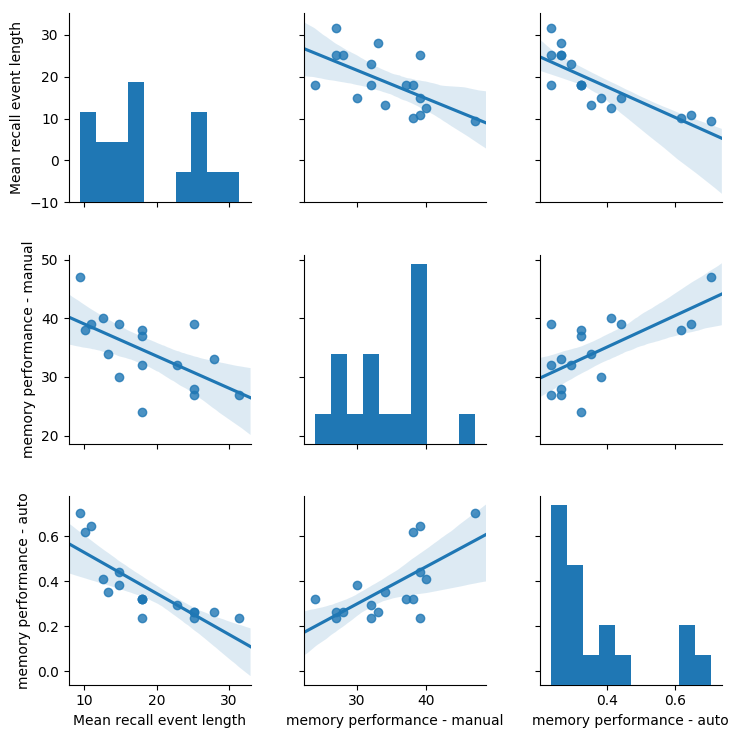

In [287]:
means = np.array([e.mean() for e in ev_lens])
df = pd.DataFrame(np.array([means, hand_rec, auto_rec]).T, columns=['Mean recall event length', 'memory performance - manual', 'memory performance - auto'])
g = sns.PairGrid(df)
g = g.map_diag(plt.hist)
g = g.map_offdiag(sns.regplot)
plt.show()

## Plot the distribution of recall event lengths for each subject

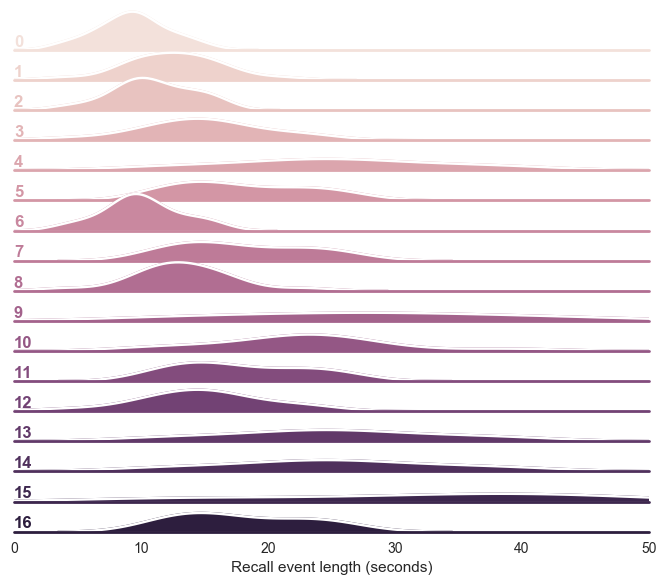

In [288]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Create the data
inds = np.argsort(hand_rec)[::-1]
data = [(k, v[1]) for (k, l) in enumerate(np.array(ev_lens)[inds]) for v in enumerate(l)]
df = pd.DataFrame(data, columns=["g", "Recall event length (seconds)"])

# Initialize the FacetGrid object
pal = sns.cubehelix_palette(17, light=.90)
g = sns.FacetGrid(df, row="g", hue="g", aspect=20, size=.35, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "Recall event length (seconds)", clip_on=True, shade=True, alpha=1)
g.map(sns.kdeplot, "Recall event length (seconds)", clip_on=True, color="w")
g.map(plt.axhline, y=0, lw=2, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color, 
            ha="left", va="center", transform=ax.transAxes)

g.map(label, "Recall event length (seconds)")

# Set the subplots to overlap
g.fig.subplots_adjust(hspace=-.25)

# Remove axes details that don't play will with overlap
g.set_titles("")
g.set(yticks=[])
g.set(xlim=[0, 50])
g.despine(bottom=True, left=True)
# plt.savefig('../figures/eventlen_dists.pdf')

## Are the lengths of the scenes and the lengths of the scene descriptions correlated?

In [289]:
max_mappings = [np.argmax(1 - cdist(model_segments, segment, 'correlation'), 0) for segment in segments]
ev = event.EventSegment(34)
ev.fit(movie_model)
movie_lens = np.sum(np.array([np.round(e).astype(int) for e in ev.segments_[0].T]), 1)

res = []
for i, m in enumerate(movie_lens):
    vals = []
    for j, k in zip(max_mappings, ev_lens):
        if i in j:
            vals.append(k[np.where(j==i)[0][0]])
    res.append((m, np.mean(vals)))

/usr/local/Cellar/python3/3.6.1/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)


## Surprisingly, no correlation between movie and recall duration

But perhaps this could be due to dialation / compression of some of the scenes?

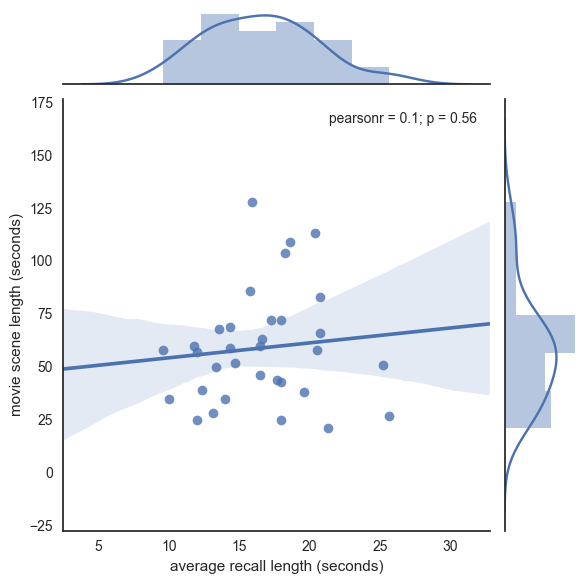

In [290]:
df = pd.DataFrame(res, columns=['movie scene length (seconds)', 'average recall length (seconds)'])
plt.rcParams['pdf.fonttype'] = 42
sns.jointplot(data=df, y='movie scene length (seconds)', x='average recall length (seconds)', kind='reg')

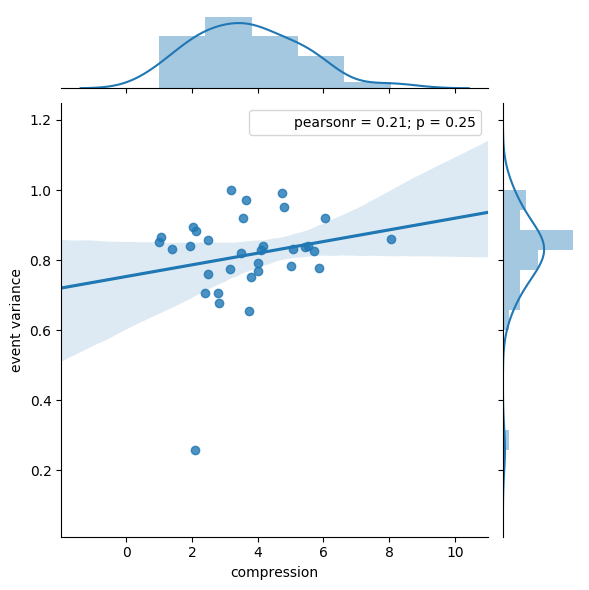

In [291]:
sns.reset_defaults()
event_var = np.array([((movie_model[ev.segments_[0][:,i]>0, :] - movie_model[ev.segments_[0][:,i]>0, :].mean(0))**2).mean() for i in range(34)])
df = pd.DataFrame(res, columns=['movie scene length (seconds)', 'average recall length (seconds)'])
df['event variance'] = event_var/np.max(event_var)
df['compression'] = df['movie scene length (seconds)']/df['average recall length (seconds)']
sns.jointplot(data=df, y='event variance', x='compression', kind='reg')

## Is movie/recall scene duration correlated with memorability (i.e. the proportion of subjects that remembered the scene)?

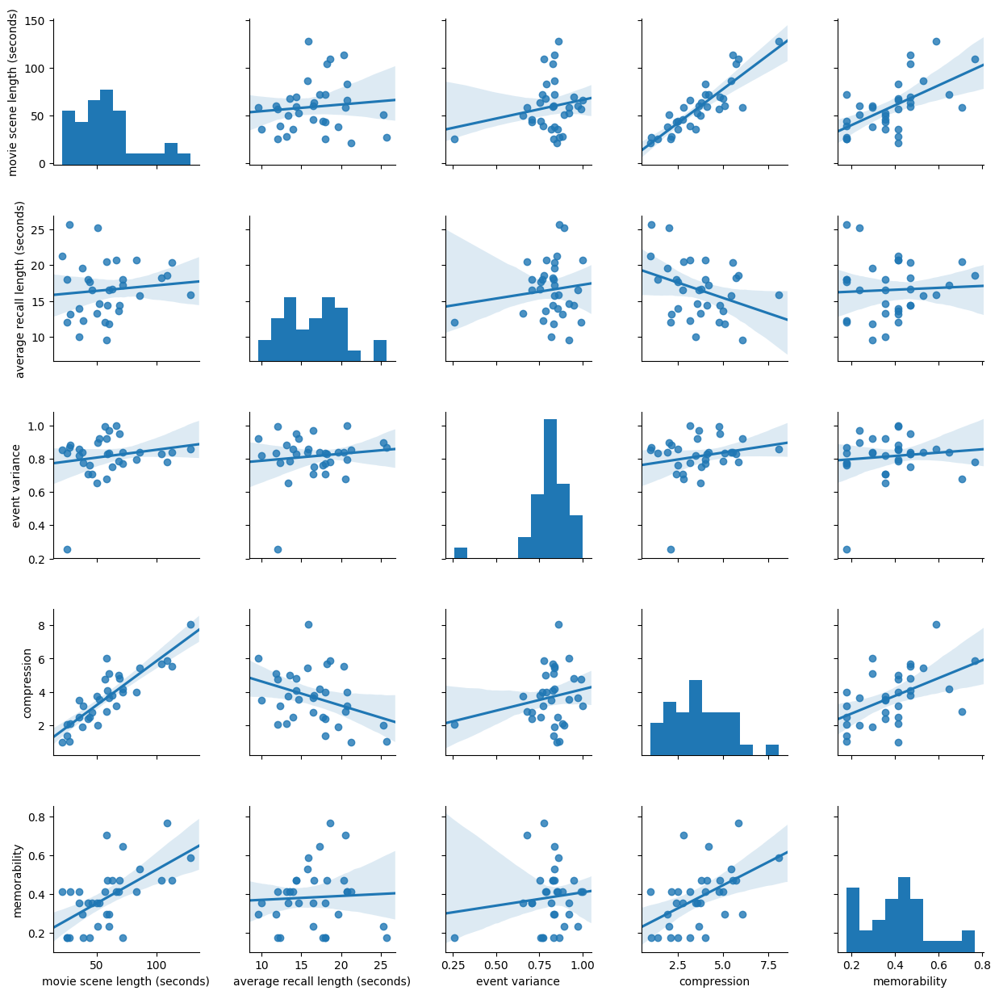

In [292]:
df2 = df.copy()
df2['memorability'] = pd.Series(memory, name='memorability')
df2 = df2[~df2.isna().any(1)]
g = sns.PairGrid(df2)
g = g.map_diag(plt.hist)
g = g.map_offdiag(sns.regplot)
plt.show()

In [ ]:
sns.set_context('paper')
sns.jointplot(data=df2, y='memorability', x='movie scene length (seconds)', space=False, kind='reg')
plt.rcParams['pdf.fonttype'] = 42
plt.savefig('../figures/mem_length_acrossevs.pdf')

In [ ]:
high_inds = df2['memorability']>df2['memorability'].mean()
low_inds =  ~high_inds
df2['split'] = ['high memorability' if i==True else 'low memorability' for i in high_inds]
sns.barplot(data=df2, y='event variance', x='split')
ttest(df2['event variance'][high_inds], df2['event variance'][low_inds])

## Memory accuracy (precision)?

In [ ]:
# sns.jointplot(pd.Series(precision, name='precision'), df['movie scene length (seconds)'], kind='reg')
# sns.jointplot(pd.Series(precision, name='precision'), df['average recall length (seconds)'], kind='reg')
# sns.jointplot(pd.Series(precision, name='precision'), df['movie/recall length ratio'], kind='reg')
df3 = df.copy()
df3['precision'] = pd.Series(precision, name='precision')
df3 = df3[~df3.isna().any(1)]
g = sns.PairGrid(df3)
g = g.map_diag(plt.hist)
g = g.map_offdiag(sns.regplot)
plt.show()

## Distinctiveness?

In [ ]:
# sns.jointplot(pd.Series(distinctiveness, name='distinctiveness'), df['movie scene length (seconds)'], kind='reg')
# sns.jointplot(pd.Series(distinctiveness, name='distinctiveness'), df['average recall length (seconds)'], kind='reg')
# sns.jointplot(pd.Series(distinctiveness, name='distinctiveness'), df['movie/recall length ratio'], kind='reg')

df4 = df.copy()
df4['distinctiveness'] = pd.Series(distinctiveness, name='distinctiveness')
df4 = df4[~df4.isna().any(1)]
g = sns.PairGrid(df4)
g = g.map_diag(plt.hist)
g = g.map_offdiag(sns.regplot)
plt.show()

## Importance?

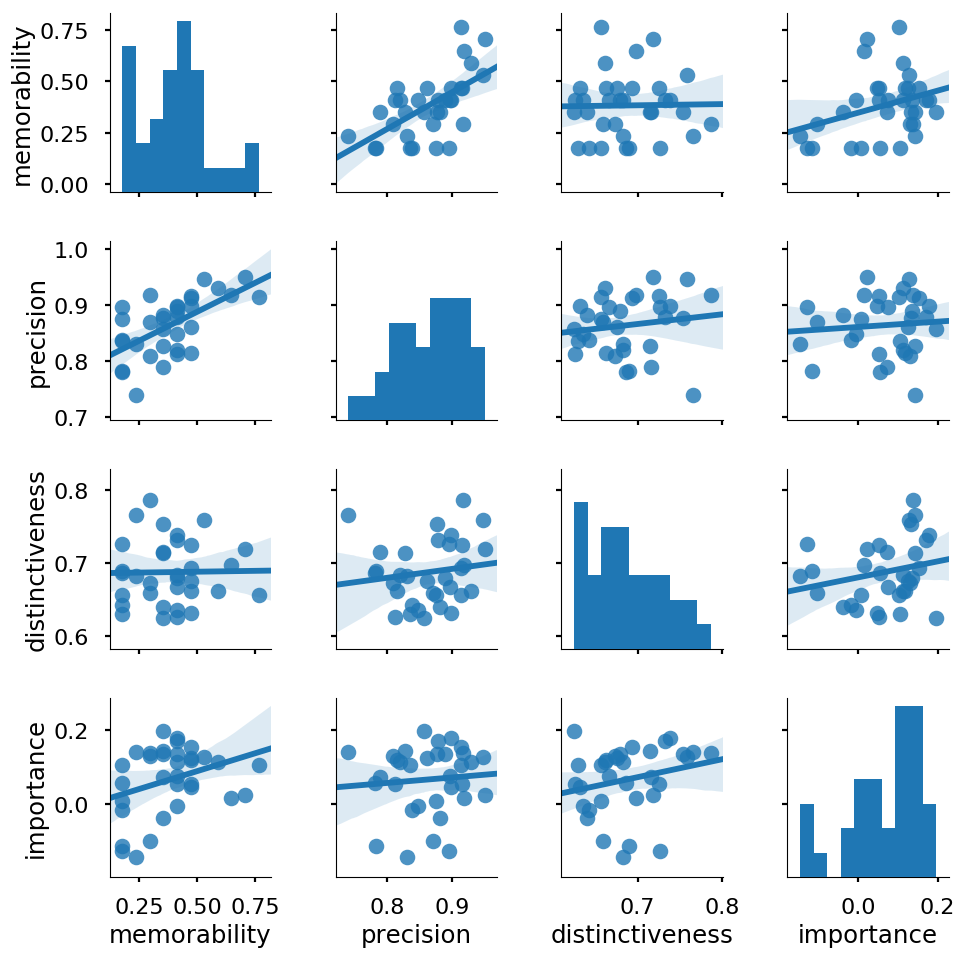

In [261]:
# sns.jointplot(pd.Series(importance, name='importance'), df['movie scene length (seconds)'], kind='reg')
# sns.jointplot(pd.Series(importance, name='importance'), df['average recall length (seconds)'], kind='reg')
# sns.jointplot(pd.Series(importance, name='importance'), df['movie/recall length ratio'], kind='reg')
df5 = df.copy()
df5['importance'] = pd.Series(importance, name='importance')
df5 = df5[~df5.isna().any(1)]
g = sns.PairGrid(df5)
g = g.map_diag(plt.hist)
g = g.map_offdiag(sns.regplot)
plt.show()

In [ ]:
sns.jointplot(distinctiveness[~np.isnan(importance)], importance[~np.isnan(importance)], kind='reg')

In [ ]:
sns.jointplot(memory[~np.isnan(importance)], importance[~np.isnan(importance)], kind='reg')

In [ ]:
sns.jointplot(precision[~np.isnan(importance)], importance[~np.isnan(importance)], kind='reg')

In [ ]:
sns.jointplot(np.array(list(map(lambda x: x[0], res)))[~np.isnan(importance)], importance[~np.isnan(importance)], kind='reg')

In [ ]:
sns.jointplot(np.array(list(map(lambda x: x[1], res)))[~np.isnan(importance)], importance[~np.isnan(importance)], kind='reg')

In [ ]:
sns.reset_defaults()
hyp.plot(memacc.T, 'o', reduce='UMAP', normalize='within', n_clusters=3)

In [ ]:
cp=[]
for i in range(memacc.shape[1]):
    cp.append(memacc[np.where(memacc[:, i]==1)[0],:].mean(0))
cp=np.array(cp)
cp = cp[:,~np.isnan(cp).any(1)][~np.isnan(cp).any(1),:]


In [ ]:
sns.reset_defaults()
data = embeddings[-1]
plt.scatter(data[:,0], data[:,1], s=(30*memory)**2, cmap=plt.cm.spectral, c=list(range(nevents)))
inds = np.triu_indices_from(cpt, k=1)
for i, j in zip(inds[0], inds[1]):
    if cpt[i,j]>2:
        plt.plot([data[i, 0], data[j, 0]] , [data[i, 1], data[j, 1]], linewidth=cpt[i,j]/2, c='k', alpha=.25)

In [ ]:
C = cp
C[C<.75]=0
G = nx.from_numpy_matrix(C)

In [ ]:
sns.heatmap(cp)

In [ ]:
plt.plot(importance)

In [ ]:
cpt=[]
for i in range(memacc.shape[1]):
    try:
        cpt.append(ttest(memacc[np.where(memacc[:, i]==1)[0],:], memacc[np.where(memacc[:, i]==0)[0],:]).statistic.ravel())
    except:
        cpt.append(np.zeros((34)))
cpt=np.array(cpt)
cpt[np.diag_indices_from(cpt)]=0
# cp = cp[:,~np.isnan(cp).any(1)][~np.isnan(cp).any(1),:]
sns.heatmap(cpt, vmax=5)

In [ ]:
plt.plot(np.nansum(cpt, 1))

In [ ]:
sns.jointplot(y=memory, x=np.nanmean(cpt>0, 1), kind='reg')
plt.ylabel('Memorability')
plt.xlabel('Importance')

In [272]:
cp=[]
cpn=[]

for i in range(memacc.shape[1]):
    cp.append(memacc[np.where(memacc[:, i]==1)[0],:].mean(0))
    cpn.append(memacc[np.where(memacc[:, i]==0)[0],:].mean(0))
    
cp=np.array(cp)
cpn=np.array(cpn)

# cp = cp[:,~np.isnan(cp).any(1)][~np.isnan(cp).any(1),:]
importance=(cp-cpn).mean(1)
importance

/usr/local/Cellar/python3/3.6.1/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice.
  """


array([ 0.15998217,  0.16470588,  0.19621849,  0.16742081,  0.14460784,
        0.13907563,  0.09937611, -0.11142534,  0.08193277,  0.04456328,
        0.1605042 ,  0.08210784,  0.1394958 ,  0.01260504,  0.15155229,
       -0.08263305,  0.20336134,         nan,  0.15637255,  0.13065611,
        0.0751634 ,  0.13165266,  0.05196078, -0.09453782,  0.16755793,
        0.08403361,  0.02478992,  0.10336134,  0.15400327, -0.06862745,
        0.17933007, -0.00668449,  0.22058824,  0.03641457])

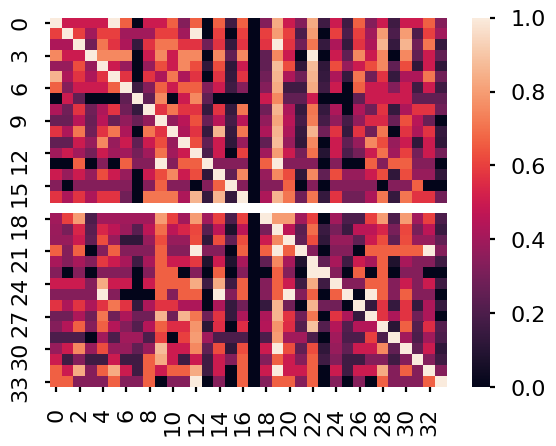

In [226]:
sns.heatmap(cp)

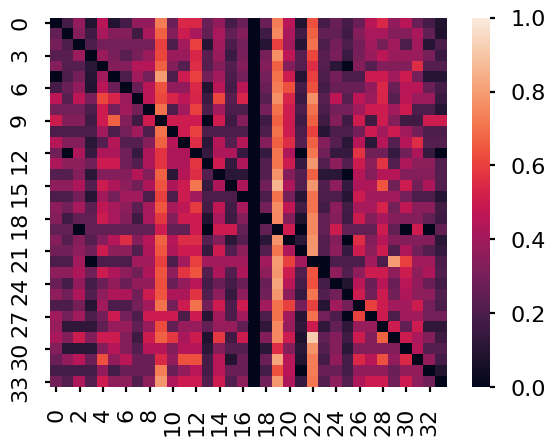

In [227]:
sns.heatmap(cpn, vmax=1)

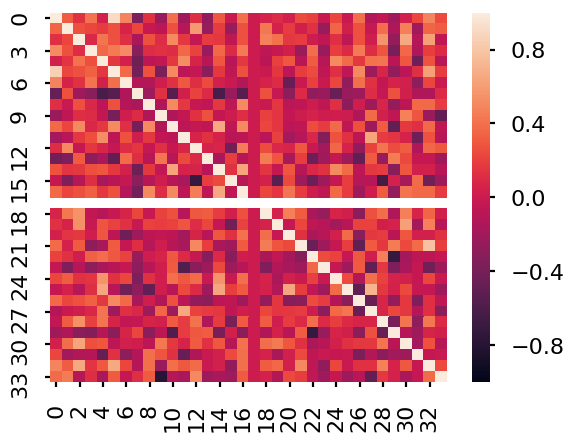

In [228]:
sns.heatmap(cp-cpn, vmin=-1, vmax=1)

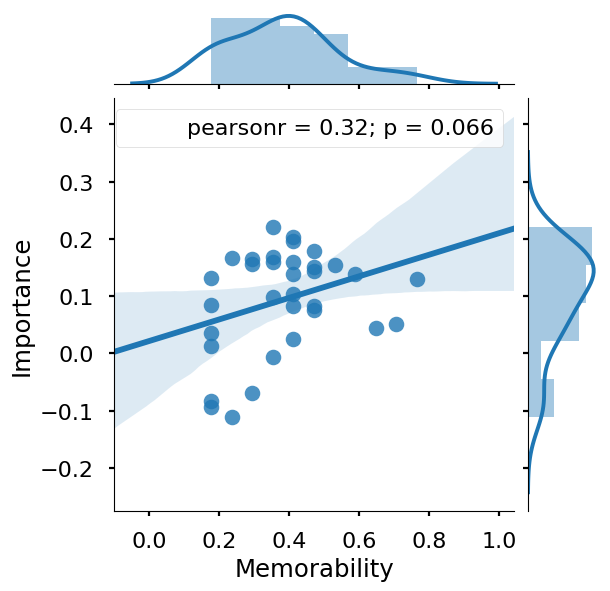

In [273]:
sns.jointplot(memory, importance, kind='reg')
plt.ylabel('Importance')
plt.xlabel('Memorability')
plt.savefig('../figures/importance_memorability.pdf')

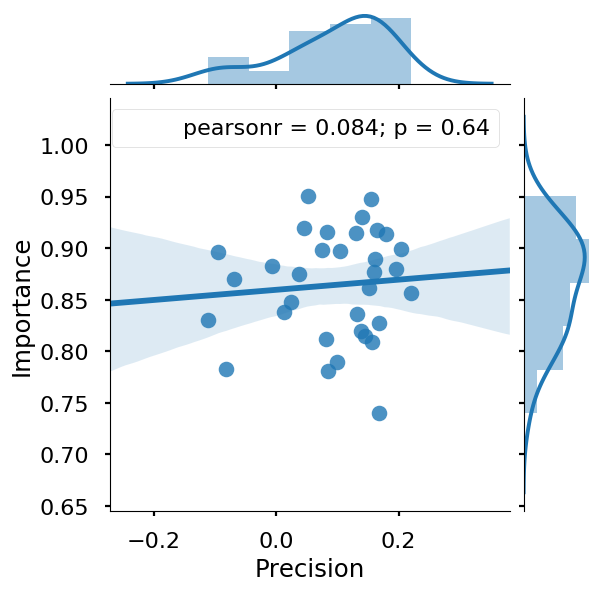

In [274]:
sns.jointplot(importance, precision, kind='reg')
plt.ylabel('Importance')
plt.xlabel('Precision')
plt.savefig('../figures/importance_precision.pdf')

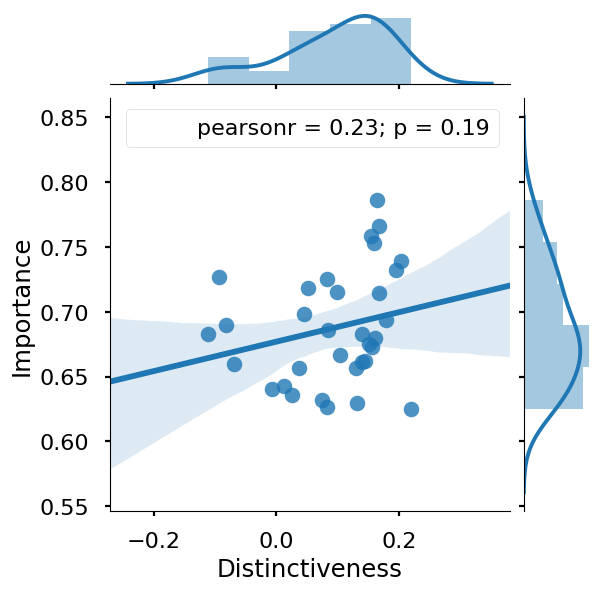

In [275]:
sns.jointplot(importance, distinctiveness, kind='reg')
plt.ylabel('Importance')
plt.xlabel('Distinctiveness')
plt.savefig('../figures/importance_distinctiveness.pdf')

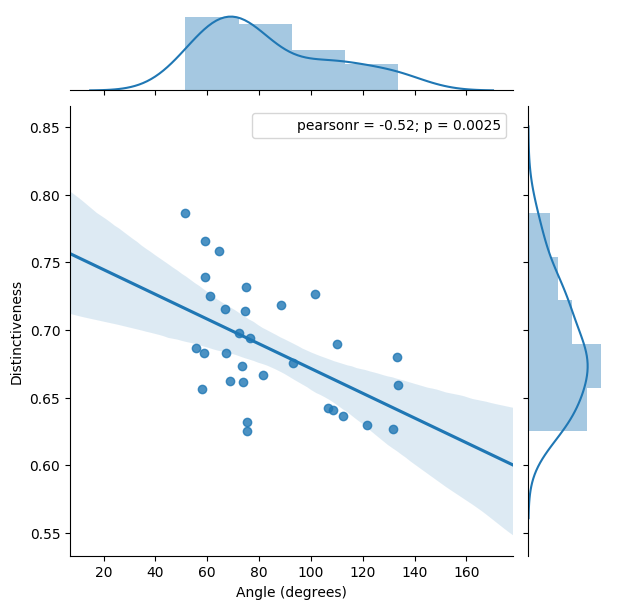

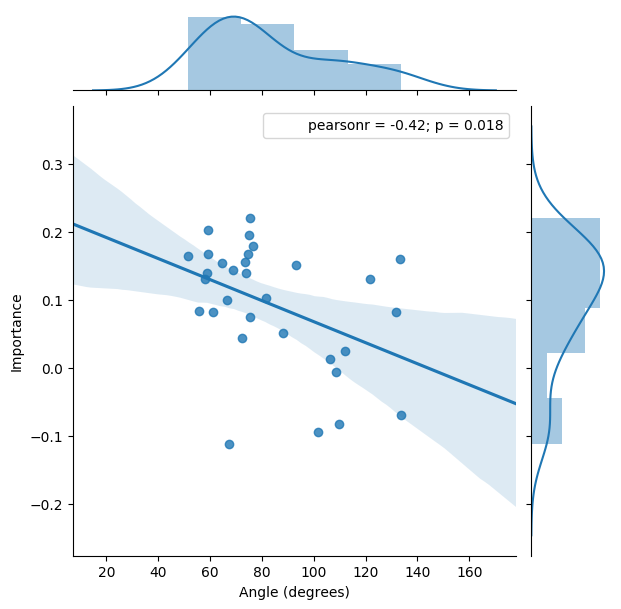

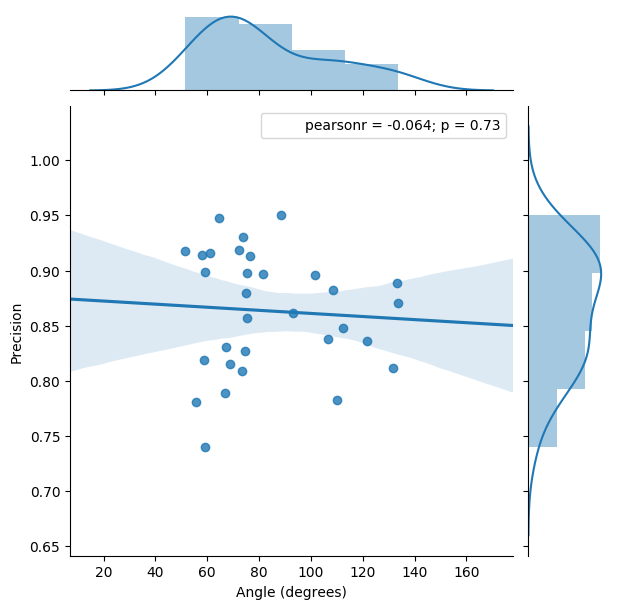

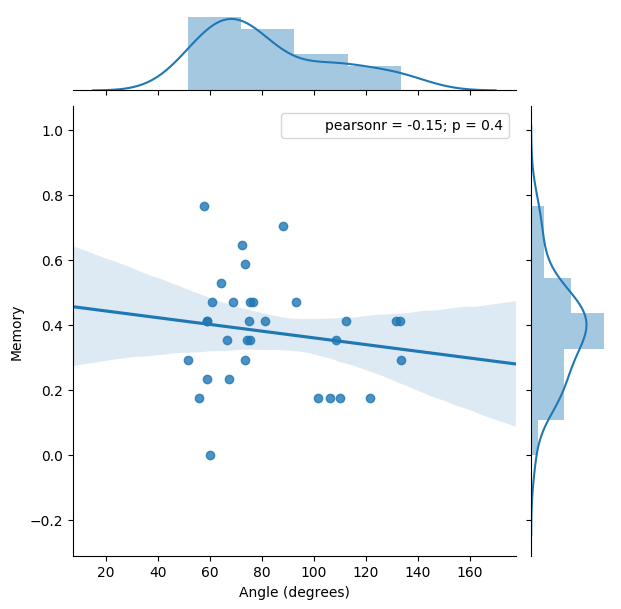

In [350]:
import numpy as np
angles=[]
thetas=[]
for i in range(1, len(model_segments)-1):

    a = avg_events[i-1,:]
    b = avg_events[i,:]
    c = avg_events[i+1,:]

    ba = a - b
    bc = c - b

    cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
    angle = np.arccos(cosine_angle)

    angles.append(np.degrees(angle))
    thetas.append(angle)
    
sns.jointplot(np.array(angles), distinctiveness[1:-1], kind='reg')
plt.ylabel('Distinctiveness')
plt.xlabel('Angle (degrees)')
plt.savefig('../figures/angle_distinctiveness.pdf')

sns.jointplot(np.array(angles), importance[1:-1], kind='reg')
plt.ylabel('Importance')
plt.xlabel('Angle (degrees)')
plt.savefig('../figures/angle_importance.pdf')

sns.jointplot(np.array(angles), precision[1:-1], kind='reg')
plt.ylabel('Precision')
plt.xlabel('Angle (degrees)')
plt.savefig('../figures/angle_precision.pdf')

sns.jointplot(np.array(angles), memory[1:-1], kind='reg')
plt.ylabel('Memory')
plt.xlabel('Angle (degrees)')
plt.savefig('../figures/anglememory.pdf')

In [386]:
importance

array([ 0.15998217,  0.16470588,  0.19621849,  0.16742081,  0.14460784,
        0.13907563,  0.09937611, -0.11142534,  0.08193277,  0.04456328,
        0.1605042 ,  0.08210784,  0.1394958 ,  0.01260504,  0.15155229,
       -0.08263305,  0.20336134,         nan,  0.15637255,  0.13065611,
        0.0751634 ,  0.13165266,  0.05196078, -0.09453782,  0.16755793,
        0.08403361,  0.02478992,  0.10336134,  0.15400327, -0.06862745,
        0.17933007, -0.00668449,  0.22058824,  0.03641457])

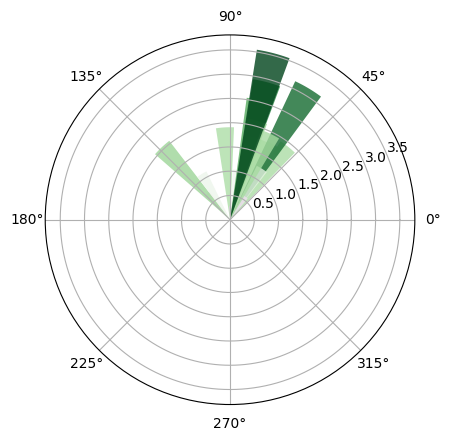

In [391]:
import numpy as np
import matplotlib.pyplot as plt

N = len(angles)
bottom = 0
max_height = 1

theta = thetas
radii = importance[1:-1]
width = (2*np.pi) / N

ax = plt.subplot(111, polar=True)
bars = ax.bar(theta, radii, width=width, bottom=bottom)

tmp = importance[1:-1]-min(importance[1:-1])
tmp/=max(tmp)
colors = plt.cm.PRGn(tmp)

# Use custom colors and opacity
for i, (r, bar) in enumerate(zip(radii, bars)):
    bar.set_facecolor(colors[i])
    bar.set_alpha(0.8)
plt.show()

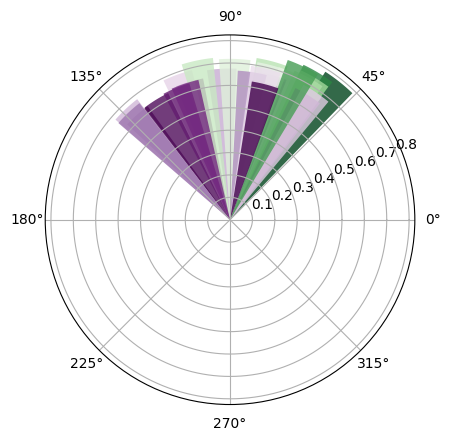

In [399]:
import numpy as np
import matplotlib.pyplot as plt

N = len(angles)
bottom = 0
max_height = 1

theta = thetas
radii = distinctiveness[1:-1]
width = (2*np.pi) / N

ax = plt.subplot(111, polar=True)
bars = ax.bar(theta, radii, width=width, bottom=bottom)

tmp = distinctiveness[1:-1]-min(distinctiveness[1:-1])
tmp/=max(tmp)
colors = plt.cm.PRGn(tmp)
# Use custom colors and opacity
for i, (r, bar) in enumerate(zip(radii, bars)):
    bar.set_facecolor(colors[i])
    bar.set_alpha(0.8)
plt.show()

In [234]:
inds = np.argsort(importance[1:-1])
plt.bar(range(32), np.array(angles)[inds])

NameError: name 'angles' is not defined

In [235]:
transitions = np.zeros((34,34))
for sub in max_mappings:
    for i in range(len(sub)-1):
        transitions[sub[i], sub[i+1]]+=1

In [236]:
norm_transitions=transitions/np.sum(transitions, 1)

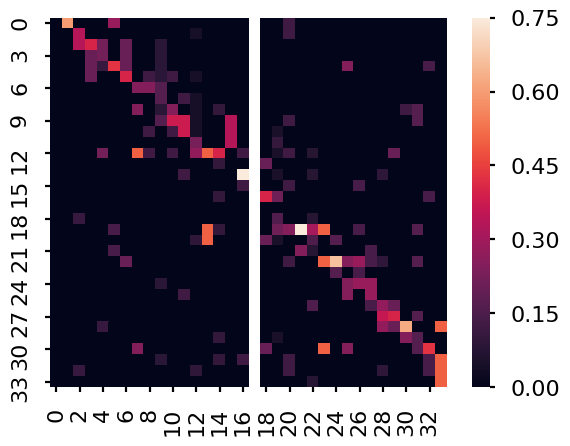

In [237]:
sns.heatmap(norm_transitions)

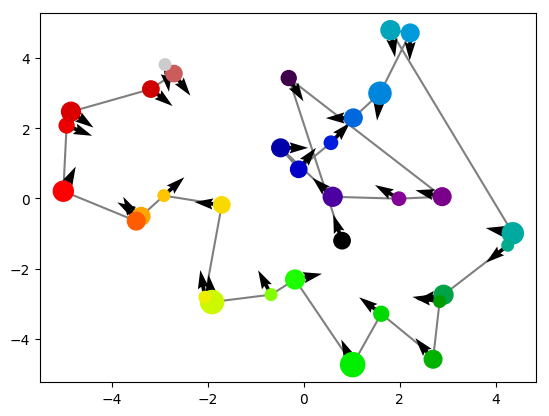

In [953]:
plt.scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=s*300, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=2)
plt.plot(embeddings[-1][:,0], embeddings[-1][:,1], 'k', zorder=1, alpha=.5)
for i, current in enumerate(embeddings[-1]):
    inds = np.where(norm_transitions[i,:]>0)[0]
    weights = np.atleast_2d(norm_transitions[i,inds])
    vecs=embeddings[-1][inds,:]-current
    vec=np.dot(weights, vecs).ravel()
#     vec/=np.linalg.norm(vec)
    plt.quiver(current[0], current[1], vec[0],  vec[1])
#     plt.plot([current[0], current[0]+vec[0]], [current[1],  current[1]+vec[1]], c='k')
# plt.ylim(-5,5)
# plt.xlim(-5,5)

In [ ]:
from scipy.stats import circvar

In [ ]:
plt.scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=s*300, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=2)
plt.plot(embeddings[-1][:,0], embeddings[-1][:,1], 'k', zorder=1, alpha=.5)
for i, current in enumerate(embeddings[-1]):
    inds = np.where(norm_transitions[i,:]>0)[0]
    weights = np.atleast_2d(norm_transitions[i,inds])
    vecs=embeddings[-1][inds,:]-current
    vec=np.dot(weights, vecs).ravel()
#     vec/=np.linalg.norm(vec)
    plt.quiver(current[0], current[1], vec[0],  vec[1])
#     plt.plot([current[0], current[0]+vec[0]], [current[1],  current[1]+vec[1]], c='k')
# plt.ylim(-5,5)
# plt.xlim(-5,5)

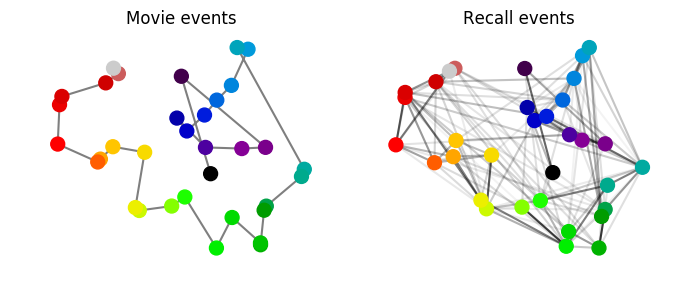

In [811]:
plt.rc('figure', figsize=(8,3))
f, axarr = plt.subplots(1, 2)
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].plot(embeddings[-1][:,0], embeddings[-1][:,1], 'k', zorder=1, alpha=.5)
axarr[0].scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=100, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=2)
axarr[0].set_title('Movie events')
for i in range(norm_transitions.shape[0]):
    for j in range(norm_transitions.shape[1]):
        if norm_transitions[i,j]>0:
            axarr[1].plot([embeddings[-2][i,0],embeddings[-2][j,0]],[embeddings[-2][i,1], embeddings[-2][j,1]], 'k', zorder=1, alpha=norm_transitions[i,j])
axarr[1].scatter(embeddings[-2][avg_events.sum(1)>0,0], embeddings[-2][avg_events.sum(1)>0,1], s=100, cmap=plt.cm.spectral, c=np.array(list(range(nevents)))[avg_events.sum(1)>0], zorder=2)
axarr[1].set_title('Recall events')
# plt.savefig('../figures/group_embedding.pdf')
plt.show()

In [496]:
!pip3 install fastdtw

    100% |████████████████████████████████| 122kB 2.4MB/s ta 0:00:01
  Running setup.py bdist_wheel for fastdtw ... done
  Stored in directory: /Users/andyheusser/Library/Caches/pip/wheels/61/62/46/5a9cc316aa50cc4fb36fd4bf14e7dd206642db3247d7746c23
Successfully built fastdtw
You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [497]:
import fastdtw

In [556]:
dists = [[] for _ in range(34)]
for seg, m in zip(segments, max_mappings):
    full = seg
    inds = np.array((range(seg.shape[0])))
    for i, mi in zip(inds, m):
        dists[mi].append(fastdtw.dtw(seg,seg[inds!=i])[0])

/usr/local/Cellar/python3/3.6.1/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  


/usr/local/Cellar/python3/3.6.1/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)


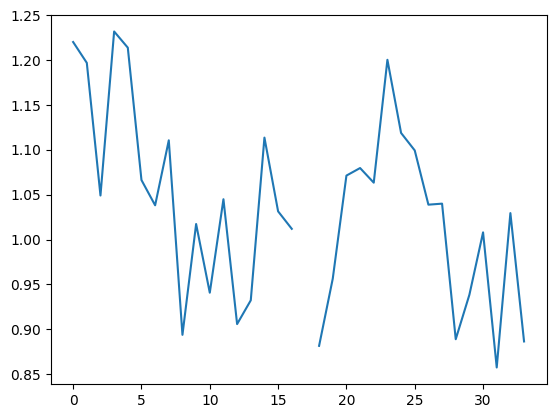

In [559]:
importance2=np.array([np.mean(x) for x in dists])
plt.plot(importance2)

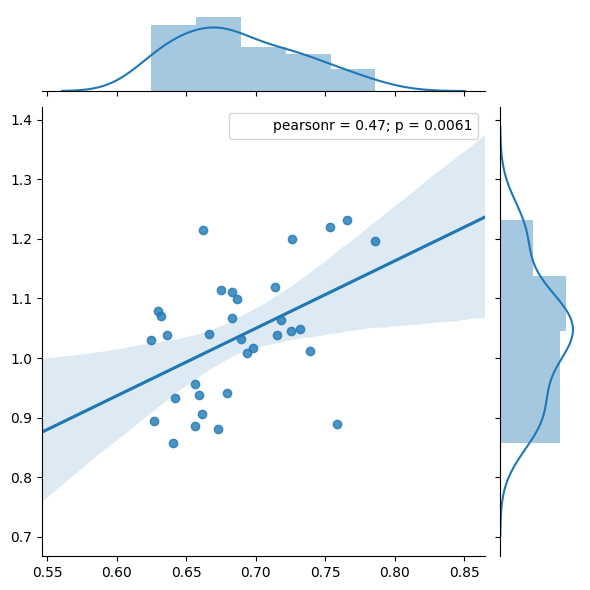

In [558]:
sns.reset_defaults()
sns.jointplot(distinctiveness, importance2, kind='reg')

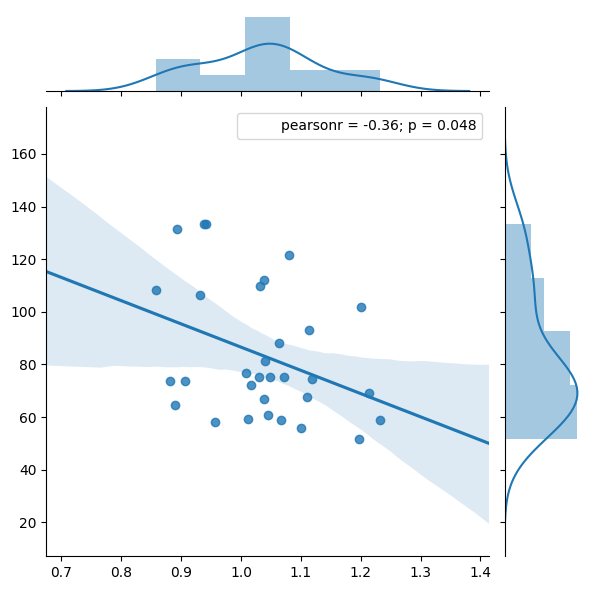

In [528]:
sns.jointplot(importance2[1:-1], np.array(angles), kind='reg')

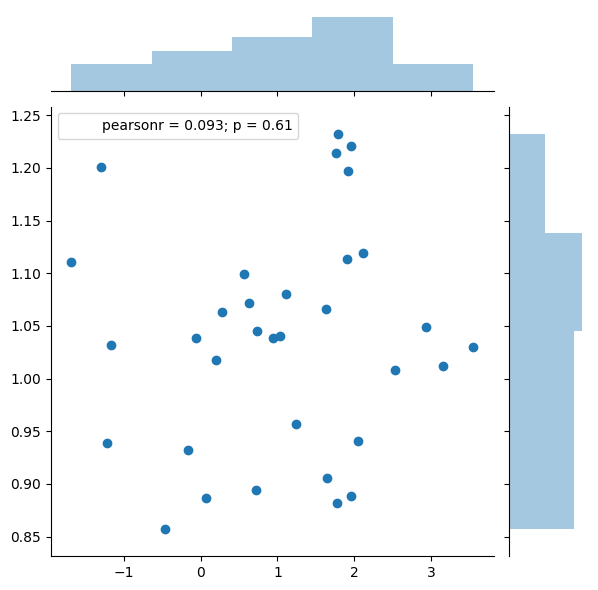

In [560]:
sns.jointplot(importance, importance2)

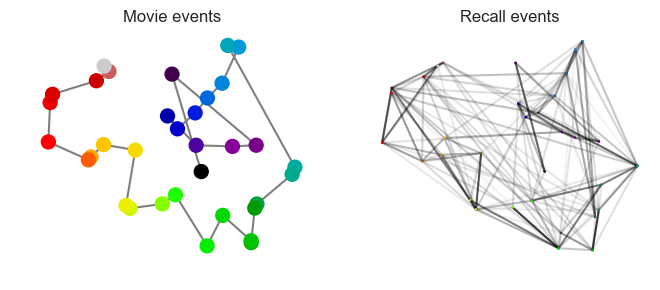

In [722]:
plt.rc('figure', figsize=(8,3))
f, axarr = plt.subplots(1, 2)
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].plot(embeddings[-1][:,0], embeddings[-1][:,1], 'k', zorder=1, alpha=.5)
axarr[0].scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=100, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=2)
axarr[0].set_title('Movie events')
for i in range(norm_transitions.shape[0]):
    for j in range(norm_transitions.shape[1]):
        if norm_transitions[i,j]>0:
            axarr[1].plot([embeddings[-2][i,0],embeddings[-2][j,0]],[embeddings[-2][i,1], embeddings[-2][j,1]], 'k', zorder=1, alpha=norm_transitions[i,j])
axarr[1].scatter(embeddings[-2][avg_events.sum(1)>0,0], embeddings[-2][avg_events.sum(1)>0,1], s=i2n*200, cmap=plt.cm.spectral, c=np.array(list(range(nevents)))[avg_events.sum(1)>0], zorder=2)
axarr[1].set_title('Recall events')
plt.show()

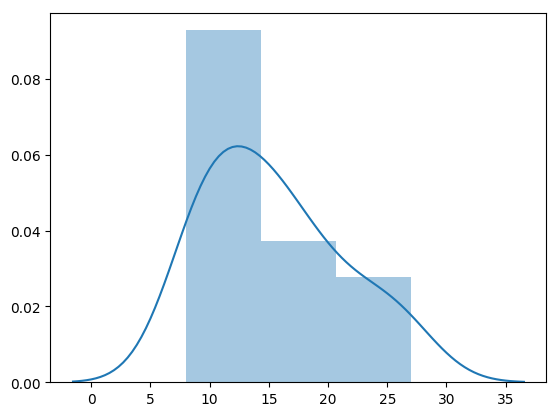

In [564]:
sns.distplot(maxks_penalty)

In [622]:
veps=34/(1976*1.5)
reps=np.mean(maxks_penalty/(np.array([r.shape[0] for r in recall_models])*1.5))
reps/veps


7.154645374218057

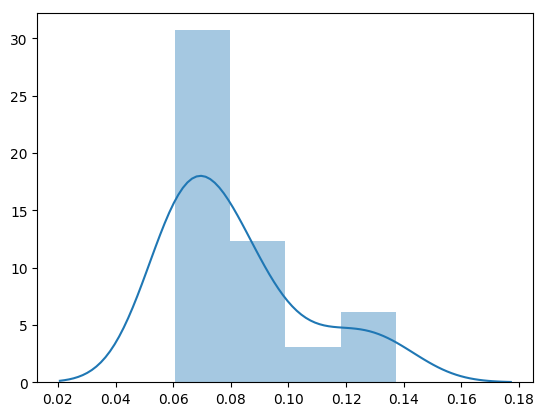

In [618]:
sns.distplot(maxks_penalty/(np.array([r.shape[0] for r in recall_models])*1.5))

In [804]:
s = memory
s-=min(s)
s/=max(s)

/usr/local/Cellar/python3/3.6.1/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/seaborn/distributions.py:645: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


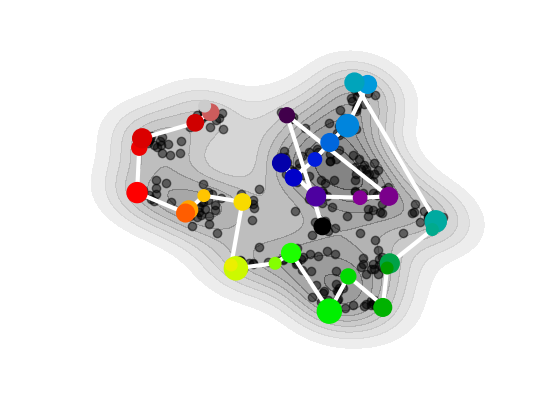

In [805]:
sns.reset_defaults()
alldata=np.vstack(embeddings[:-2])
sns.kdeplot(alldata, shade=True, shade_lowest=False, cmap='gray_r', alpha=.5)
plt.scatter(alldata[:,0], alldata[:,1], zorder=2, alpha=.5, c='k')
plt.scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=s*300, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=3)
plt.plot(embeddings[-1][:,0], embeddings[-1][:,1], 'w', zorder=2, alpha=1, linewidth=3)
plt.axis('off')
plt.show()

# plt.plot(memory)

# # plt.scatter([5, 6, 10, 11, 16, 29], [.5, .5, .5, .5, .5, .5])
# plt.text( 5, memory[5], 'D')
# plt.text( 10, memory[10], 'C')
# plt.text( 16, memory[16], 'B')
# plt.text( 29, memory[29], 'A')
# plt.show()

# plt.plot(importance)
# plt.text( 5, importance[5], 'D')
# plt.text( 10, importance[10], 'C')
# plt.text( 16, importance[16], 'B')
# plt.text( 29, importance[29], 'A')


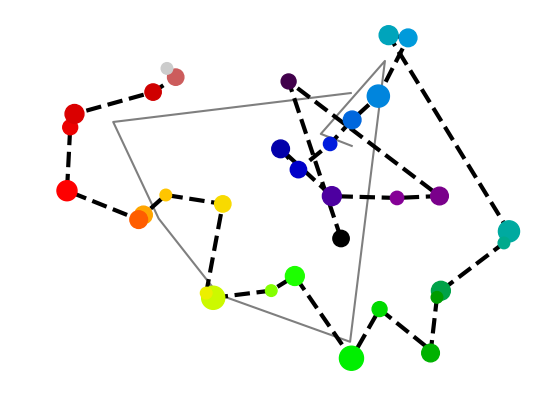

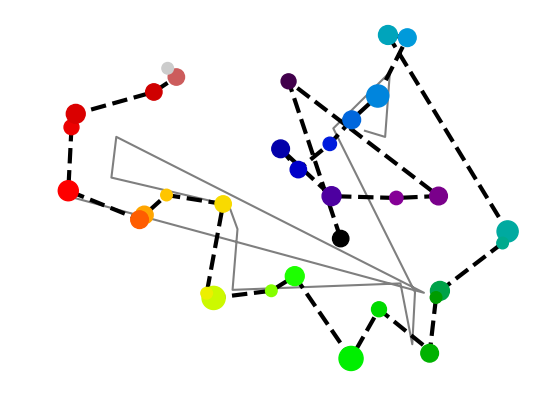

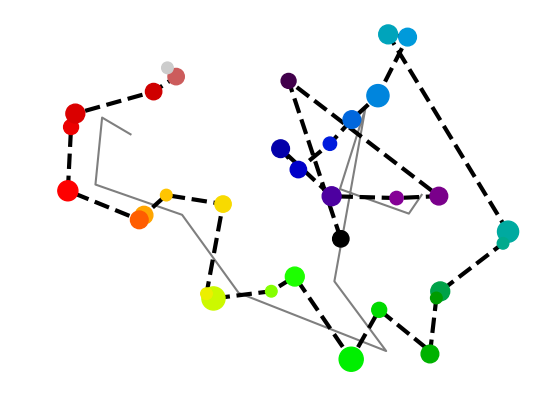

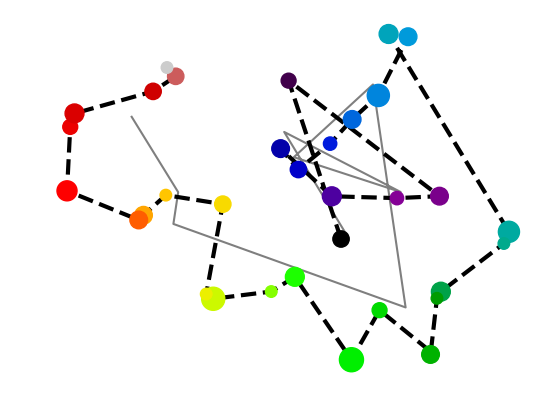

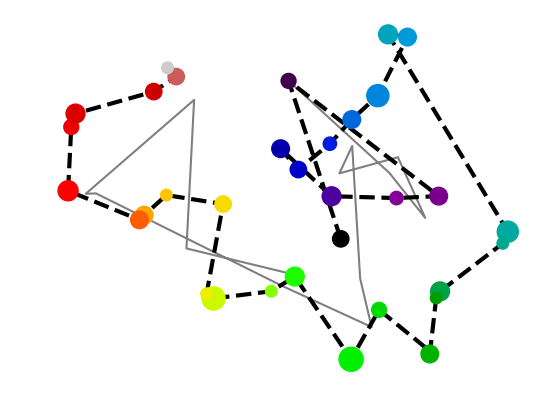

...

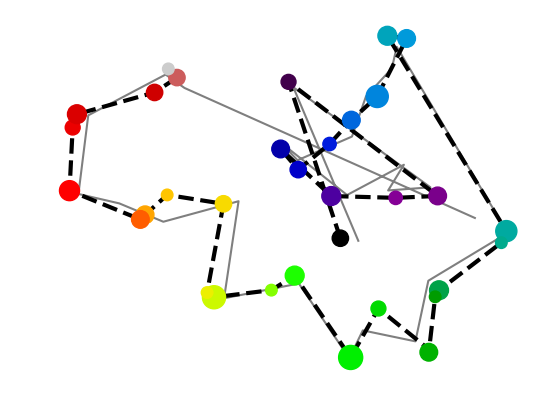

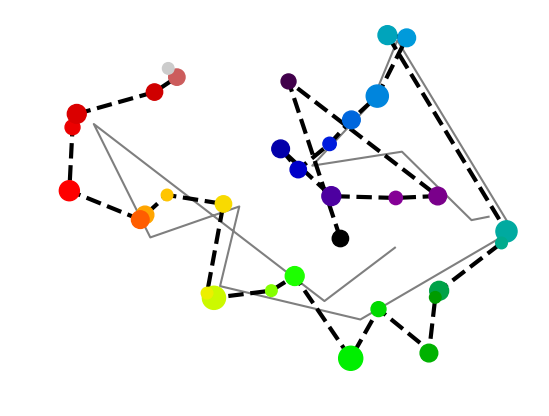

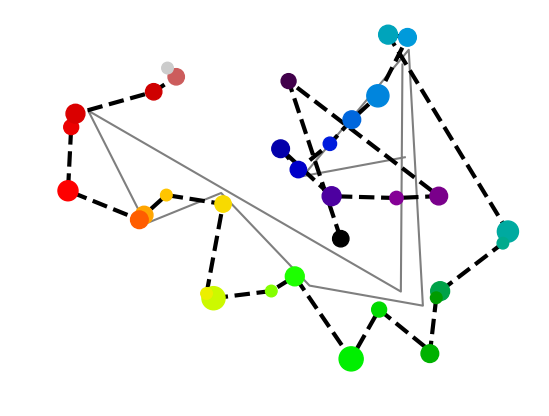

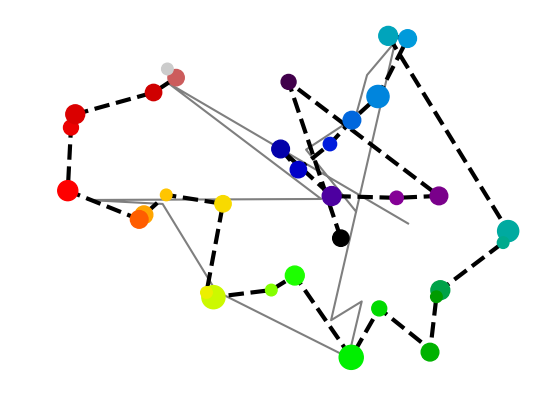

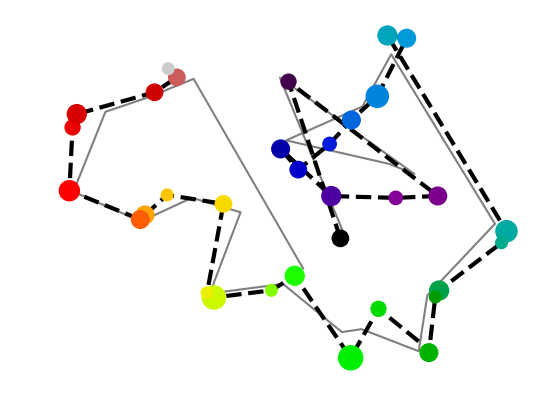

In [806]:
sns.reset_defaults()
alldata=np.vstack(embeddings[:-2])
for embedding in embeddings[:-2]:
    # Plot the nodes using the coordinates of our embedding
    plt.plot(embedding[:,0], embedding[:,1], 'k', zorder=1, alpha=.5)
    plt.scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=s*300, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=3)
    plt.plot(embeddings[-1][:,0], embeddings[-1][:,1], 'k--', zorder=2, alpha=1, linewidth=3)
    plt.axis('off')
    plt.show()

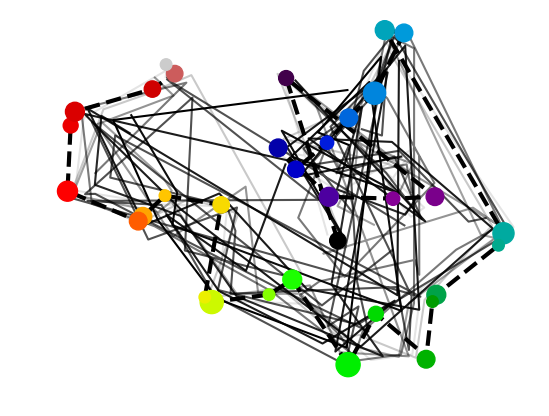

In [848]:
sns.reset_defaults()
w=1-np.array(maxks_penalty.copy())
w-=min(w)
w=w/max(w)
alldata=np.vstack(embeddings[:-2])
plt.scatter(embeddings[-1][:,0], embeddings[-1][:,1], s=s*300, cmap=plt.cm.spectral, c=list(range(nevents)), zorder=3)
plt.plot(embeddings[-1][:,0], embeddings[-1][:,1], 'k--', zorder=2, alpha=1, linewidth=3)
for wi, embedding in zip(w, embeddings[:-2]):
    # Plot the nodes using the coordinates of our embedding
    plt.plot(embedding[:,0], embedding[:,1], 'k', zorder=1, alpha=wi)
    plt.axis('off')
plt.show()

array([ 8,  7, 11, 19, 22, 27, 31,  9])

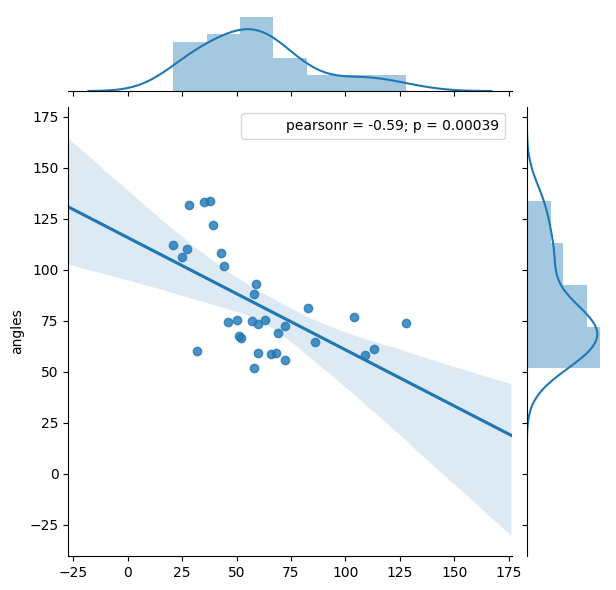

In [642]:
sns.jointplot(y=np.array(angles), x=df['movie scene length (seconds)'].values[1:-1], kind='reg')
plt.ylabel('angles')

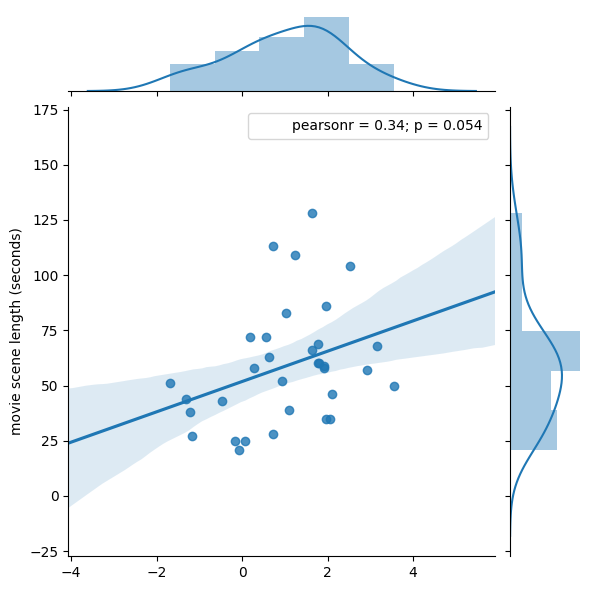

In [629]:
sns.jointplot(importance, df['movie scene length (seconds)'], kind='reg')

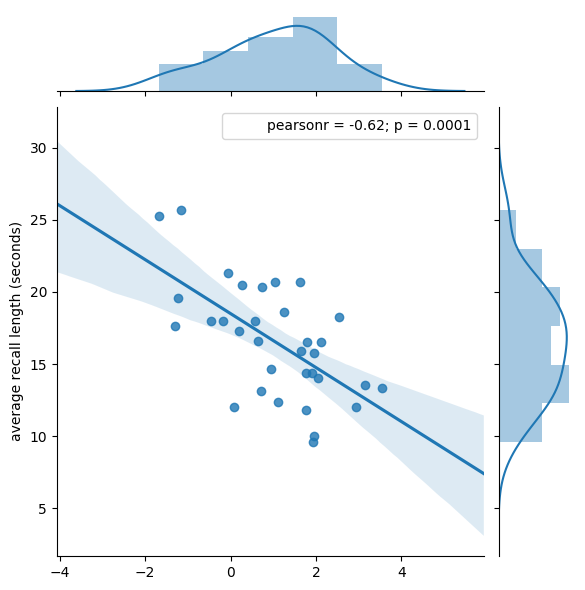

In [641]:
sns.jointplot(importance, df['average recall length (seconds)'], kind='reg')

In [1081]:
np.save('../data/avg_recall_event_model', avg_events)
np.save('../data/recall_event_models', segments)
np.save('../data/video_event_model', model_segments)

In [1082]:
np.save('../data/embeddings', embeddings)

In [1123]:
list(importance)

[0.6965099827343435,
 0.6894407797132763,
 0.8829717590742034,
 0.6644731675438643,
 0.6601359871509288,
 0.6342814440209082,
 0.5026054953130442,
 0.0,
 0.45939055924713923,
 0.35951053627233326,
 0.7143483342071513,
 0.46199362300140684,
 0.6357487582002193,
 0.28949826997681516,
 0.6864446733769635,
 0.09906732141529329,
 0.9250112813855929,
 nan,
 0.6607784332644614,
 0.5591287606676161,
 0.4427261632317347,
 0.5339972323105258,
 0.3752866978536644,
 0.07345407411071504,
 0.7258160486710655,
 0.4310484253838195,
 0.31054625425826243,
 0.5203349868028729,
 0.6960349586438772,
 0.08892737826138598,
 0.8069312074128303,
 0.23420713545289226,
 1.0,
 0.3358611465616147]